<a href="https://colab.research.google.com/github/NguyenBao-dev/Face-Identification-with-Probabilistic-Graphical-Model/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Problem: Face Identification with Probabilistic Graphical Model

## Raw Data

Since Google Classroom was restricting data, please access this Google Drive link to download raw data that was used to train and evaluate the models below

Link: https://drive.google.com/file/d/1GYgVycQ16j1XgstcOU8UlPLamLkNehfo/view?usp=sharing

## Setup

In [ ]:
!pip install kagglehub tensorflow facenet-pytorch pillow numpy pandas scikit-learn pgmpy pomegranate

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 87.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 88.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 82.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.4/98.4 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.5/755.5 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.6/410.6 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.1/14.1 MB 128.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 106.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.6/823.6 kB 50.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 731.7/731.7 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━

In [ ]:
import os
import numpy as np
import pandas as pd
from glob import glob
from tqdm import tqdm
from PIL import Image

import torch
from facenet_pytorch import InceptionResnetV1
from torchvision import transforms

from sklearn.metrics import confusion_matrix
from sklearn.model_selection import StratifiedKFold
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score, precision_recall_fscore_support
from sklearn.preprocessing import KBinsDiscretizer

from pgmpy.models import DiscreteBayesianNetwork, LinearGaussianBayesianNetwork
from pgmpy.estimators import HillClimbSearch, MaximumLikelihoodEstimator
from pgmpy.inference import VariableElimination
from pgmpy.factors.continuous import LinearGaussianCPD

from pomegranate.distributions import Normal, IndependentComponents
from pomegranate.hmm import DenseHMM, SparseHMM
from pomegranate.gmm import GeneralMixtureModel

import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import networkx as nx

import seaborn as sns
import pandas as pd

import kagglehub

## Extract features

Extract features from image with FaceNet

In [ ]:
IMG_SIZE = (160, 160)
transform = transforms.Compose([
    transforms.Resize(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5], [0.5])
])

device = "cuda" if torch.cuda.is_available() else "cpu"
embedder = InceptionResnetV1(pretrained="vggface2").eval().to(device)

def get_embedding(img_path):
    img = Image.open(img_path).convert("RGB")
    x = transform(img).unsqueeze(0).to(device)
    with torch.no_grad():
        emb = embedder(x).cpu().numpy().flatten()
    return emb

  0%|          | 0.00/107M [00:00<?, ?B/s]

In [ ]:
def load_embeddings(data_path, n_persons=10, imgs_per_person=20):
    person_dirs = sorted([d for d in os.listdir(data_path) if os.path.isdir(os.path.join(data_path, d))])[:n_persons]
    embeddings, labels = [], []
    for person in tqdm(person_dirs, desc="Extracting embeddings"):
        image_paths = glob(os.path.join(data_path, person, "*.jpg"))[:imgs_per_person]
        for ip in image_paths:
            try:
                emb = get_embedding(ip)
                embeddings.append(emb)
                labels.append(person)
            except Exception as e:
                print("Skipping", ip, e)
    return np.array(embeddings), np.array(labels)

## Discretization

In [ ]:
def discretize_kbins(train_array, test_array, bins=5):
    enc = KBinsDiscretizer(n_bins=bins, encode="ordinal", strategy="quantile")
    train_disc = enc.fit_transform(train_array).astype(int)
    test_disc = enc.transform(test_array).astype(int)
    return train_disc, test_disc, enc

## Export Excel

In [ ]:
def export_fold_data_to_excel(fold_data, filename, model_name):
    with pd.ExcelWriter(filename, engine="openpyxl", mode="w") as writer:
        for i, data in enumerate(fold_data, 1):
            df_train = pd.DataFrame(data["X_train"])
            df_train["Identity"] = data["y_train"]
            df_test = pd.DataFrame(data["X_test"])
            df_test["Identity"] = data["y_test"]

            df_train.to_excel(writer, sheet_name=f"{model_name}_Fold{i}_Train", index=False)
            df_test.to_excel(writer, sheet_name=f"{model_name}_Fold{i}_Test", index=False)

## pgmpy - Discrete Bayesian Network

### Structure Learning

In [ ]:
def learn_structure_bn(df_train, features, target="Identity"):
    hc = HillClimbSearch(df_train)
    best_model = hc.estimate()
    bn = DiscreteBayesianNetwork(best_model.edges())
    bn.add_nodes_from(features + [target])
    return bn

### Parameter Learning

In [ ]:
def learn_parameters_bn(bn, df_train, features, y_train, bins=5):
    state_names = {"Identity": list(np.unique(y_train))}
    for f in features:
        state_names[f] = list(range(bins))
    bn.fit(df_train, estimator=MaximumLikelihoodEstimator, state_names=state_names)
    return bn, state_names

### Inference

In [ ]:
def make_infer(bn):
    return VariableElimination(bn)

def predict_bn(infer, features, identity_states, X_test):
    preds = []
    for _, row in X_test.iterrows():
        obs = {f: int(row[f]) for f in features}
        q = infer.query(variables=["Identity"], evidence=obs, show_progress=False)
        vals, order = q.values.flatten(), q.state_names["Identity"]
        probs = np.array([vals[order.index(s)] if s in order else 0 for s in identity_states])
        preds.append(identity_states[np.argmax(probs)])
    return preds

### Cross validation

In [ ]:
def cross_validate_discrete_bn(embeddings, labels, pca_dim=10, folds=5, bins=5, show_struct_params=False, export_file=None):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    metrics, models, fold_data = [], [], []

    for fold, (train_idx, test_idx) in enumerate(skf.split(embeddings, labels), 1):
        print(f"\n=== Discrete BN: Fold {fold} ===")
        X_train, X_test = embeddings[train_idx], embeddings[test_idx]
        y_train, y_test = labels[train_idx], labels[test_idx]

        fold_data.append({
            "X_train": X_train,
            "X_test": X_test,
            "y_train": y_train,
            "y_test": y_test
        })

        pca = PCA(n_components=pca_dim, random_state=42)
        X_train_pca, X_test_pca = pca.fit_transform(X_train), pca.transform(X_test)
        features = [f"F{i}" for i in range(pca_dim)]

        X_train_disc, X_test_disc, enc = discretize_kbins(X_train_pca, X_test_pca, bins=bins)
        df_train = pd.DataFrame(X_train_disc, columns=features)
        df_test = pd.DataFrame(X_test_disc, columns=features)
        df_train["Identity"], df_test["Identity"] = y_train, y_test

        bn = learn_structure_bn(df_train, features, target="Identity")
        bn, state_names = learn_parameters_bn(bn, df_train, features, y_train, bins=bins)
        infer = make_infer(bn)

        if show_struct_params:
            print("Learned structure:", bn.edges())
            plot_bn_structure(bn, title=f"Discrete BN Structure - Fold {fold}")

        y_pred = predict_bn(infer, features, state_names["Identity"], df_test)

        acc = accuracy_score(y_test, y_pred)
        prec, rec, f1, _ = precision_recall_fscore_support(
            y_test, y_pred, average="macro", zero_division=0
        )
        print(f"Acc: {acc} \nPrec: {prec} \nRec: {rec} \nF1: {f1}")
        metrics.append((acc, prec, rec, f1))

        models.append({
            "bn": bn,
            "infer": infer,
            "pca": pca,
            "features": features,
            "state_names": state_names,
            "disc_enc": enc
        })

    if export_file:
        export_fold_data_to_excel(fold_data, export_file, "BN")

    return np.array(metrics), models

## pgmpy - Linear Gaussian Bayesian Network

### Structure Learning

In [ ]:
def learn_structure_lgbn(df_train, features, target="Identity_num"):
    hc = HillClimbSearch(df_train)
    best_model = hc.estimate()
    lgbn = LinearGaussianBayesianNetwork(best_model.edges())
    lgbn.add_nodes_from(features + [target])
    return lgbn

### Parameter Learning

In [ ]:
def learn_parameters_lgbn(lgbn, df_train, features, y_train):
    from sklearn.linear_model import LinearRegression

    identities = np.unique(y_train)
    id_map = {id_: i for i, id_ in enumerate(identities)}
    df_train = df_train.copy()
    df_train["Identity_num"] = df_train["Identity"].map(id_map)

    for f in features:
        X = df_train[["Identity_num"]].values
        y = df_train[f].values
        reg = LinearRegression().fit(X, y)
        slope = reg.coef_[0]
        intercept = reg.intercept_
        std = np.std(y - reg.predict(X))

        cpd = LinearGaussianCPD(
            variable=f,
            evidence=["Identity_num"],
            beta=[slope],
            std=std
        )
        lgbn.add_cpds(cpd)

    return lgbn, identities

### Inference

In [ ]:
def predict_lgbn(lgbn, features, identities, id_map, row):
    likelihoods = []

    for identity in identities:
        identity_num = id_map[identity]
        log_prob = 0.0

        for cpd in lgbn.cpds:
            if isinstance(cpd, LinearGaussianCPD) and cpd.variable in features:
                f = cpd.variable
                x_val = row[f]

                beta = cpd.beta[0] if len(cpd.beta) > 0 else 0.0
                std = cpd.std

                mean = beta * identity_num
                log_prob += -0.5 * np.log(2 * np.pi * std**2) - ((x_val - mean) ** 2) / (2 * std**2)

        likelihoods.append(log_prob)

    return identities[np.argmax(likelihoods)]

### Cross validation

In [ ]:
def cross_validate_lgbn(embeddings, labels, pca_dim=10, folds=5, show_struct_params=False, export_file=None):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    metrics, models, fold_data = [], [], []

    for fold, (train_idx, test_idx) in enumerate(skf.split(embeddings, labels), 1):
        print(f"\n=== LGBN: Fold {fold} ===")
        X_train, X_test = embeddings[train_idx], embeddings[test_idx]
        y_train, y_test = labels[train_idx], labels[test_idx]

        fold_data.append({
            "X_train": X_train,
            "X_test": X_test,
            "y_train": y_train,
            "y_test": y_test
        })

        # PCA per fold
        pca = PCA(n_components=pca_dim, random_state=42)
        X_train_pca, X_test_pca = pca.fit_transform(X_train), pca.transform(X_test)
        features = [f"F{i}" for i in range(pca_dim)]

        df_train_cont = pd.DataFrame(X_train_pca, columns=features)
        df_train_cont["Identity"] = y_train
        df_test_cont = pd.DataFrame(X_test_pca, columns=features)
        df_test_cont["Identity"] = y_test

        # Structure + Parameters
        lgbn = learn_structure_lgbn(df_train_cont, features, target="Identity_num")
        lgbn, identities = learn_parameters_lgbn(lgbn, df_train_cont, features, y_train)
        id_map = {id_: i for i, id_ in enumerate(identities)}

        if show_struct_params:
            print("Learned structure:", lgbn.edges())
            plot_bn_structure(lgbn, title=f"LGBN Structure - Fold {fold}")

        # Predictions
        preds = [predict_lgbn(lgbn, features, identities, id_map, row) for _, row in df_test_cont.iterrows()]

        # Metrics
        acc = accuracy_score(y_test, preds)
        prec, rec, f1, _ = precision_recall_fscore_support(y_test, preds, average="macro", zero_division=0)
        print(f"Acc: {acc} \nPrec: {prec} \nRec: {rec} \nF1: {f1}")
        metrics.append((acc, prec, rec, f1))

        # Save model info
        models.append({
            "lgbn": lgbn,
            "pca": pca,
            "features": features,
            "identities": identities,
            "id_map": id_map
        })

    if export_file:
        export_fold_data_to_excel(fold_data, export_file, "LGBN")

    return np.array(metrics), models

## pomegranate - Hidden Makov Model

### Training

In [ ]:
def train_hmm_models(X_train, y_train, n_states=3):
    models = {}
    identities = np.unique(y_train)

    for identity in identities:
        X_id = X_train[y_train == identity]

        sequences = [x.reshape(1, -1, 1) for x in X_id]

        dists = [Normal() for _ in range(n_states)]
        model = DenseHMM(dists)
        model.fit(sequences)

        models[identity] = model

    return models

### Inference

In [ ]:
def predict_hmm(models, x):
    seq = x.reshape(1, -1, 1)
    scores = {identity: model.log_probability(seq) for identity, model in models.items()}
    return max(scores, key=scores.get), scores

### Cross validation

In [ ]:
def cross_validate_hmm(embeddings, labels, pca_dim=10, folds=5, n_components=3, show_struct_params=False, export_file=None):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    metrics, models_list, fold_data = [], [], []

    for fold, (train_idx, test_idx) in enumerate(skf.split(embeddings, labels), 1):
        print(f"\n=== HMM: Fold {fold} ===")
        X_train, X_test = embeddings[train_idx], embeddings[test_idx]
        y_train, y_test = labels[train_idx], labels[test_idx]

        fold_data.append({
            "X_train": X_train,
            "X_test": X_test,
            "y_train": y_train,
            "y_test": y_test
        })

        # PCA
        pca = PCA(n_components=pca_dim, random_state=42)
        X_train_pca, X_test_pca = pca.fit_transform(X_train), pca.transform(X_test)

        # Train HMMs
        models = train_hmm_models(X_train_pca, y_train, n_states=n_components)

        # Predictions
        preds = []
        for x in X_test_pca:
            pred, _ = predict_hmm(models, x)
            preds.append(pred)

        # Metrics
        acc = accuracy_score(y_test, preds)
        prec, rec, f1, _ = precision_recall_fscore_support(y_test, preds, average="macro", zero_division=0)
        print(f"Acc: {acc} \nPrec: {prec} \nRec: {rec} \nF1: {f1}")
        metrics.append((acc, prec, rec, f1))

        # Save for later
        models_list.append({
            "models": models,
            "pca": pca
        })

        if show_struct_params:
            plot_hmm_models(models, fold)

    if export_file:
        export_fold_data_to_excel(fold_data, export_file, "HMM")

    return np.array(metrics), models_list

## pomegranate - General Mixture Model

### Training

In [ ]:
def train_gmm_models(X_train, y_train, n_components=2):
    models = {}
    identities = np.unique(y_train)

    for identity in identities:
        X_id = X_train[y_train == identity]

        dists = [IndependentComponents([Normal() for _ in range(X_train.shape[1])])
                 for _ in range(n_components)]
        gmm = GeneralMixtureModel(dists)
        gmm.fit(X_id)

        models[identity] = gmm

    return models

### Inference

In [ ]:
def predict_gmm(models, x):
    scores = {identity: model.log_probability(x.reshape(1, -1))
              for identity, model in models.items()}
    return max(scores, key=scores.get), scores

### Cross validation

In [ ]:
def cross_validate_gmm(embeddings, labels, pca_dim=10, folds=5, n_components=2, show_struct_params=False, export_file=None):
    skf = StratifiedKFold(n_splits=folds, shuffle=True, random_state=42)
    metrics, models_list, fold_data = [], [], []

    for fold, (train_idx, test_idx) in enumerate(skf.split(embeddings, labels), 1):
        print(f"\n=== GMM: Fold {fold} ===")
        X_train, X_test = embeddings[train_idx], embeddings[test_idx]
        y_train, y_test = labels[train_idx], labels[test_idx]

        fold_data.append({
            "X_train": X_train,
            "X_test": X_test,
            "y_train": y_train,
            "y_test": y_test
        })

        pca = PCA(n_components=pca_dim, random_state=42)
        X_train_pca, X_test_pca = pca.fit_transform(X_train), pca.transform(X_test)

        models = train_gmm_models(X_train_pca, y_train, n_components=n_components)

        preds = []
        for x in X_test_pca:
            pred, _ = predict_gmm(models, x)
            preds.append(pred)

        acc = accuracy_score(y_test, preds)
        prec, rec, f1, _ = precision_recall_fscore_support(y_test, preds, average="macro", zero_division=0)
        print(f"Acc: {acc} \nPrec: {prec} \nRec: {rec} \nF1: {f1}")
        metrics.append((acc, prec, rec, f1))

        models_list.append({
            "models": models,
            "pca": pca
        })

        if show_struct_params:
            plot_gmm_models(models, fold)

    if export_file:
        export_fold_data_to_excel(fold_data, export_file, "GMM")

    return np.array(metrics), models_list

## Visualization

In [ ]:
def plot_bn_structure(bn, title="Learned Bayesian Network"):
    G = nx.DiGraph()
    G.add_nodes_from(bn.nodes())
    G.add_edges_from(bn.edges())

    plt.figure(figsize=(8, 6))
    pos = nx.spring_layout(G, seed=42, k=1.5)

    nx.draw(
        G, pos,
        with_labels=True,
        node_size=2000,
        node_color="lightblue",
        font_size=10,
        font_weight="bold",
        edge_color="gray",
        arrows=True
    )

    isolated = list(nx.isolates(G))
    if isolated:
        nx.draw_networkx_nodes(
            G, pos,
            nodelist=isolated,
            node_color="lightcoral",
            node_size=2000
        )

    plt.title(title)
    plt.show()

In [ ]:
def plot_bn_cpts(bn, max_vars=3):
    cpds = bn.get_cpds()
    n = min(len(cpds), max_vars)

    rows, cols = 5, 2
    fig, axes = plt.subplots(rows, cols, figsize=(20, 20))
    axes = axes.flatten()

    for ax, cpd in zip(axes, cpds[:n]):
        try:
            var = cpd.variable
            var_card = cpd.get_cardinality([var])[var]
            states = list(range(var_card))

            evidence = cpd.get_evidence()
            if evidence:
                evid_cards = [cpd.get_cardinality([e])[e] for e in evidence]
                combos = np.array(np.meshgrid(*[range(c) for c in evid_cards])).T.reshape(-1, len(evidence))
                col_labels = [",".join(map(str, combo)) for combo in combos]
            else:
                col_labels = ["P"]

            mat = np.array(cpd.get_values())
            if mat.ndim == 1:
                mat = mat.reshape(-1, 1)

            df_cpd = pd.DataFrame(mat, index=states, columns=col_labels)

            sns.heatmap(df_cpd, annot=True, fmt=".2f", cmap="Blues", cbar=True, ax=ax)
            ax.set_title(f"CPT: {var}")
        except Exception as e:
            print(f"Error plotting CPT for {cpd.variable}: {e}")
            ax.axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_lgbn_cpds(lgbn, max_vars=5):
    cpds = lgbn.cpds
    n = min(len(cpds), max_vars)

    fig, axes = plt.subplots(1, n, figsize=(5 * n, 4))
    if n == 1:
        axes = [axes]

    for ax, cpd in zip(axes, cpds[:n]):
        try:
            if hasattr(cpd, "beta"):
                betas = cpd.beta
                std = cpd.std
                parents = cpd.evidence if cpd.evidence else []

                coeffs = pd.Series(betas, index=["Intercept"] + parents)
                df_params = coeffs.to_frame("Coefficient")

                sns.barplot(x=df_params.index, y="Coefficient", data=df_params, ax=ax)
                ax.set_title(f"{cpd.variable}\nσ={std:.2f}")
                ax.axhline(0, color="black", linestyle="--", linewidth=1)
                ax.tick_params(axis="x", rotation=45)
            else:
                ax.text(0.5, 0.5, "Not LinearGaussianCPD", ha="center", va="center")
                ax.axis("off")

        except Exception as e:
            print(f"Error plotting params for {getattr(cpd, 'variable', '?')}: {e}")
            ax.axis("off")

    plt.tight_layout()
    plt.show()

In [ ]:
def plot_hmm_models(models, fold=None):
    for identity, hmm in models.items():
        n_states = hmm.d

        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        trans = hmm.edges.detach().cpu().numpy()
        trans_norm = trans / trans.sum(axis=1, keepdims=True)
        trans_norm = np.nan_to_num(trans_norm)

        sns.heatmap(
            trans_norm, annot=True, fmt=".2f", cmap="Blues", ax=axes[0], cbar=False
        )
        if fold:
          axes[0].set_title(f"HMM Transitions\nIdentity {identity}, Fold {fold}")
        else:
          axes[0].set_title(f"HMM Transitions\nIdentity {identity}")
        axes[0].set_xlabel("To state")
        axes[0].set_ylabel("From state")

        means = []
        for state in range(n_states):
            dist = hmm.distributions[state]
            if hasattr(dist, "means"):
                mu = dist.means.detach().cpu().numpy().ravel()
            elif hasattr(dist, "mean"):
                mu = np.array([dist.mean])
            else:
                mu = np.zeros(1)
            means.append(mu)

        means = np.array(means)

        if means.ndim == 1:
            axes[1].bar(range(n_states), means)
            axes[1].set_xticks(range(n_states))
            axes[1].set_title("Emission Means (Univariate)")
            axes[1].set_xlabel("State")
            axes[1].set_ylabel("Mean")
        else:
            sns.heatmap(means, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[1])
            axes[1].set_title("Emission Means (Multivariate)")
            axes[1].set_xlabel("Feature dim")
            axes[1].set_ylabel("State")

        plt.suptitle(f"HMM Identity {identity} - Fold {fold}")
        plt.tight_layout()
        plt.show()

In [ ]:
def plot_hmm_structure(hmm, n_states, title="HMM Structure"):
    G = nx.DiGraph()

    hidden_nodes = [f"z{t}" for t in range(1, n_states+1)]
    observed_nodes = [f"x{t}" for t in range(1, n_states+1)]

    for i in range(n_states-1):
        G.add_edge(hidden_nodes[i], hidden_nodes[i+1])

    for z, x in zip(hidden_nodes, observed_nodes):
        G.add_edge(z, x)

    pos = {}
    for i, z in enumerate(hidden_nodes):
        pos[z] = (i, 1)
    for i, x in enumerate(observed_nodes):
        pos[x] = (i, 0)

    plt.figure(figsize=(10, 3))
    nx.draw(G, pos, with_labels=True,
            node_color="lightblue", node_size=2000, arrowsize=20)
    plt.title(title)
    plt.show()

In [ ]:
def plot_gmm_models(models, fold=None, pca_dim=2):
    for identity, gmm in models.items():
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))

        weights = gmm.priors.detach().cpu().numpy()
        axes[0].bar(range(len(weights)), weights)
        axes[0].set_title(f"GMM Weights\nIdentity {identity}, Fold {fold}")
        axes[0].set_xlabel("Component")
        axes[0].set_ylabel("Weight")

        means = []
        for dist in gmm.distributions:
            if hasattr(dist, "means"):
                mu = dist.means.detach().cpu().numpy().ravel()
            elif hasattr(dist, "mean"):
                mu = np.array([dist.mean])
            else:
                mu = np.zeros(pca_dim)
            means.append(mu)

        means = np.array(means)

        if means.ndim == 1:
            axes[1].bar(range(len(means)), means)
            axes[1].set_xticks(range(len(means)))
            axes[1].set_title("Component Means (Univariate)")
            axes[1].set_xlabel("Component")
            axes[1].set_ylabel("Mean")
        else:
            sns.heatmap(means, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[1])
            axes[1].set_title("Component Means (Multivariate)")
            axes[1].set_xlabel("Feature dim")
            axes[1].set_ylabel("Component")

        if fold:
          plt.suptitle(f"GMM Identity {identity} - Fold {fold}")
        else:
          plt.suptitle(f"GMM Identity {identity}")
        plt.tight_layout()
        plt.show()

In [ ]:
def plot_gmm_structure(gmm, title="GMM Structure"):
    for identity, gmm in gmm.items():
        G = nx.DiGraph()
        G.add_node("z")
        G.add_node("x")
        G.add_edge("z", "x")

        try:
            cluster_nodes = [f"Cluster {i}" for i in range(len(gmm.distributions))]
        except AttributeError:
            cluster_nodes = []

        for c in cluster_nodes:
            G.add_edge("z", c)
            G.add_edge(c, "x")

        pos = {"z": (0, 1), "x": (0, 0)}
        for i, c in enumerate(cluster_nodes):
            pos[c] = (i - len(cluster_nodes) / 2, 0.5)

        plt.figure(figsize=(8, 4))
        nx.draw(G, pos, with_labels=True,
                node_color="lightgreen", node_size=2000, arrowsize=20)
        plt.title(title)
        plt.show()

## Result

In [ ]:
def summarize(metrics, name="BN"):
    mean, std = metrics.mean(axis=0), metrics.std(axis=0)
    print(f"\n{name} 5-fold CV results:")
    for i, label in enumerate(["Acc","Prec","Rec","F1"]):
        print(f"{label}: {mean[i]:.3f} ± {std[i]:.3f}")

In [ ]:
DATASET = "hearfool/vggface2"

# Download latest version
path = kagglehub.dataset_download(DATASET)

print(path)

Using Colab cache for faster access to the 'vggface2' dataset.
/kaggle/input/vggface2


In [ ]:
train_path = path + "/train"
embeddings, labels = load_embeddings(train_path, n_persons=20, imgs_per_person=300)

Extracting embeddings: 100%|██████████| 20/20 [02:15<00:00,  6.76s/it]


### pgmpy - Discrete Bayesian Network


=== Discrete BN: Fold 1 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: [('F1', 'Identity'), ('Identity', 'F0'), ('Identity', 'F2'), ('Identity', 'F3'), ('Identity', 'F6'), ('Identity', 'F4'), ('Identity', 'F5'), ('Identity', 'F9'), ('Identity', 'F7'), ('Identity', 'F8')]


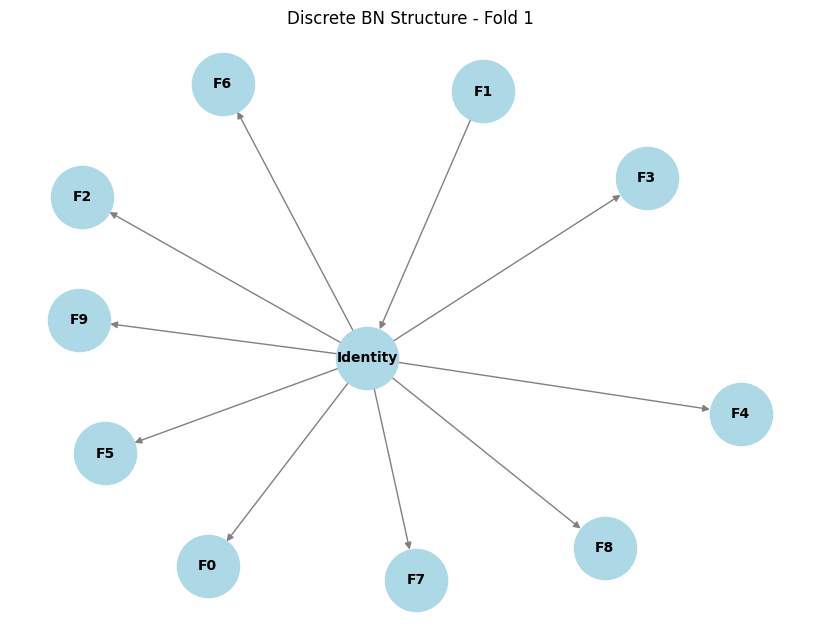

/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


Acc: 0.9710669077757685 
Prec: 0.9703170208863829 
Rec: 0.9715324120819739 
F1: 0.9703822489548835

=== Discrete BN: Fold 2 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: [('F3', 'Identity'), ('Identity', 'F1'), ('Identity', 'F0'), ('Identity', 'F2'), ('Identity', 'F4'), ('Identity', 'F6'), ('Identity', 'F5'), ('Identity', 'F9'), ('Identity', 'F7'), ('Identity', 'F8')]


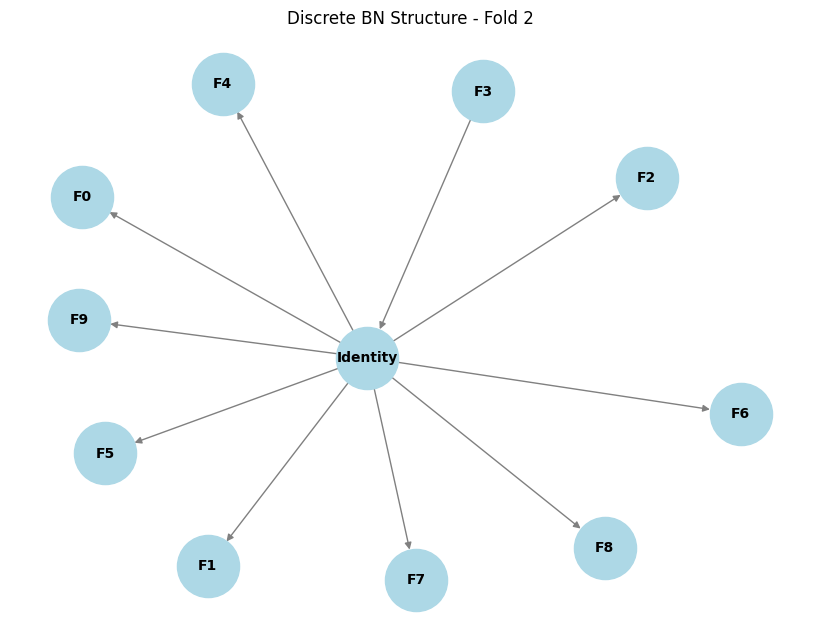

/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


Acc: 0.953887884267631 
Prec: 0.956588817168152 
Rec: 0.950819863812228 
F1: 0.952885332843574

=== Discrete BN: Fold 3 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: [('F1', 'Identity'), ('Identity', 'F0'), ('Identity', 'F2'), ('Identity', 'F3'), ('Identity', 'F6'), ('Identity', 'F5'), ('Identity', 'F4'), ('Identity', 'F7'), ('Identity', 'F9'), ('Identity', 'F8')]


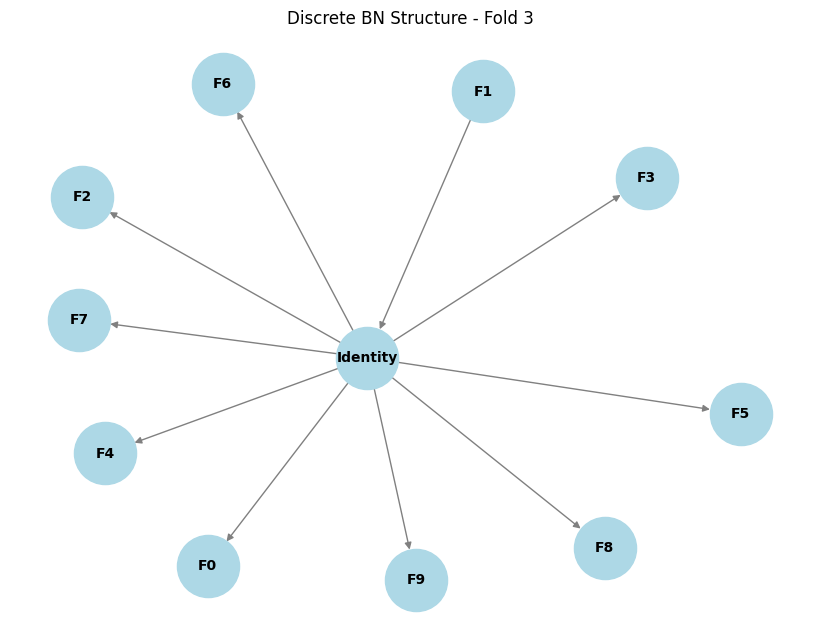

/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


Acc: 0.9665158371040724 
Prec: 0.9667865257829747 
Rec: 0.9651328102969545 
F1: 0.9657013257805103

=== Discrete BN: Fold 4 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: [('F1', 'Identity'), ('Identity', 'F0'), ('Identity', 'F2'), ('Identity', 'F3'), ('Identity', 'F6'), ('Identity', 'F5'), ('Identity', 'F4'), ('Identity', 'F9'), ('Identity', 'F7'), ('Identity', 'F8')]


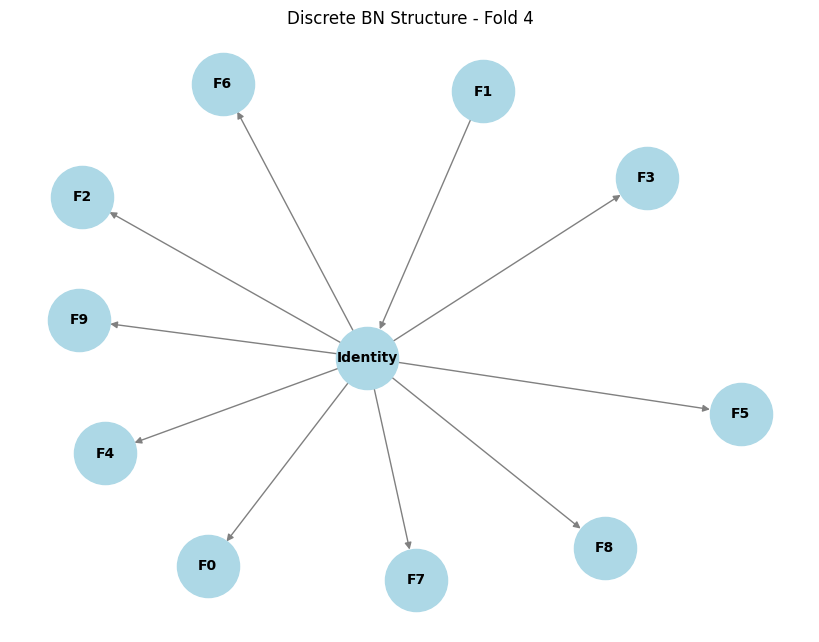

/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


Acc: 0.9665158371040724 
Prec: 0.9652480053144965 
Rec: 0.9647519654903304 
F1: 0.964790991558037

=== Discrete BN: Fold 5 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: [('F1', 'Identity'), ('Identity', 'F0'), ('Identity', 'F2'), ('Identity', 'F3'), ('Identity', 'F6'), ('Identity', 'F4'), ('Identity', 'F5'), ('Identity', 'F9'), ('Identity', 'F7'), ('Identity', 'F8')]


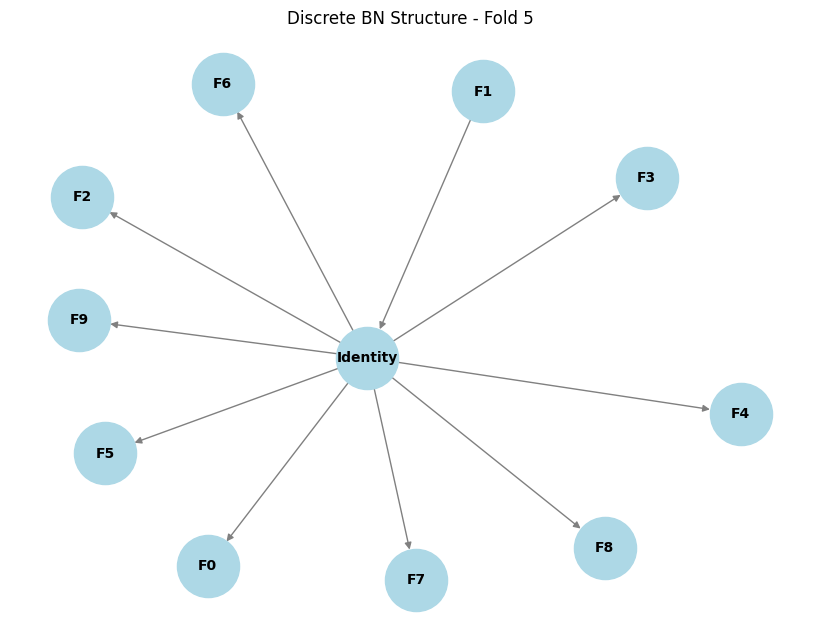

/usr/local/lib/python3.12/dist-packages/pgmpy/factors/discrete/DiscreteFactor.py:489: RuntimeWarning: invalid value encountered in divide
  phi.values = phi.values / (phi.values.sum())


Acc: 0.9610859728506788 
Prec: 0.9583685450632583 
Rec: 0.9598567032660139 
F1: 0.9581036057746217


In [ ]:
metrics_bn, models_bn = cross_validate_discrete_bn(embeddings, labels, pca_dim=10, folds=5, show_struct_params=True, export_file="bn_folds.xlsx")

In [ ]:
summarize(metrics_bn)


BN 5-fold CV results:
Acc: 0.964 ± 0.006
Prec: 0.963 ± 0.005
Rec: 0.962 ± 0.007
F1: 0.962 ± 0.006


### pgmpy - Linear Gaussian Bayesian Network


=== LGBN: Fold 1 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: []


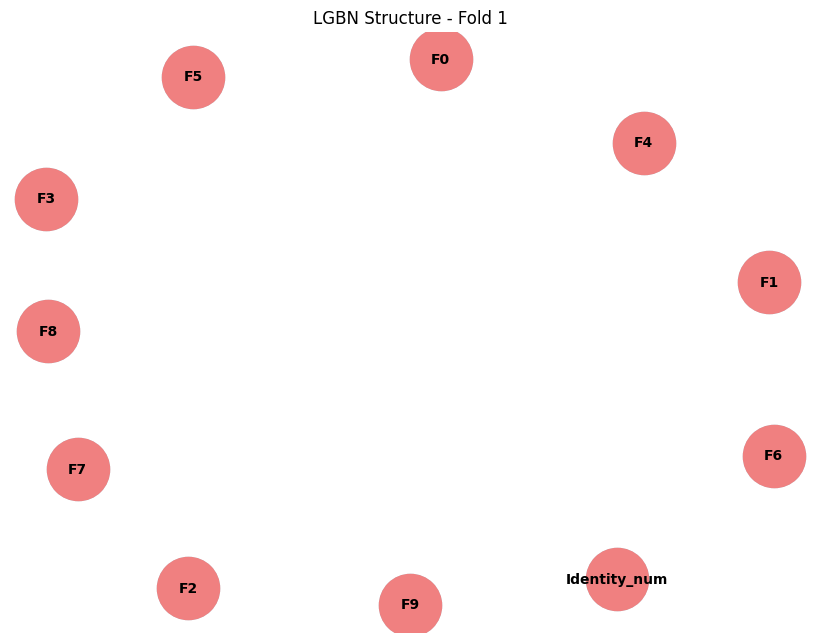

Acc: 0.08047016274864376 
Prec: 0.07392577511512458 
Rec: 0.07665102513812605 
F1: 0.04347595451128152

=== LGBN: Fold 2 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: []


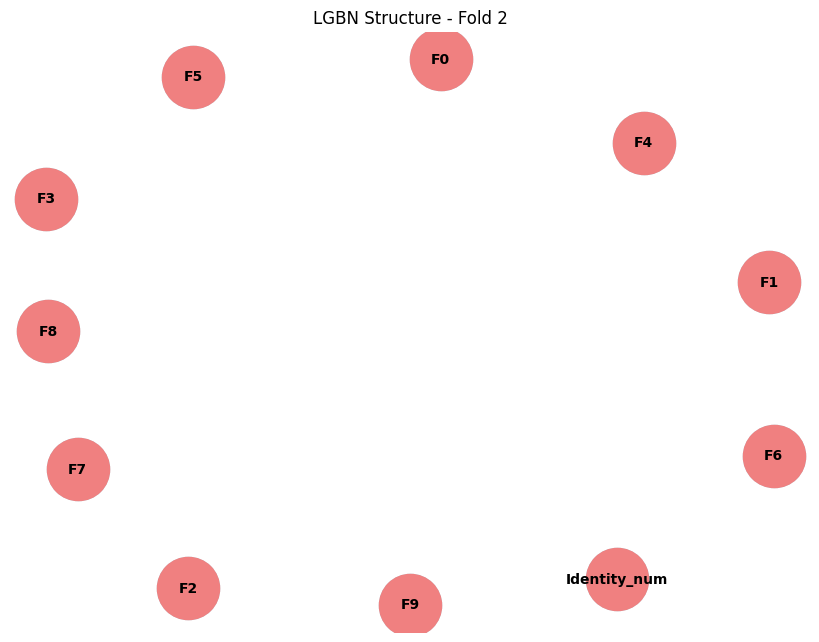

Acc: 0.07775768535262206 
Prec: 0.07122960198588565 
Rec: 0.0726225168331538 
F1: 0.04225838155106523

=== LGBN: Fold 3 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: []


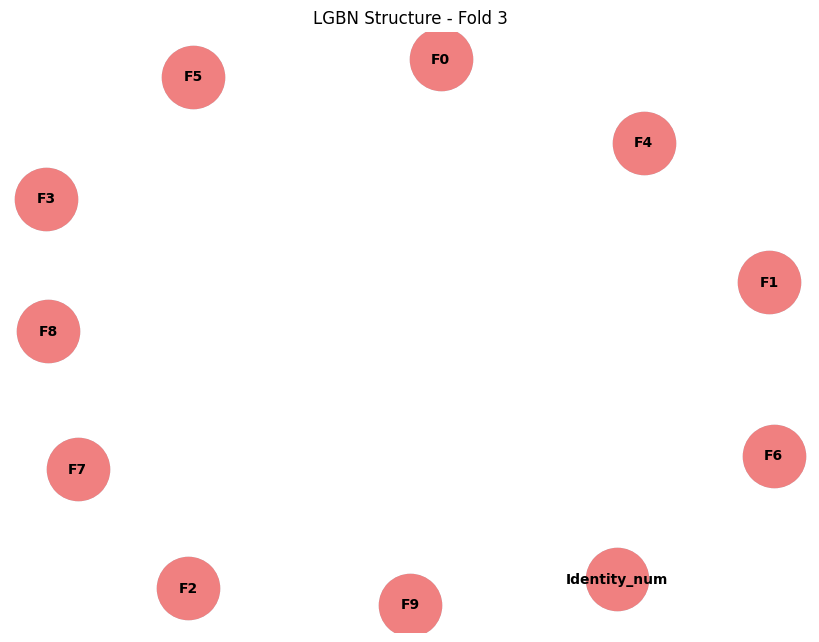

Acc: 0.07692307692307693 
Prec: 0.07728171769079724 
Rec: 0.07166970376600318 
F1: 0.04037942040956546

=== LGBN: Fold 4 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: []


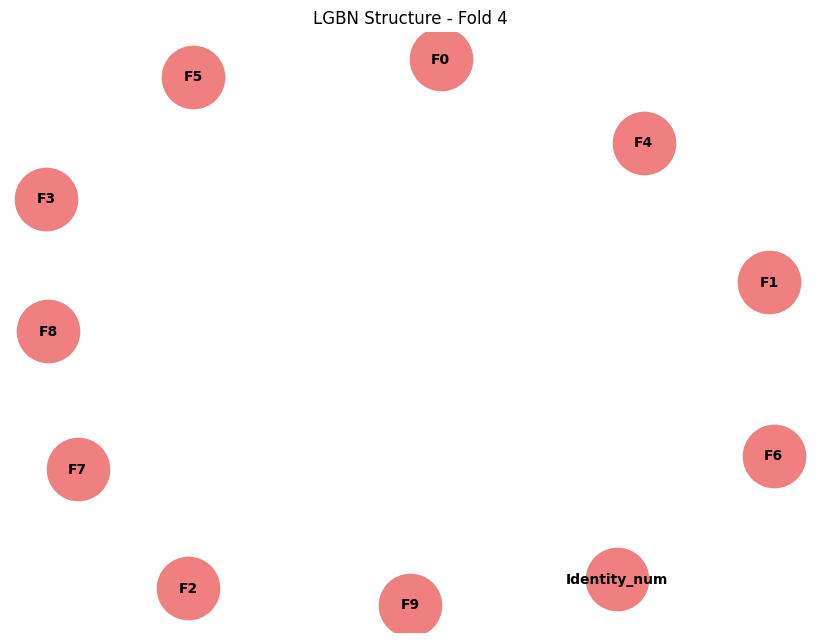

Acc: 0.0751131221719457 
Prec: 0.0819010989010989 
Rec: 0.06967235879667821 
F1: 0.04036333695137082

=== LGBN: Fold 5 ===


  0%|          | 0/1000000 [00:00<?, ?it/s]

Learned structure: []


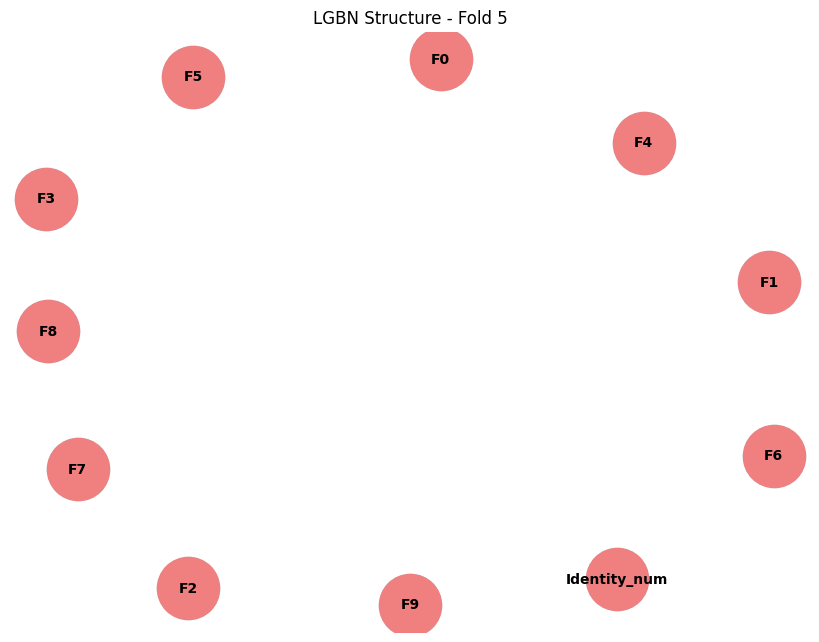

Acc: 0.08054298642533937 
Prec: 0.07803781280498513 
Rec: 0.07546616512609608 
F1: 0.044154732930658296


In [ ]:
metrics_lgbn, models_lgbn = cross_validate_lgbn(embeddings, labels, pca_dim=10, folds=5, show_struct_params=True)

In [ ]:
summarize(metrics_lgbn)


BN 5-fold CV results:
Acc: 0.078 ± 0.002
Prec: 0.076 ± 0.004
Rec: 0.073 ± 0.003
F1: 0.042 ± 0.002


### pomegranate - Hidden Markov Model


=== HMM: Fold 1 ===
Acc: 0.8037974683544303 
Prec: 0.8016557235772421 
Rec: 0.8039428360673708 
F1: 0.7984030845240822


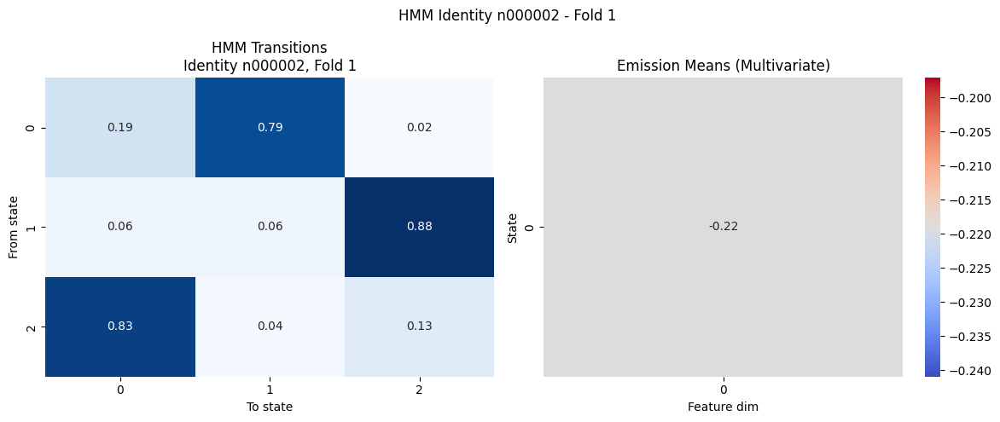

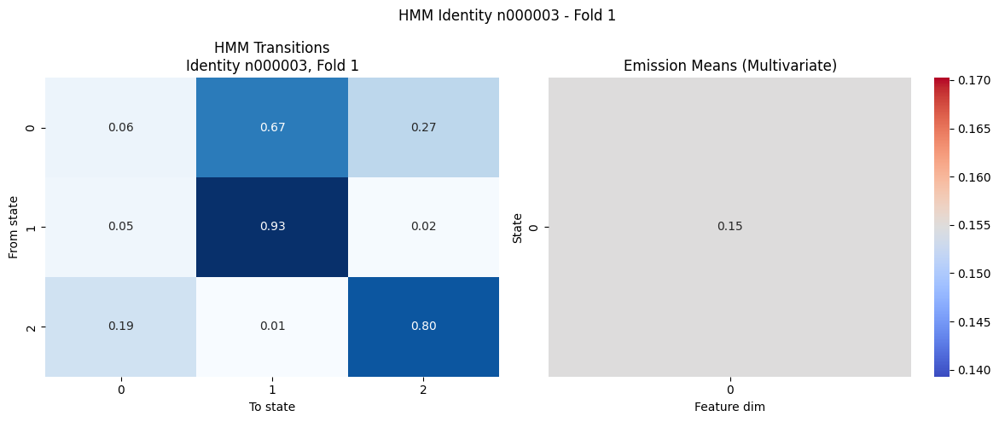

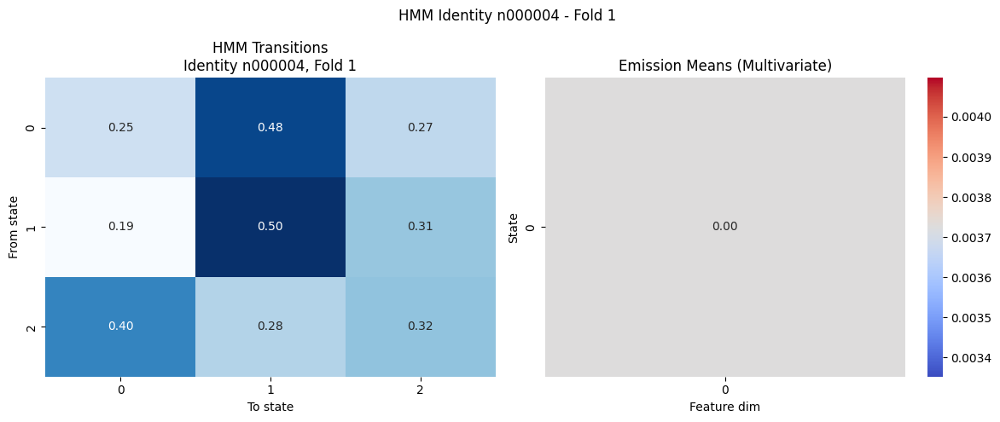

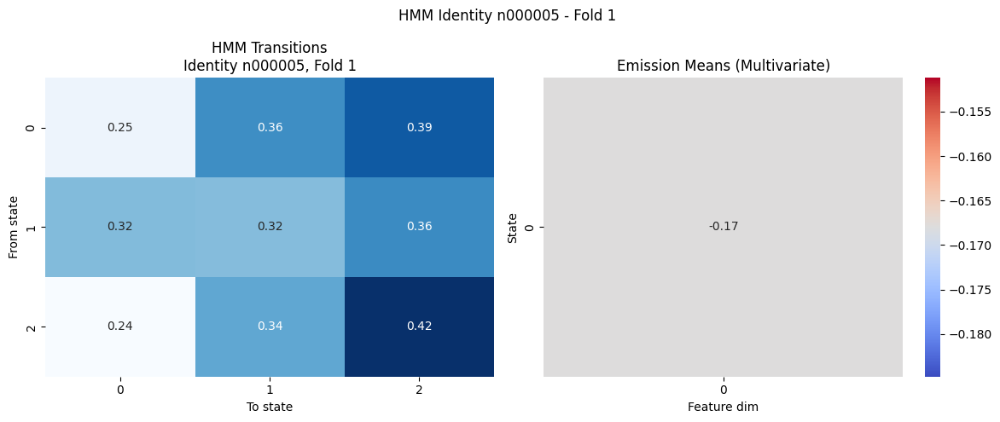

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


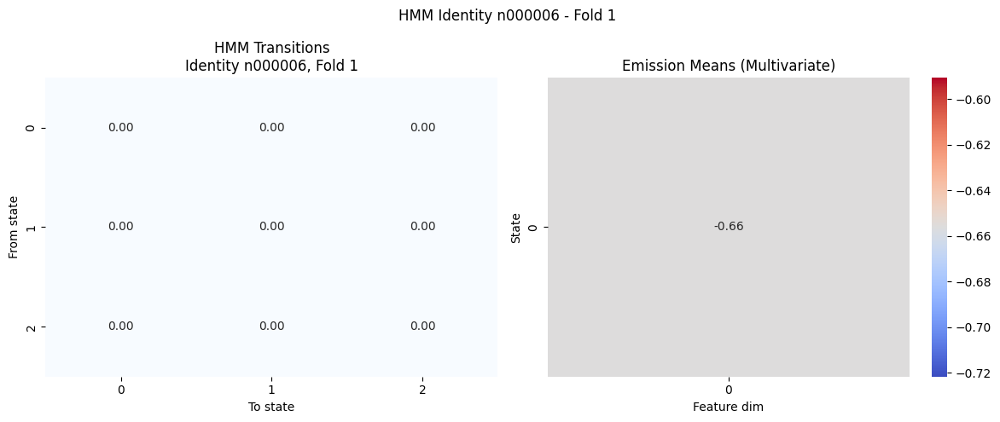

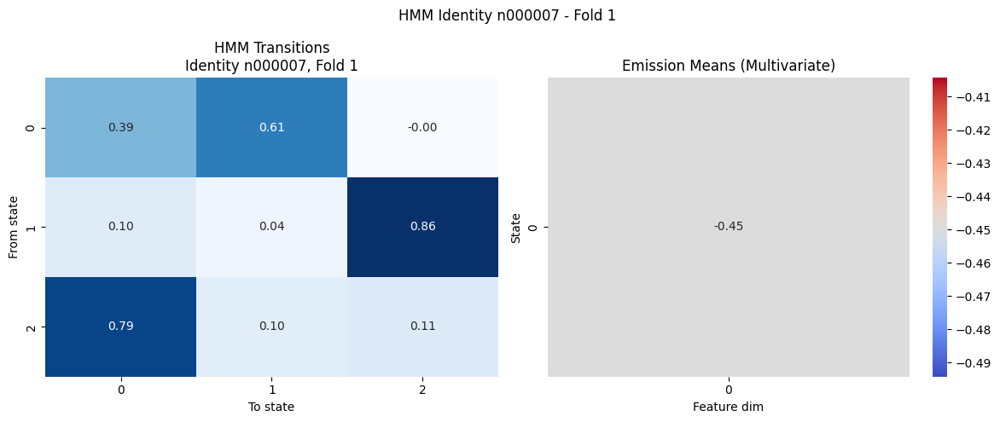

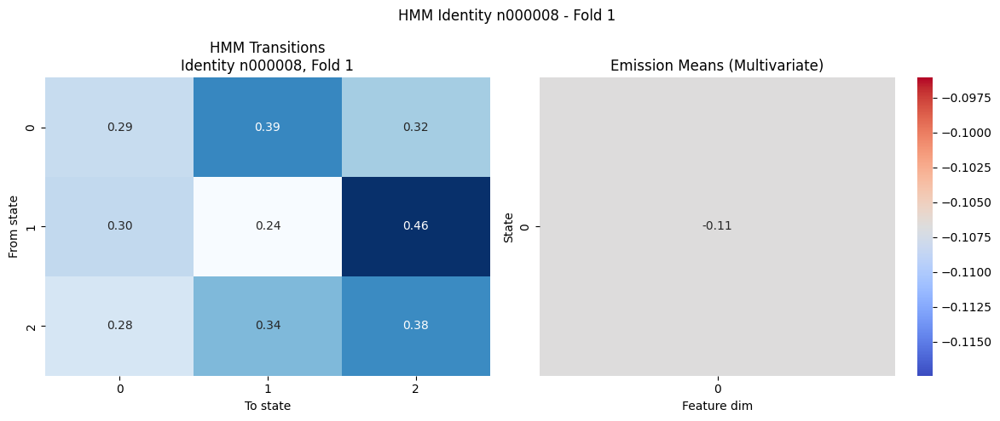

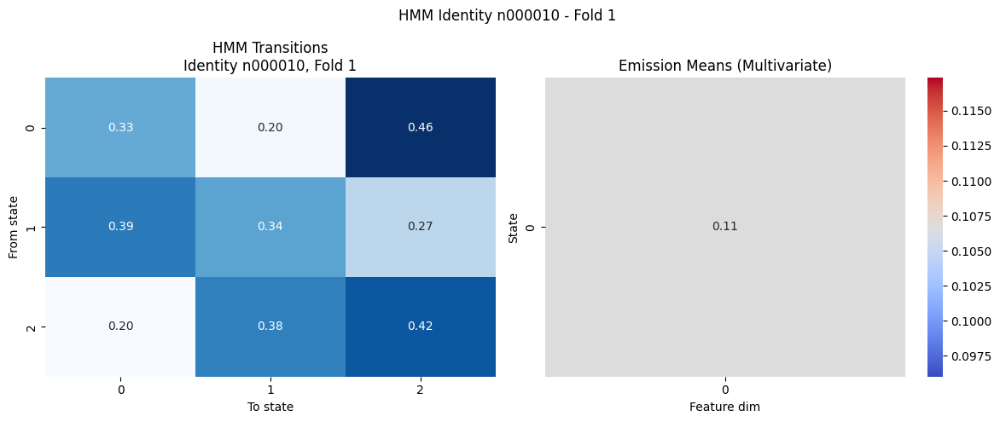

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


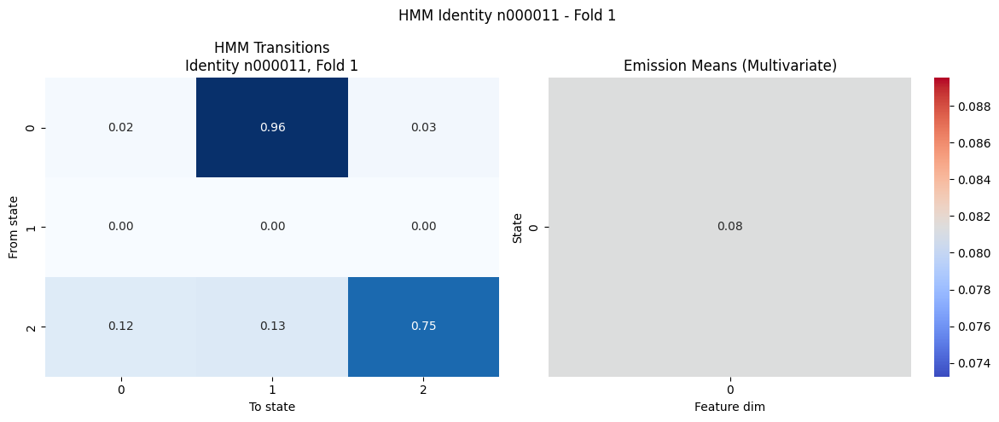

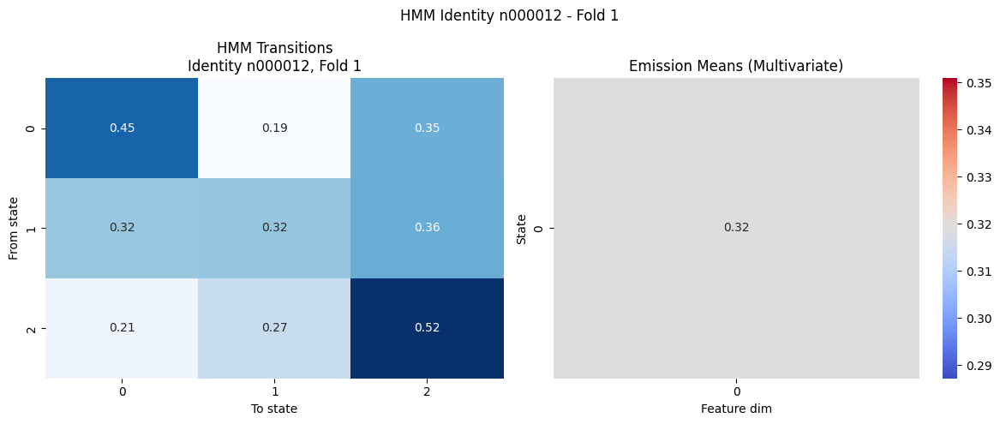

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


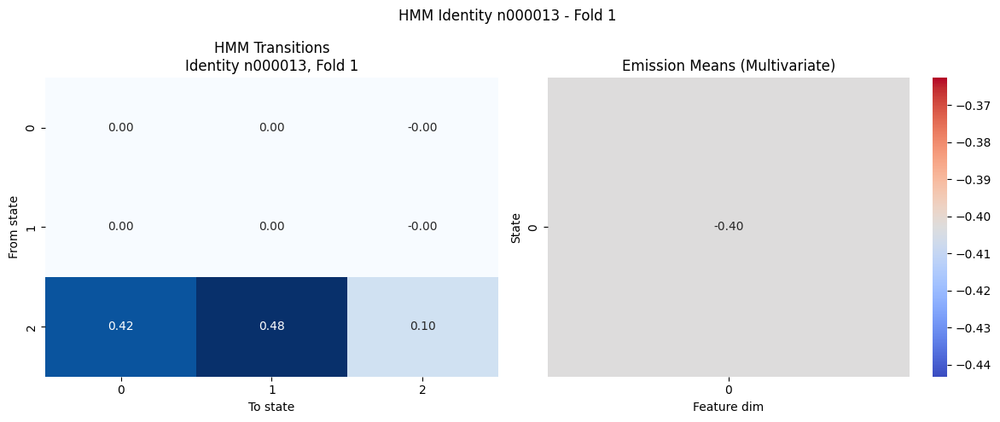

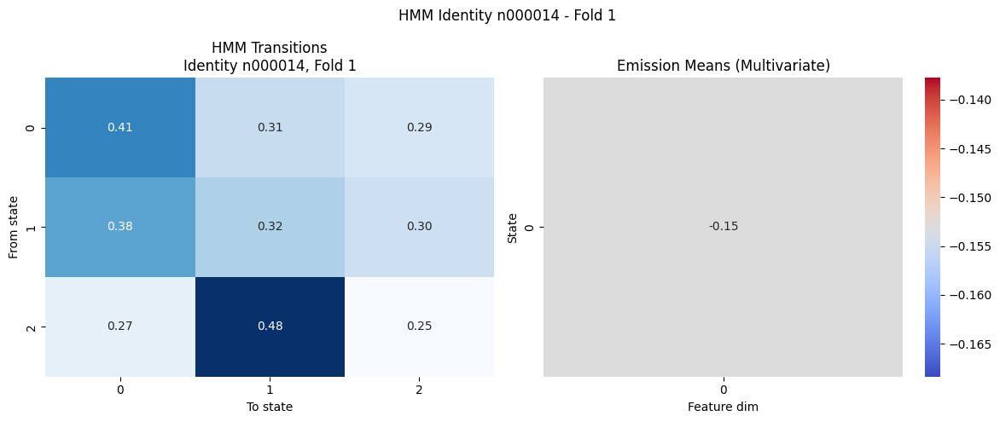

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


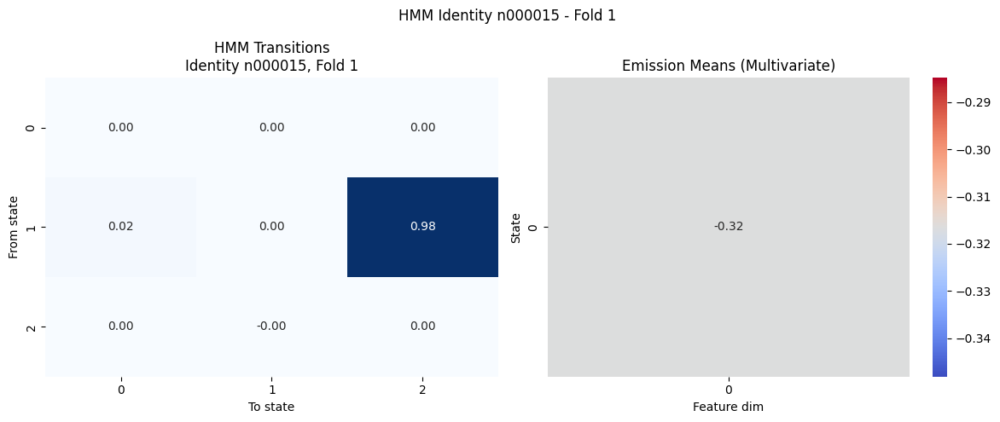

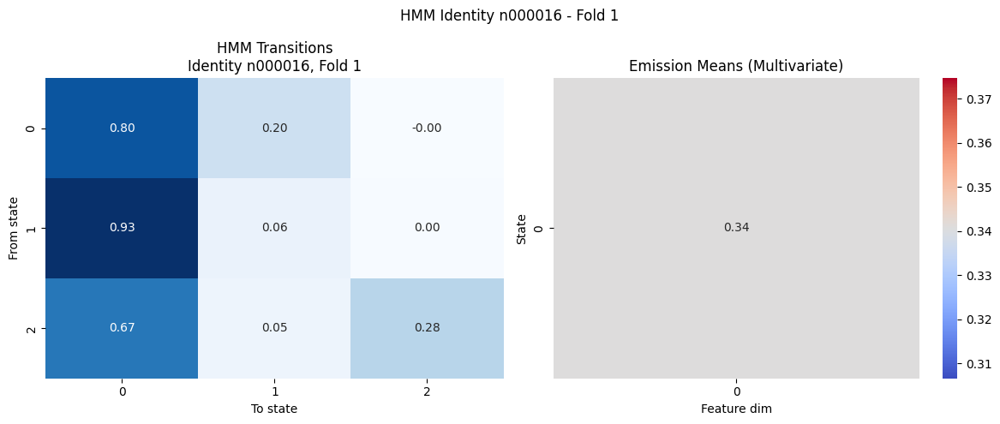

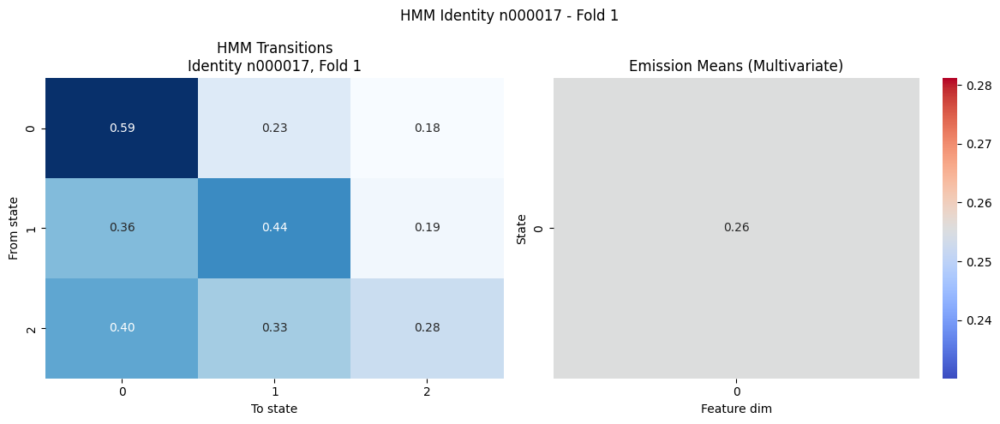

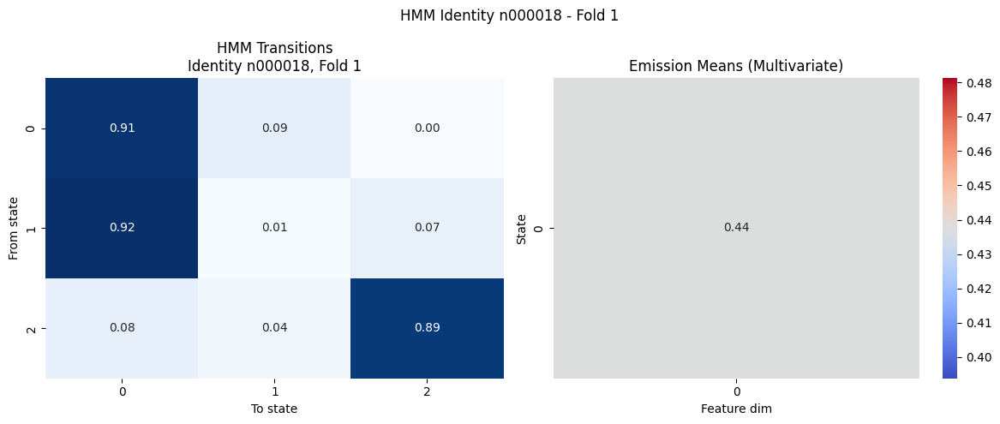

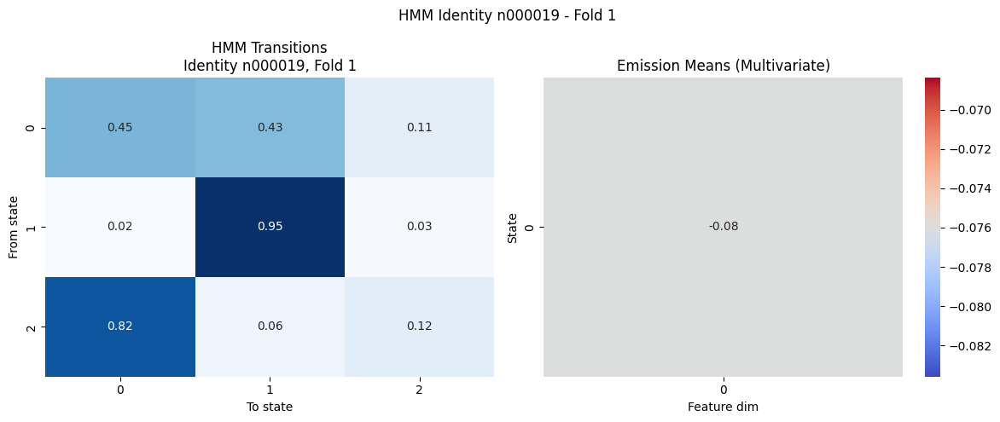

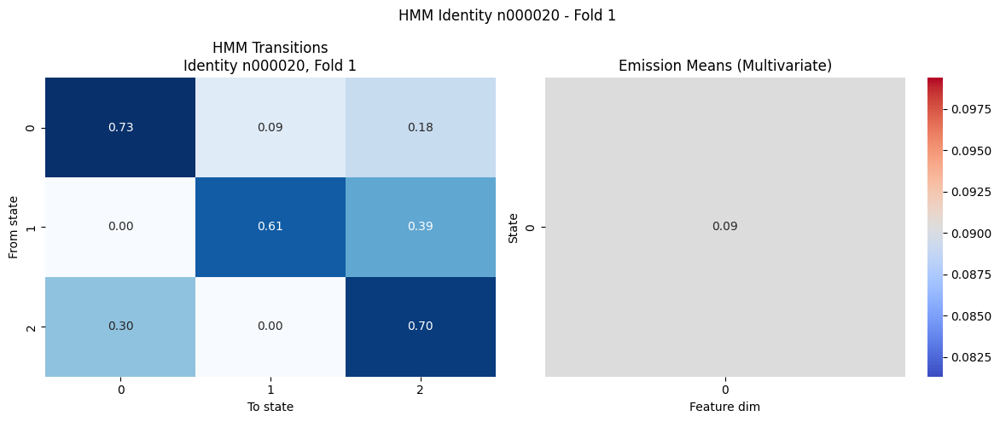

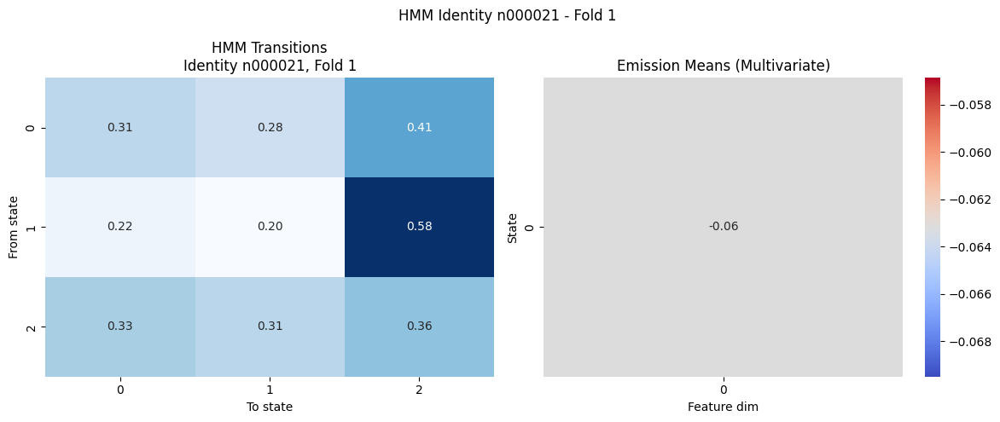

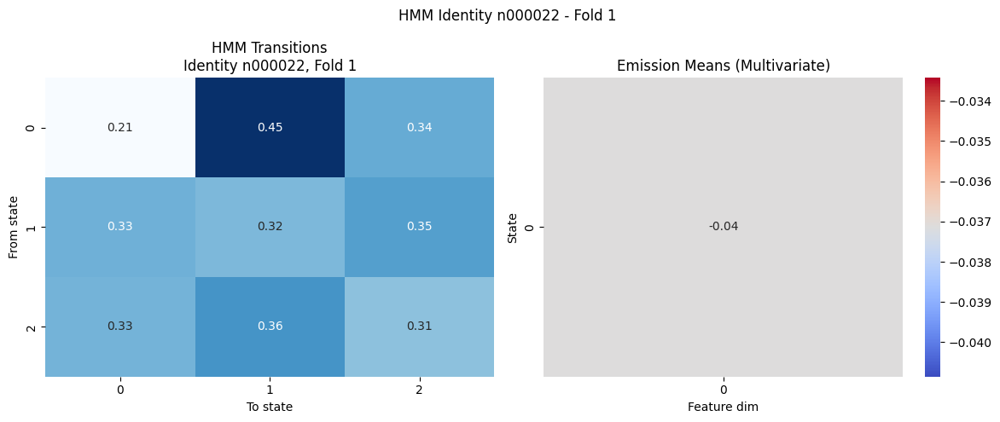


=== HMM: Fold 2 ===
Acc: 0.8716094032549728 
Prec: 0.8695943829631615 
Rec: 0.8694240144205795 
F1: 0.8675783555468429


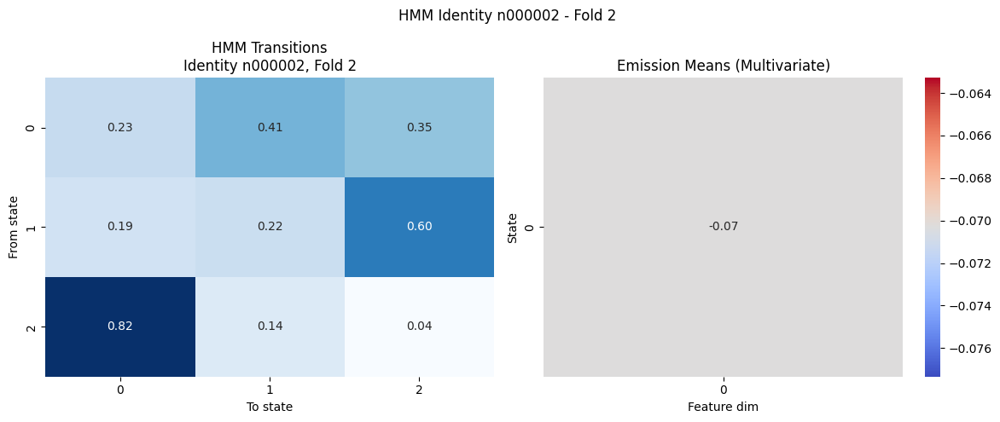

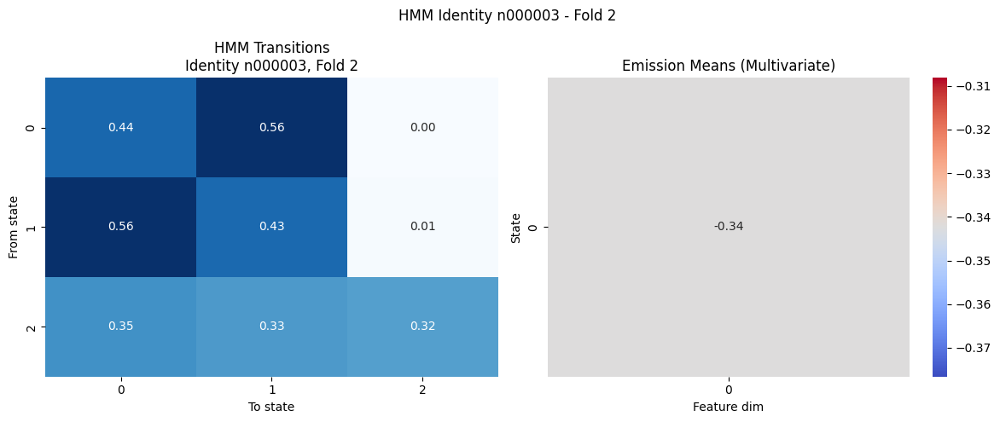

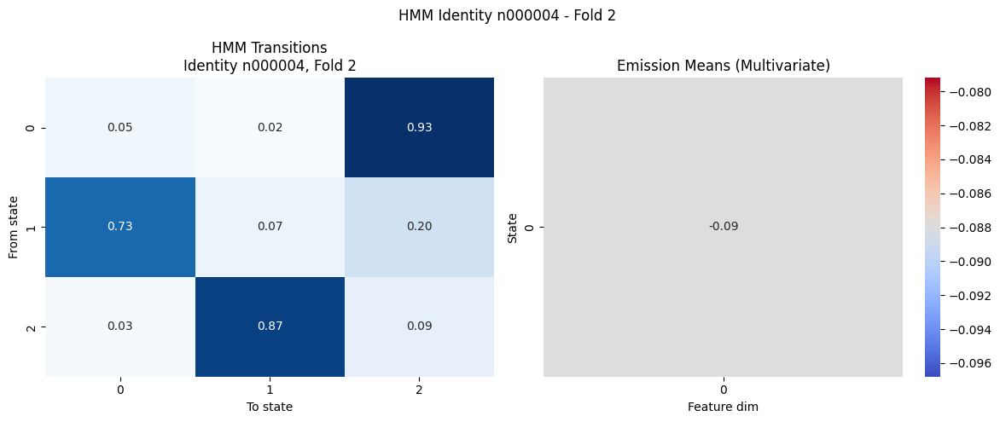

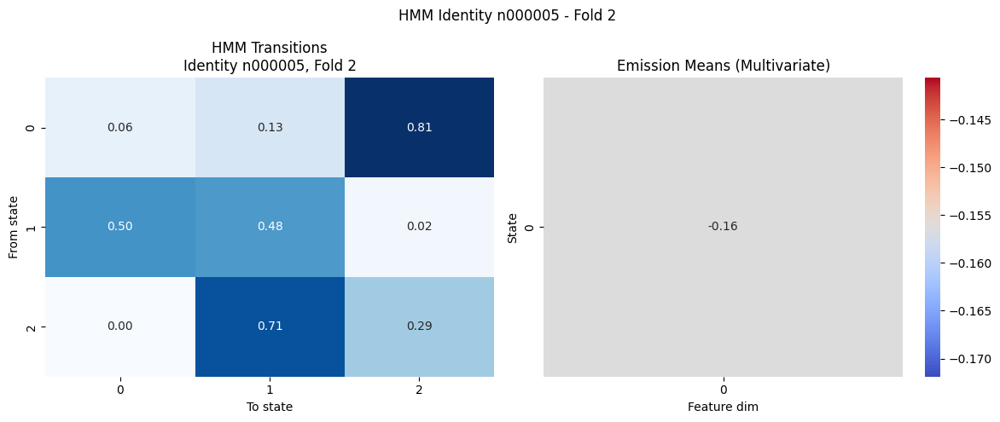

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


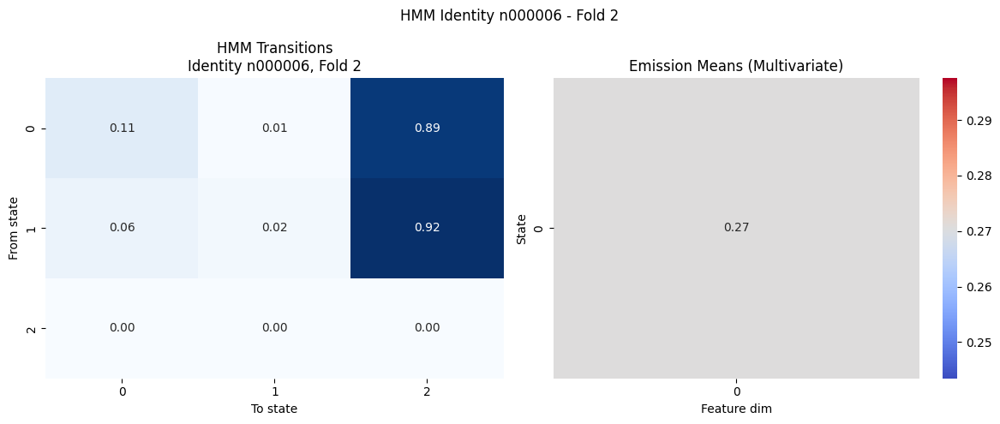

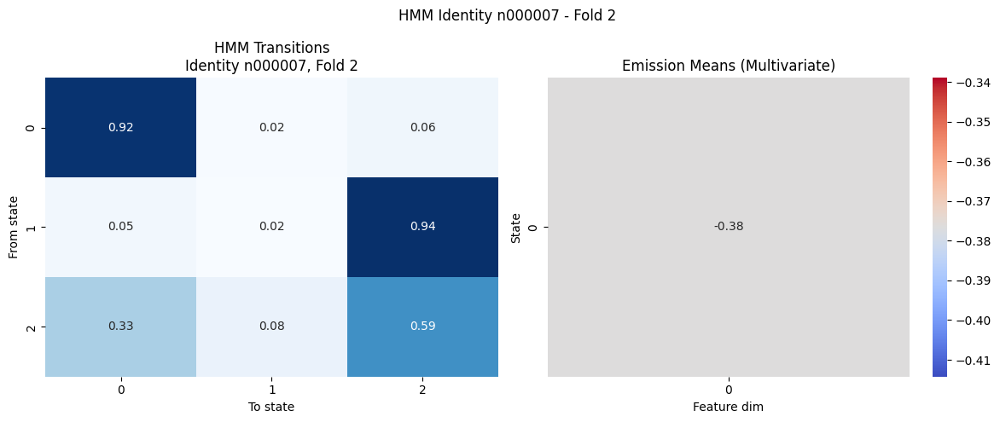

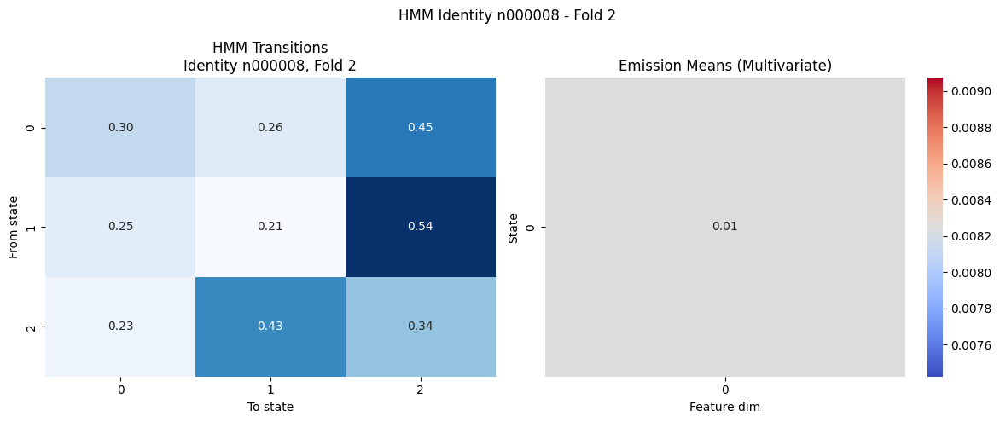

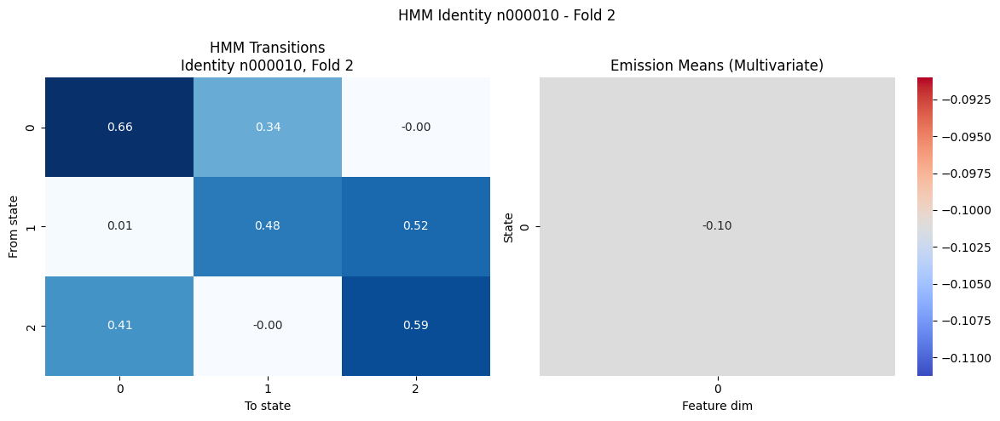

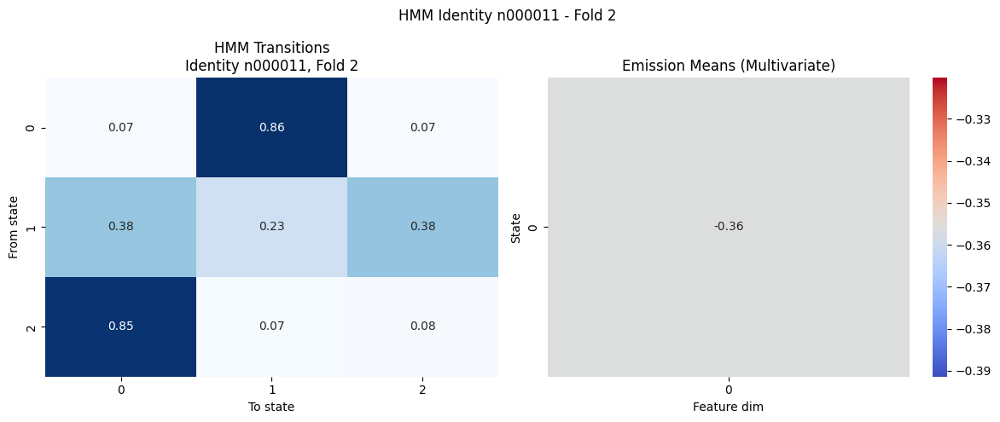

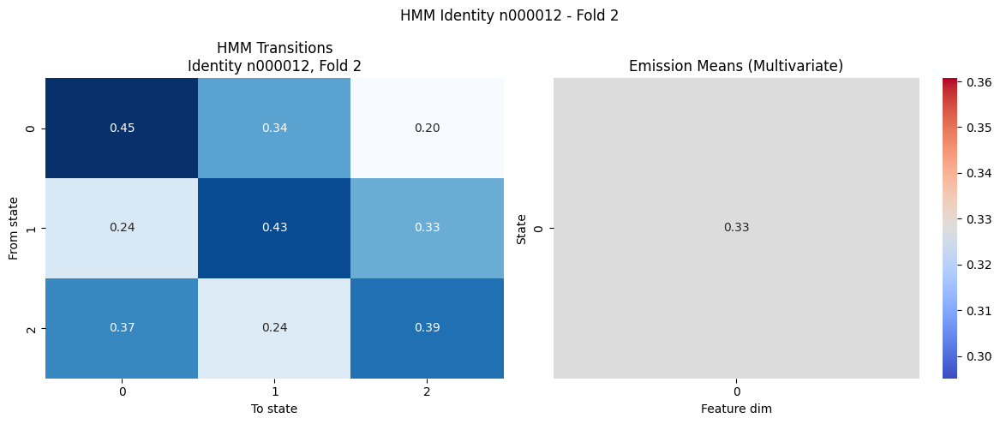

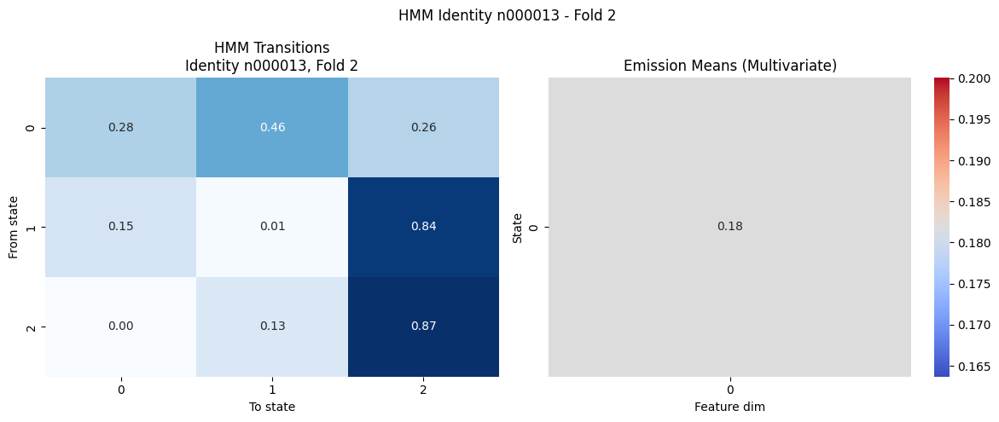

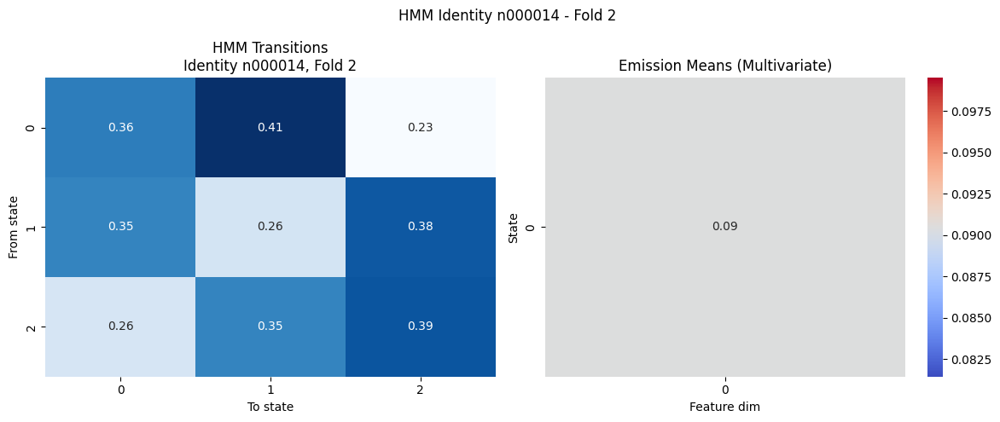

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


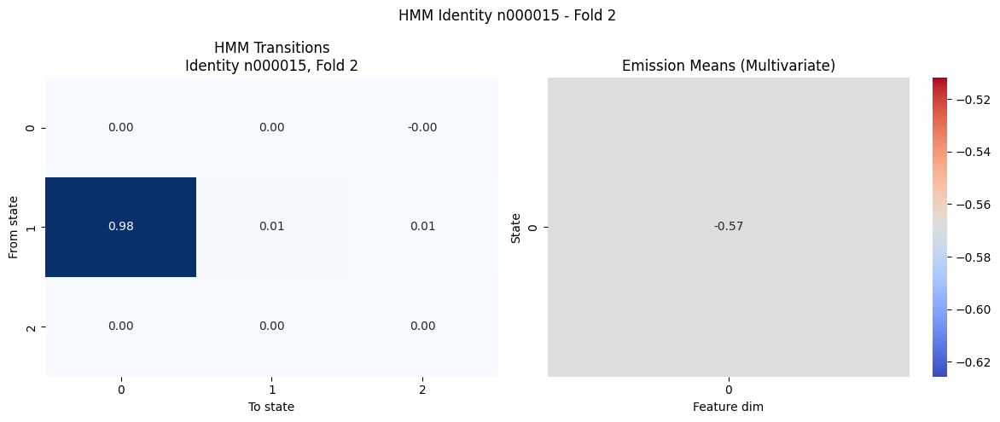

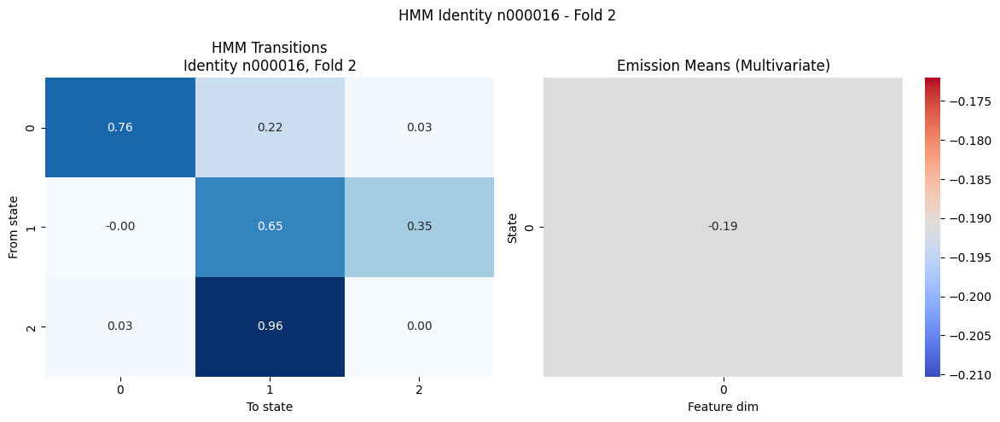

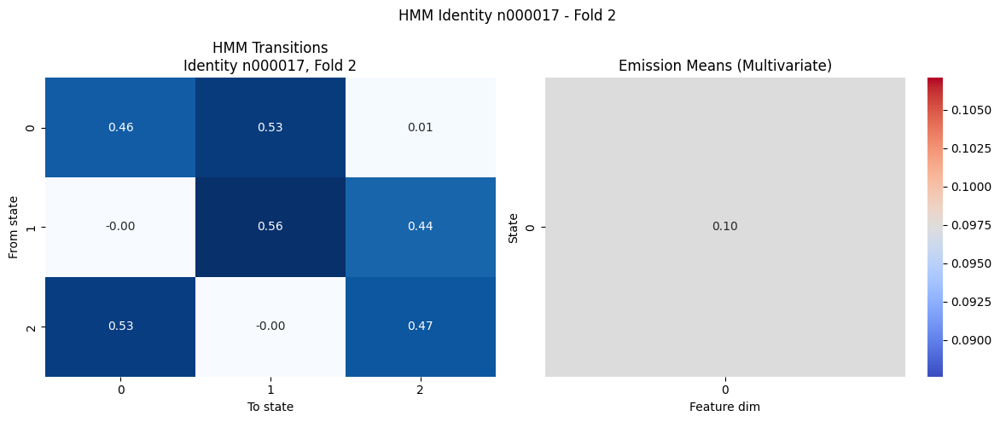

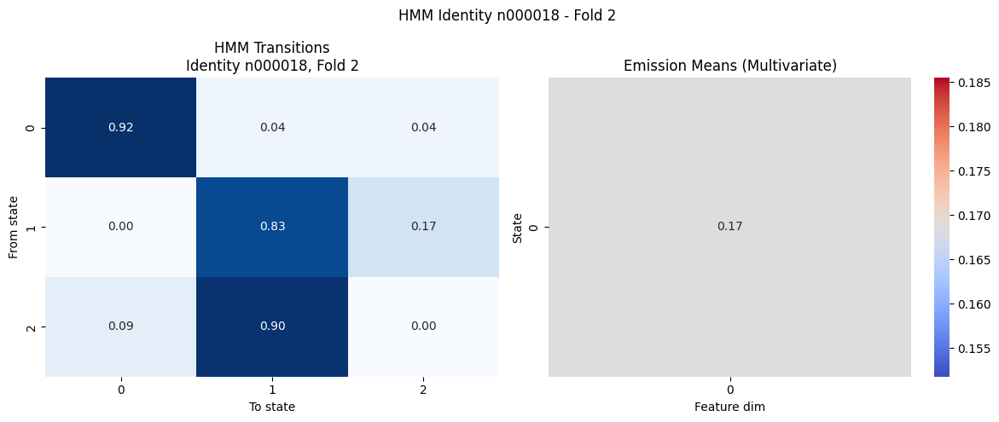

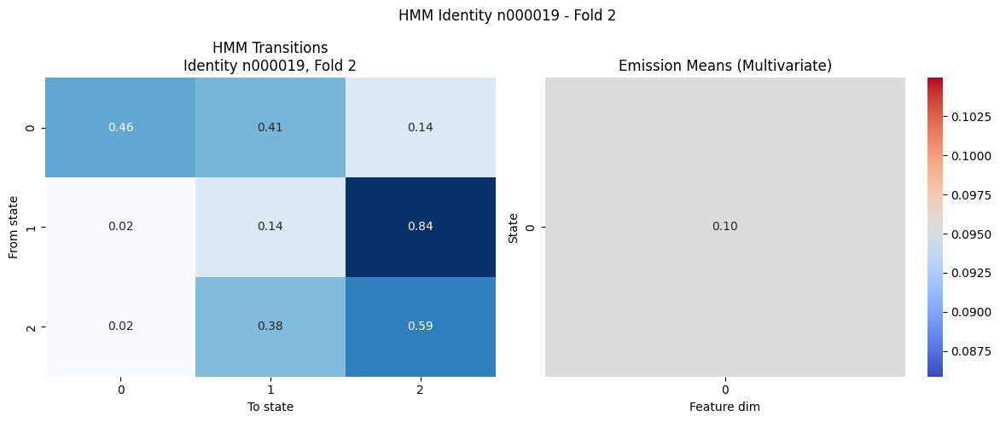

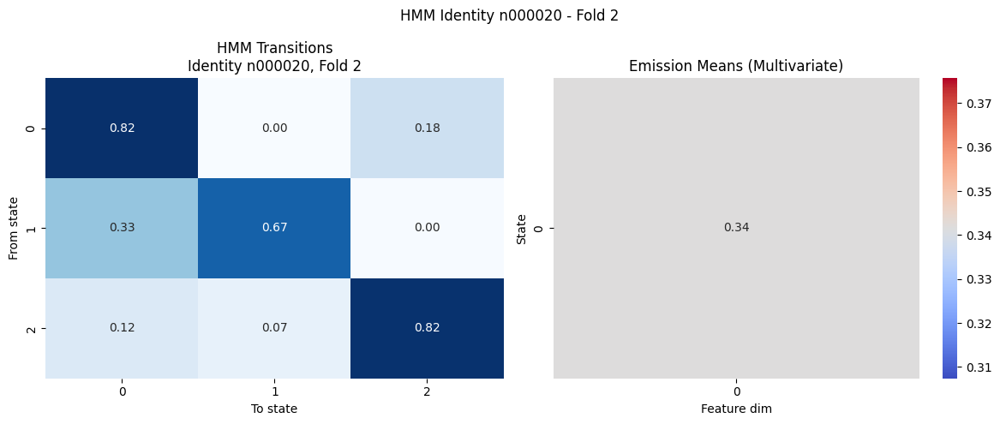

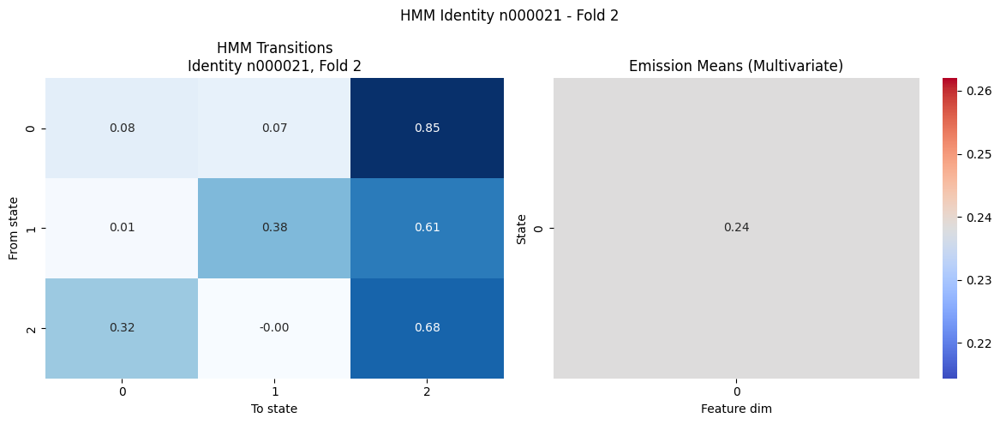

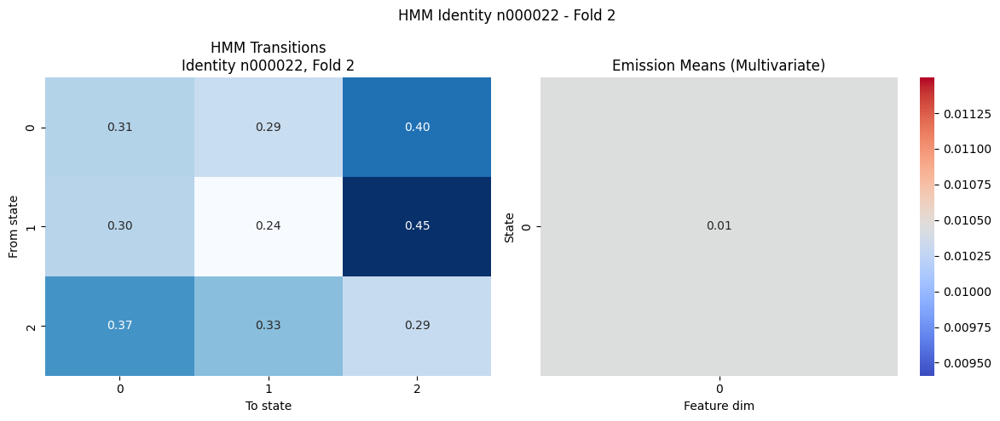


=== HMM: Fold 3 ===
Acc: 0.8389140271493213 
Prec: 0.8320348674783096 
Rec: 0.8335237893004483 
F1: 0.8280381422121568


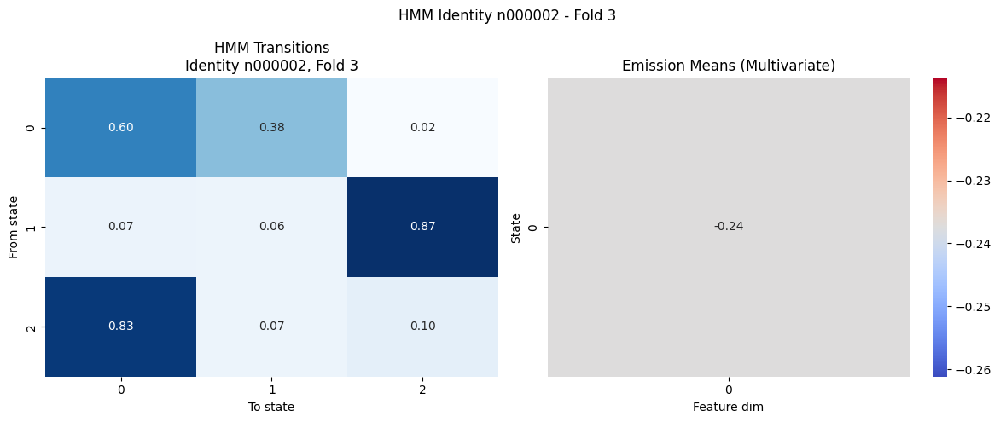

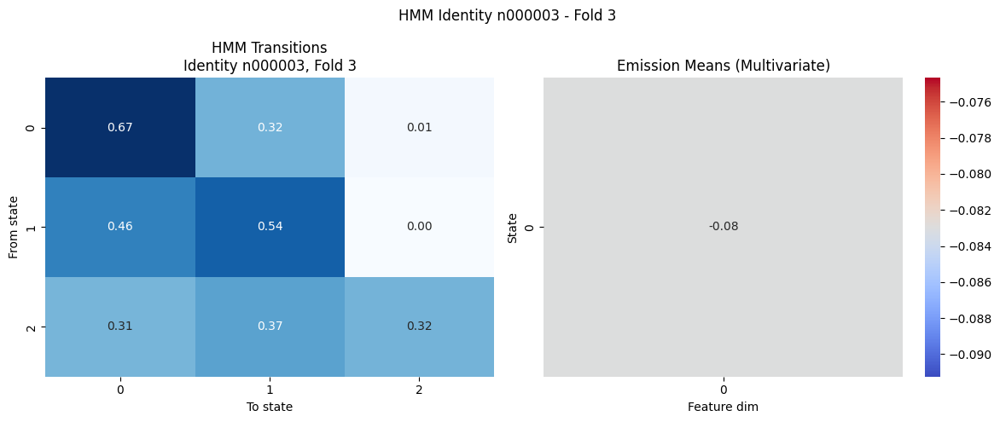

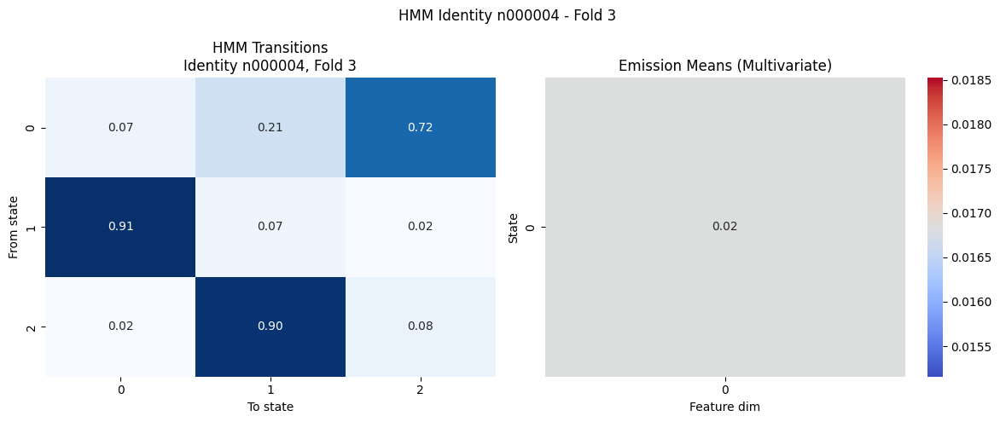

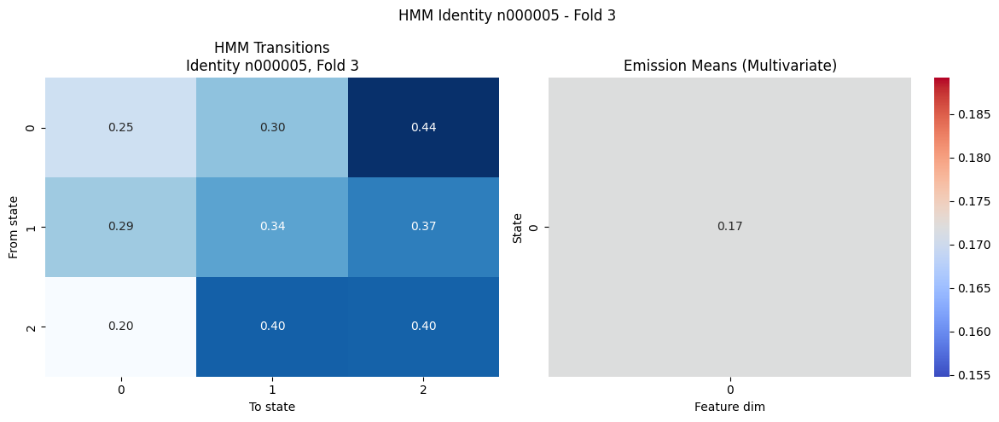

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


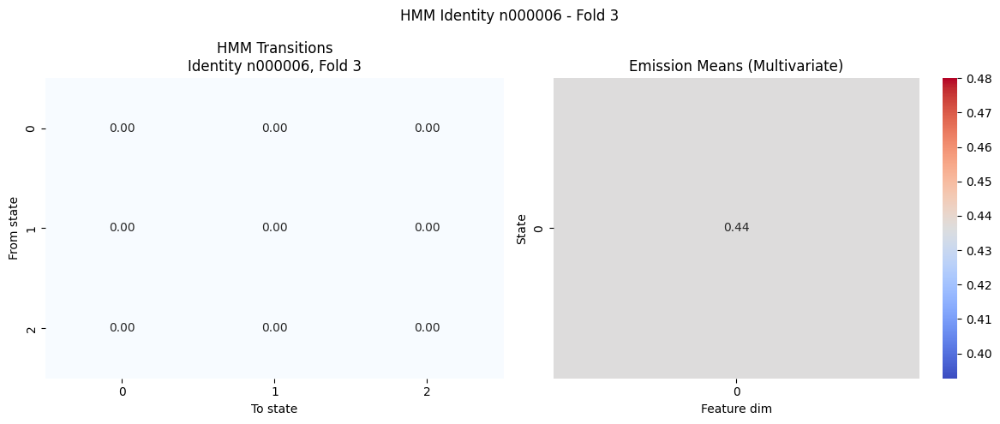

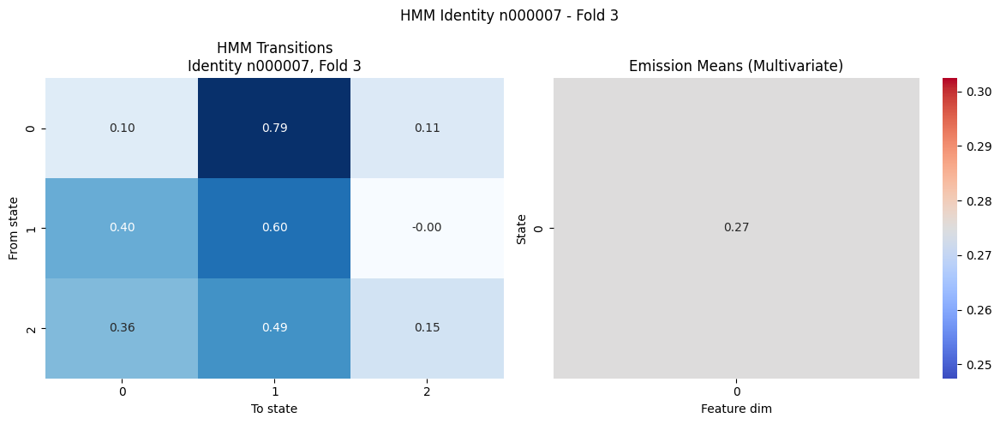

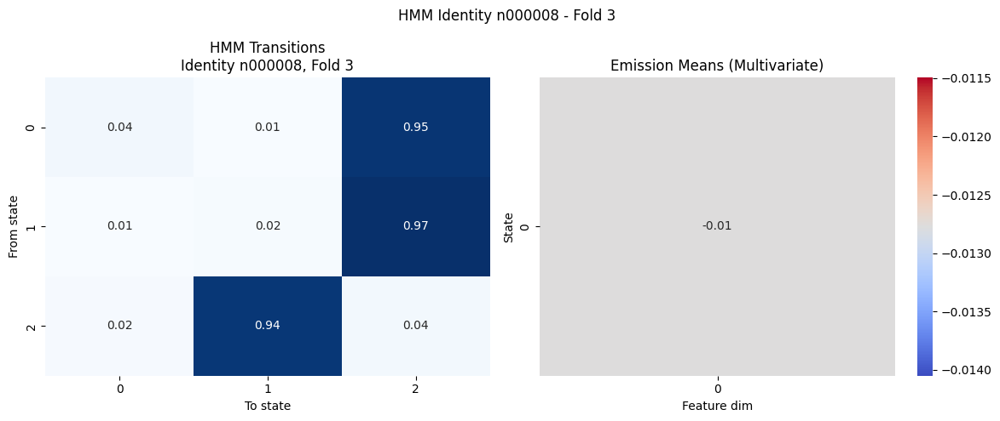

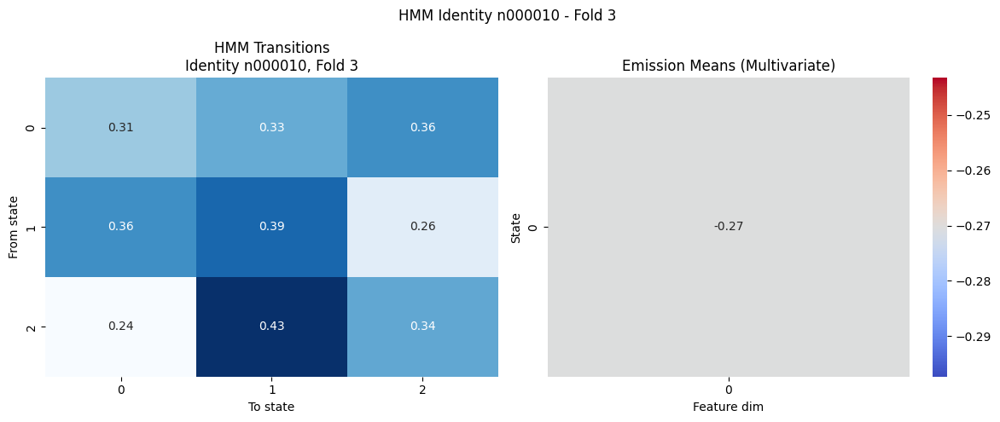

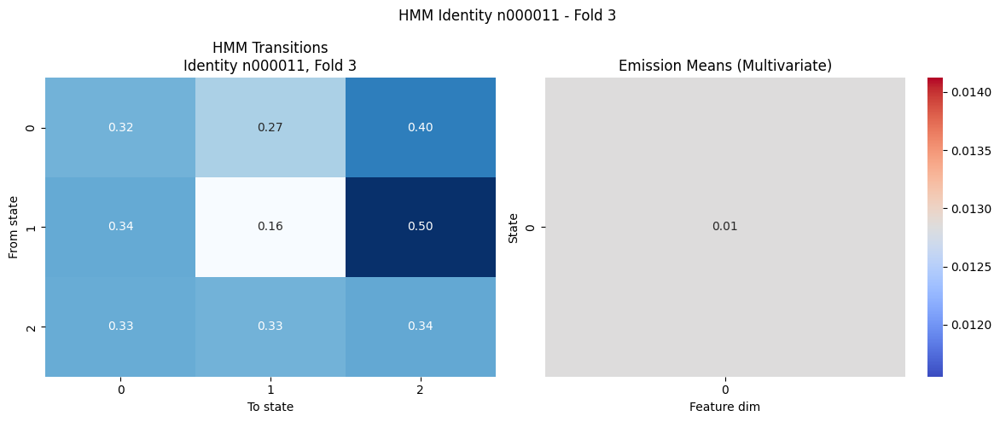

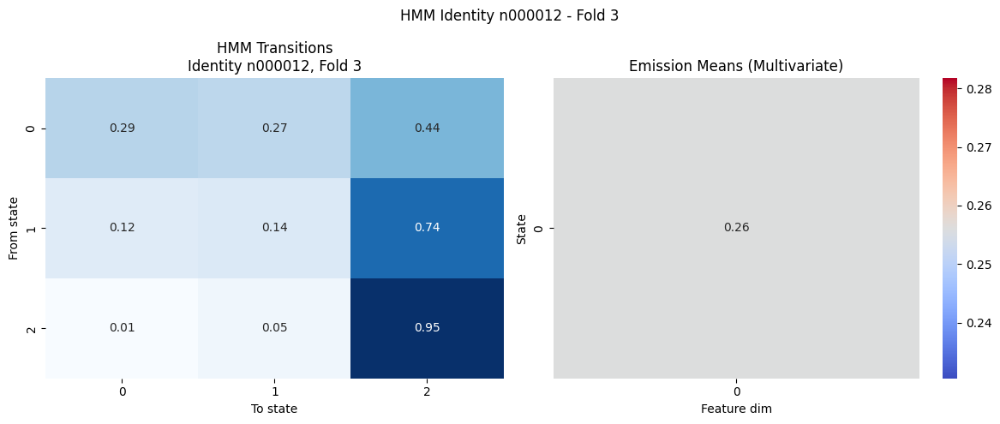

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


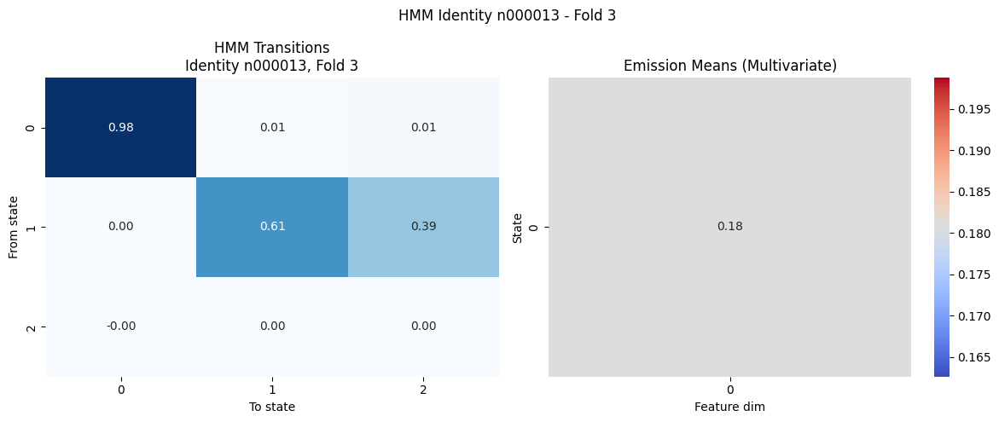

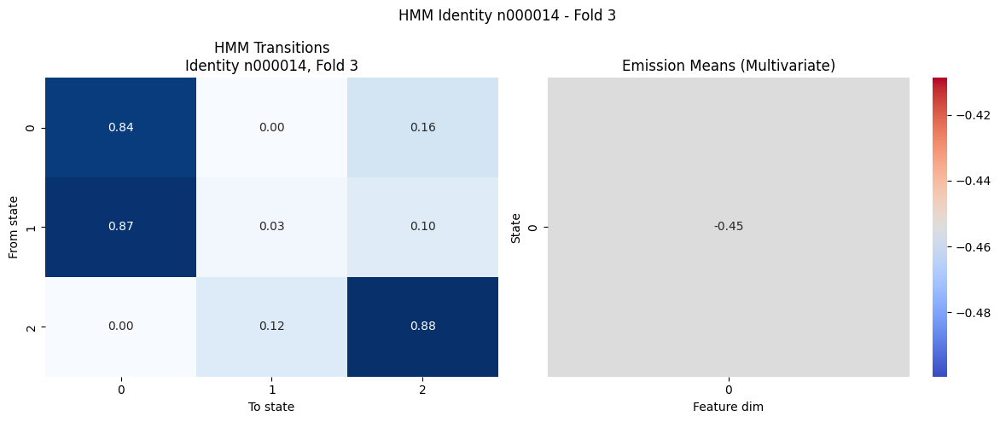

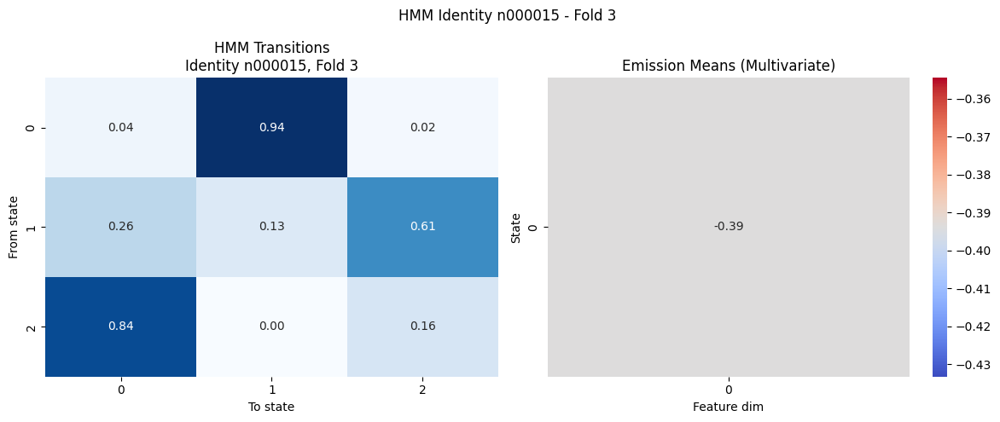

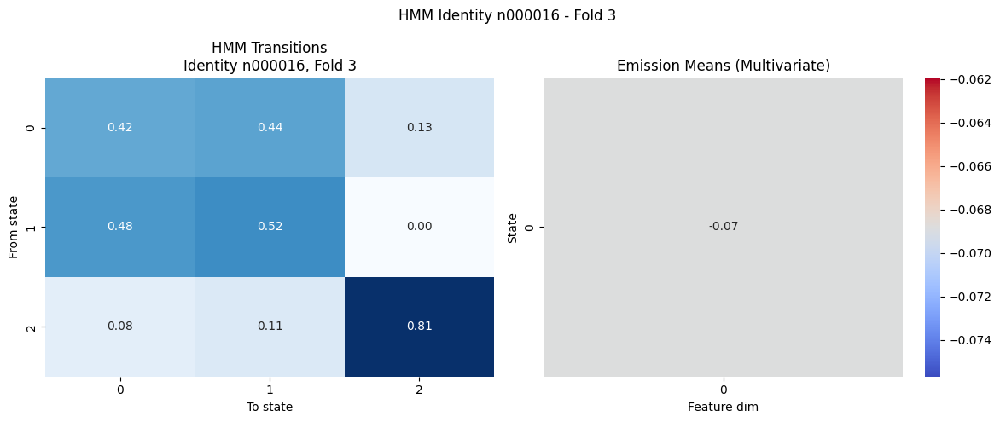

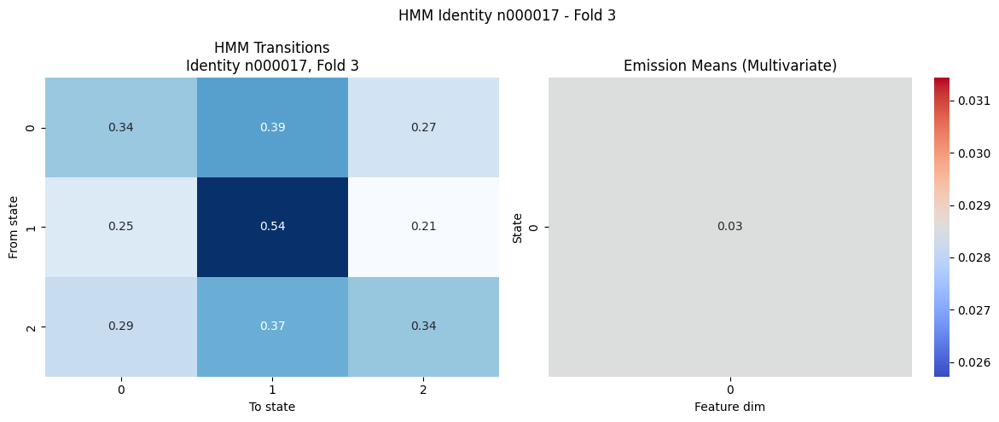

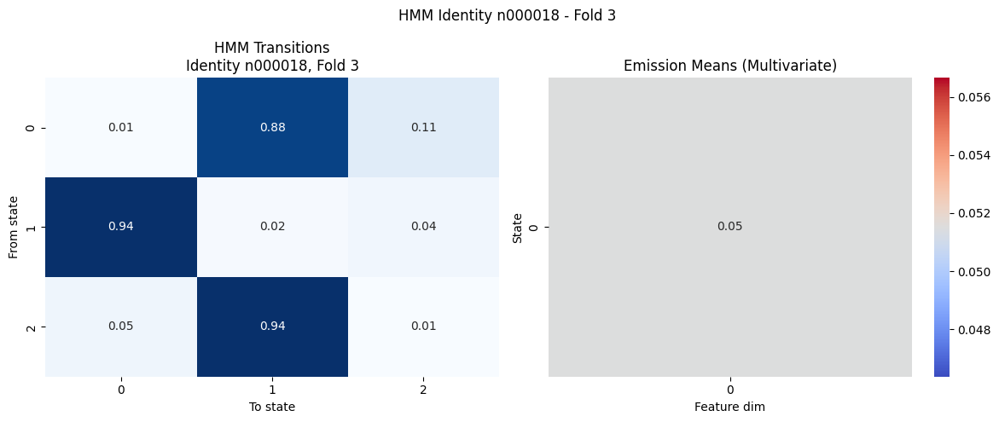

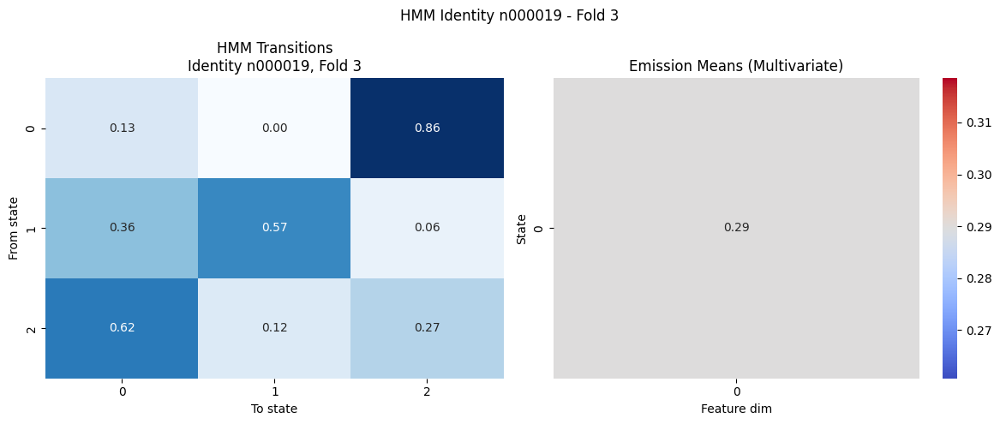

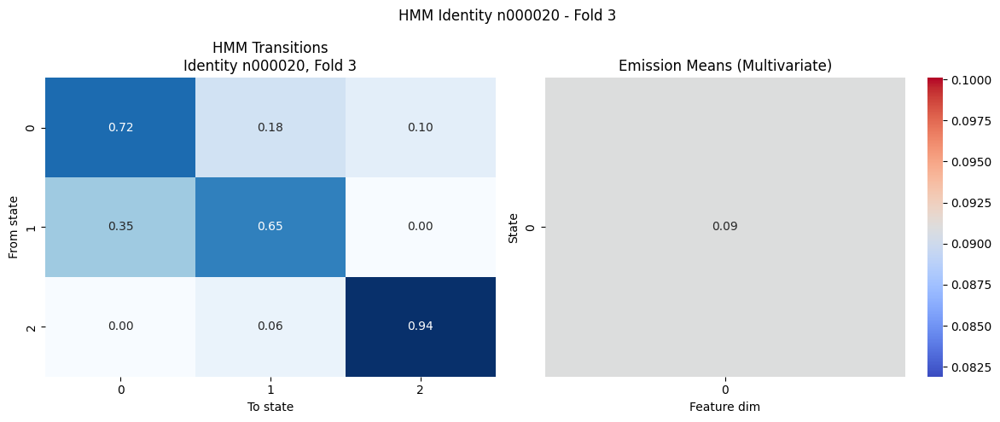

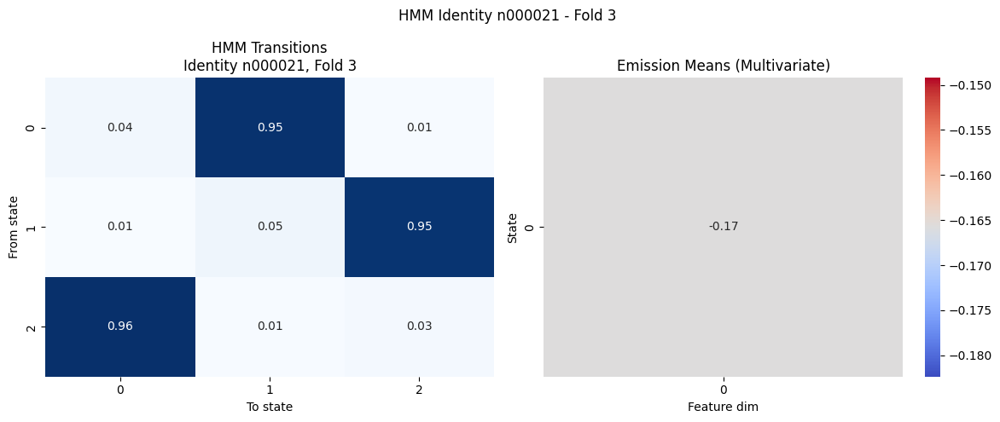

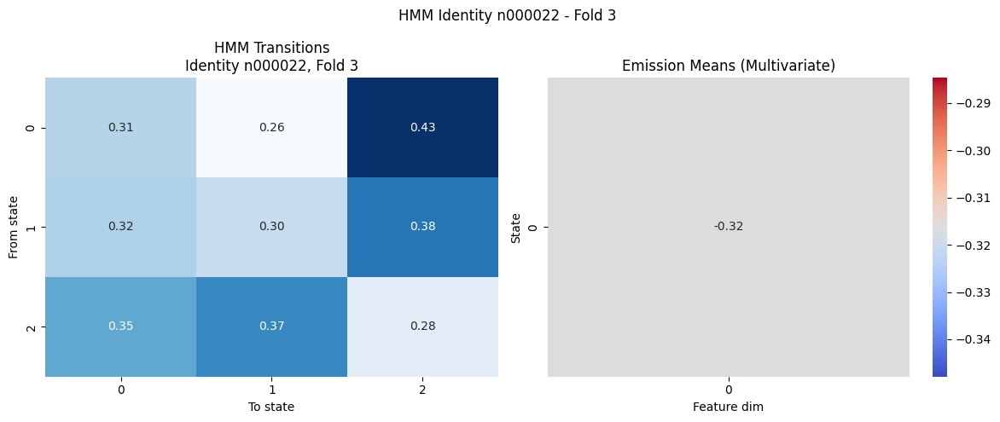


=== HMM: Fold 4 ===
Acc: 0.8407239819004525 
Prec: 0.8419637044994698 
Rec: 0.8403262677959177 
F1: 0.8381036356787981


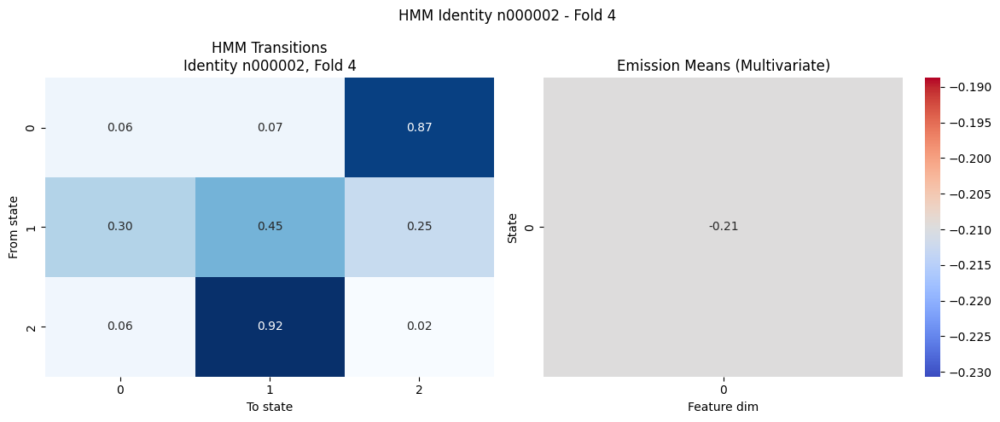

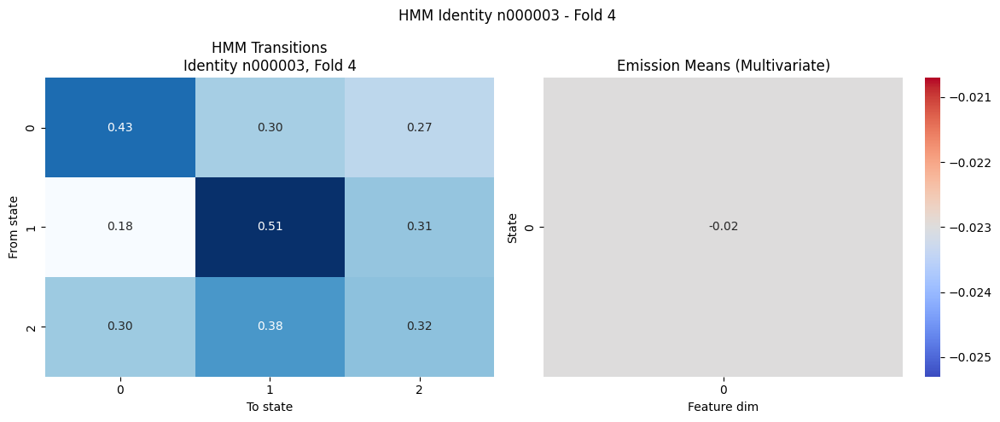

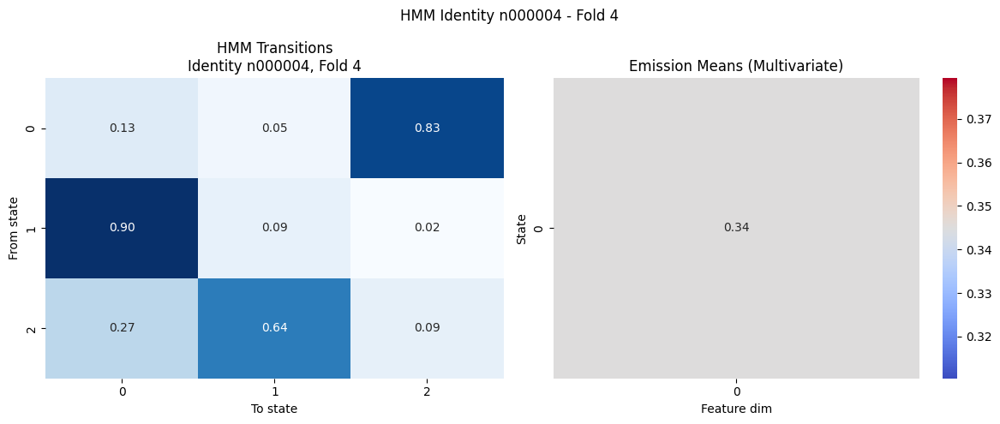

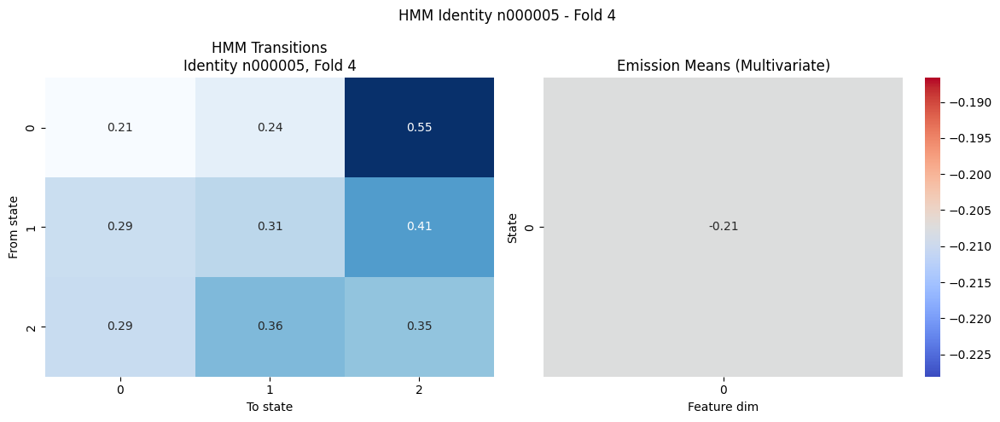

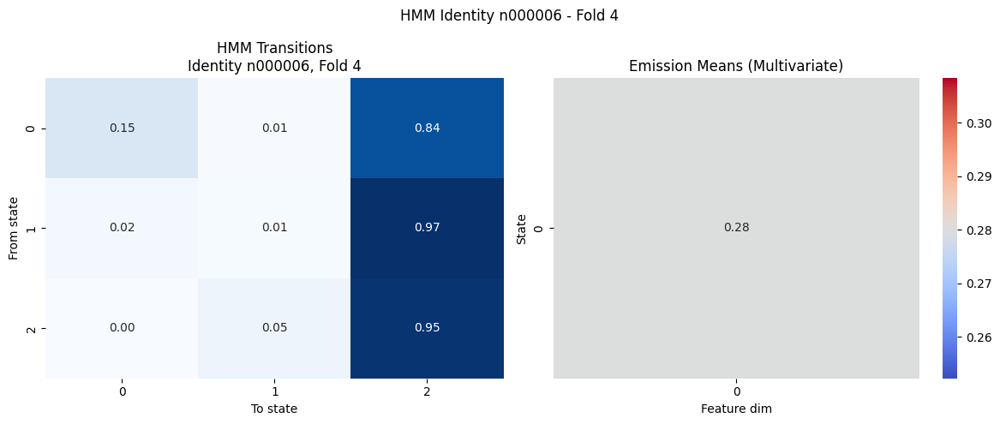

...

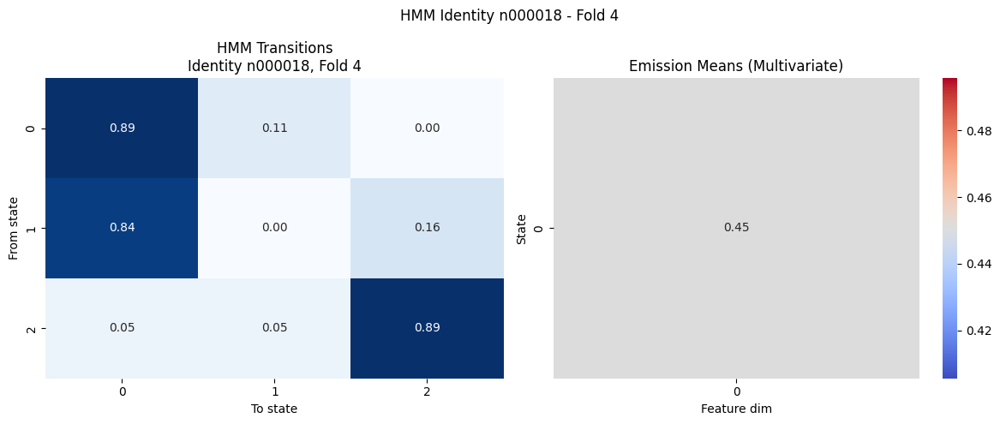

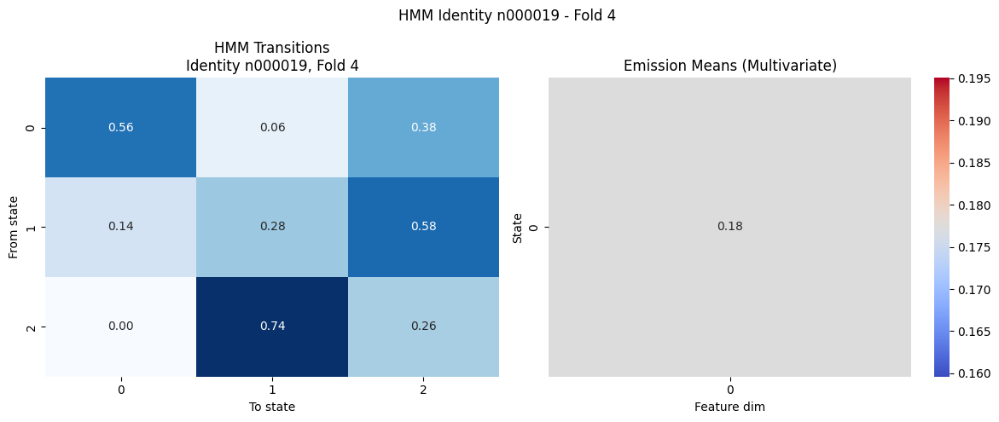

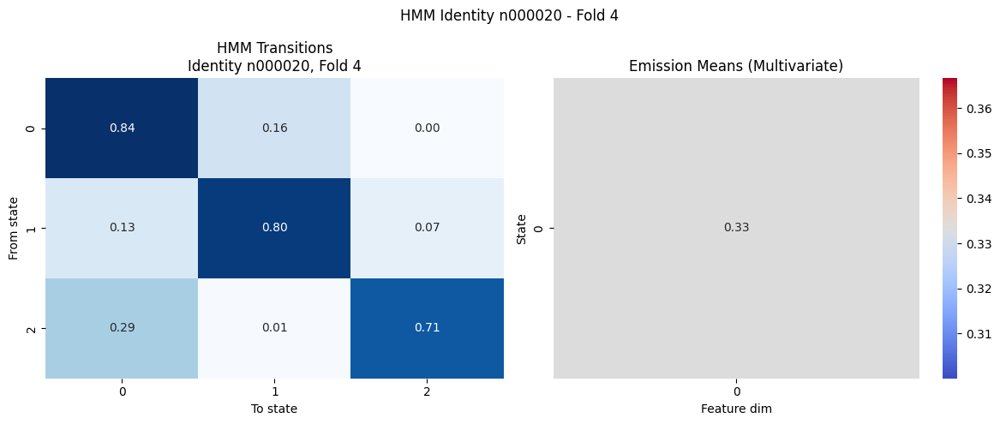

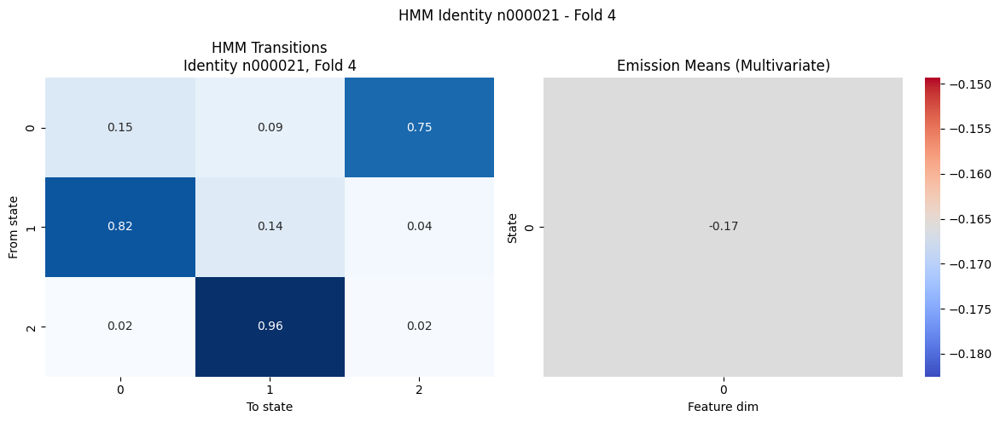

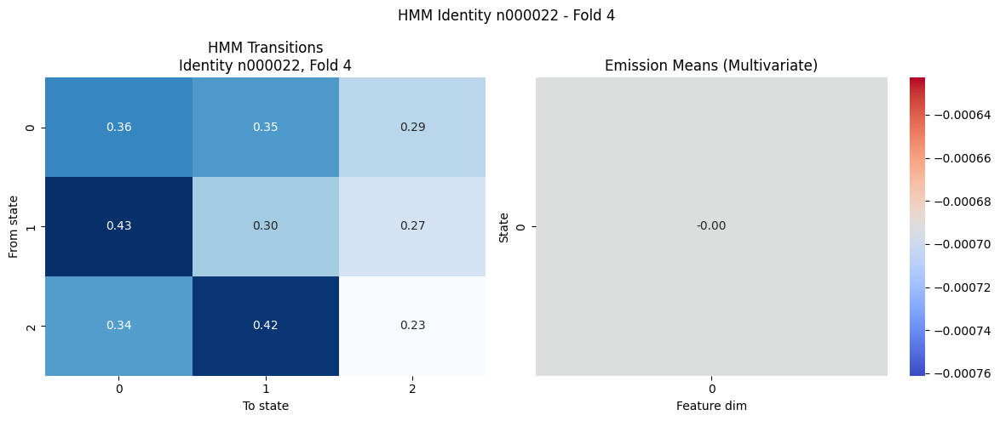


=== HMM: Fold 5 ===
Acc: 0.7809954751131222 
Prec: 0.7812720890953038 
Rec: 0.7817775107781206 
F1: 0.7733531832464606


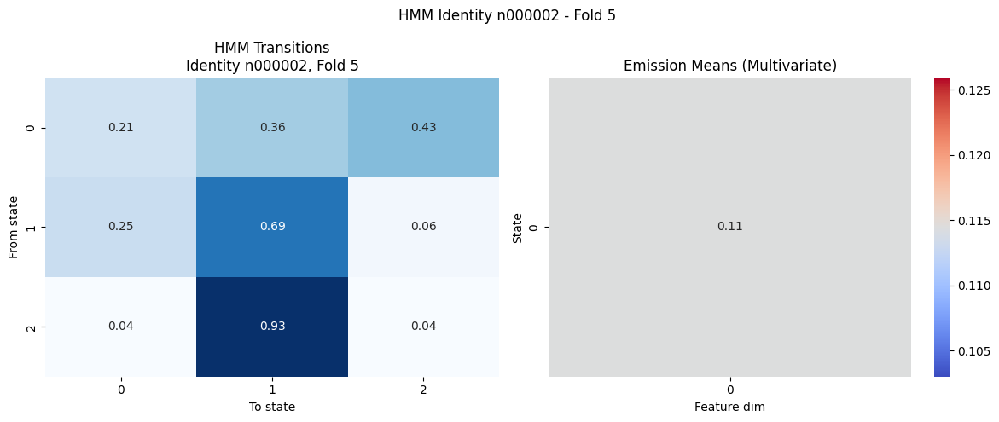

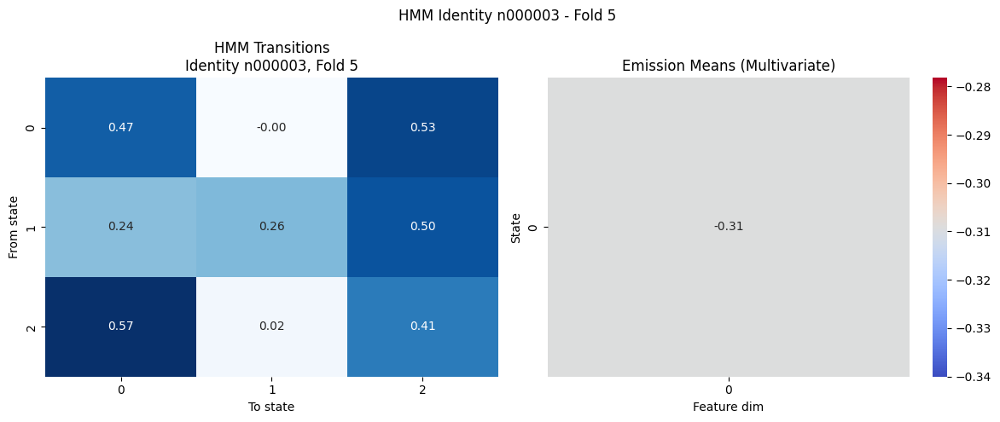

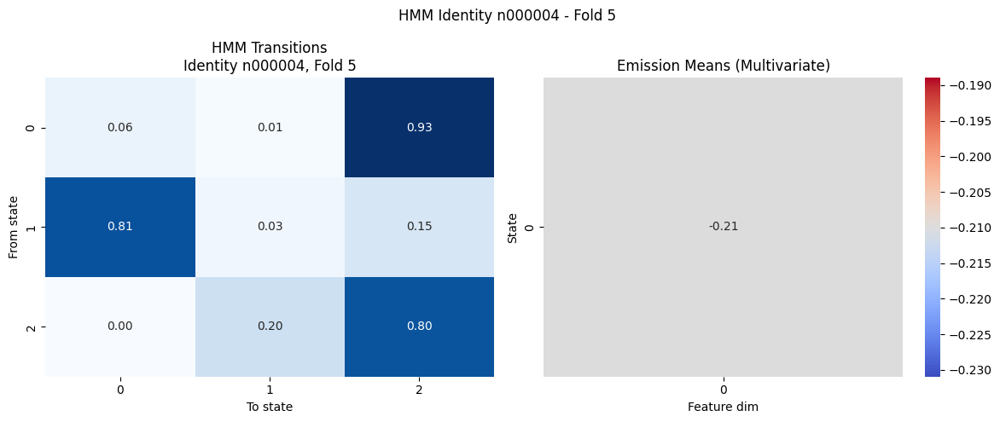

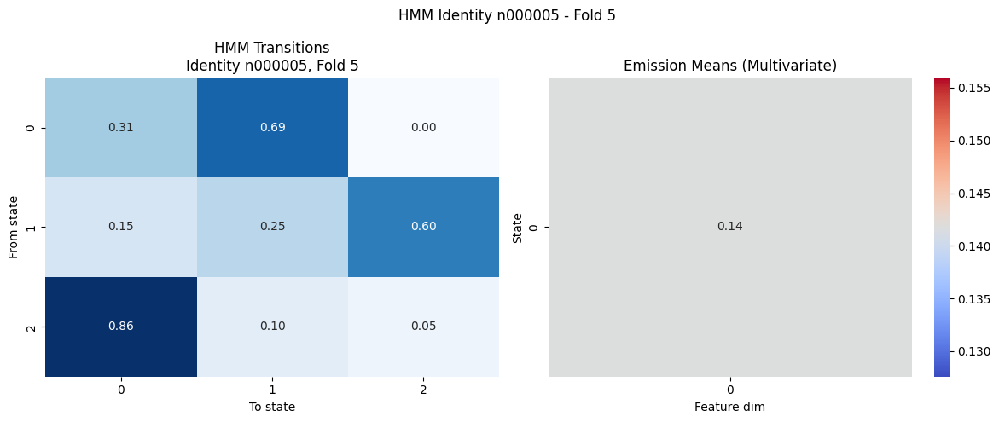

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


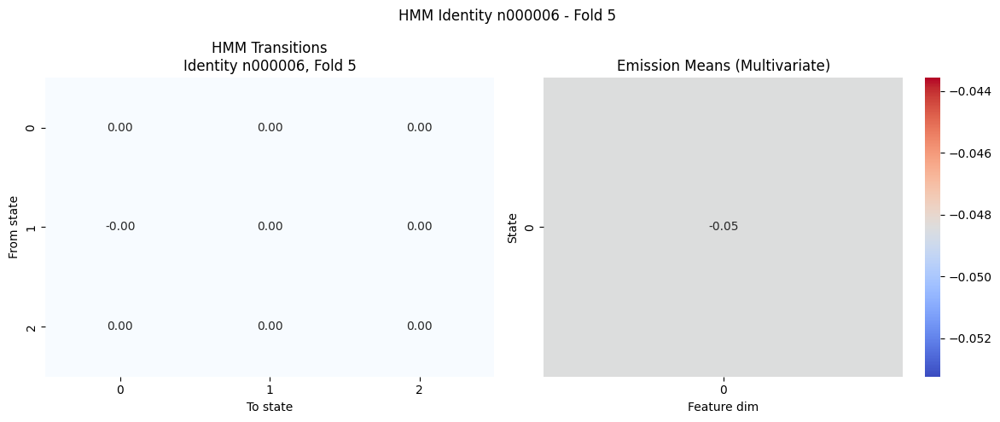

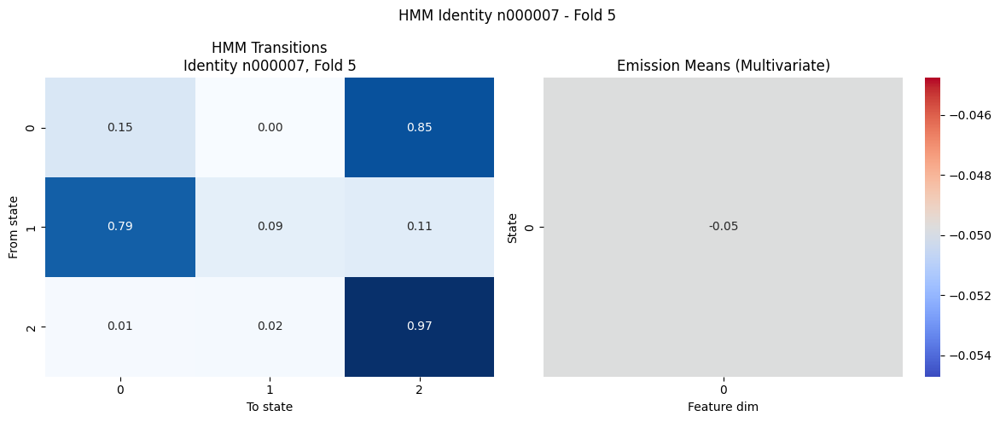

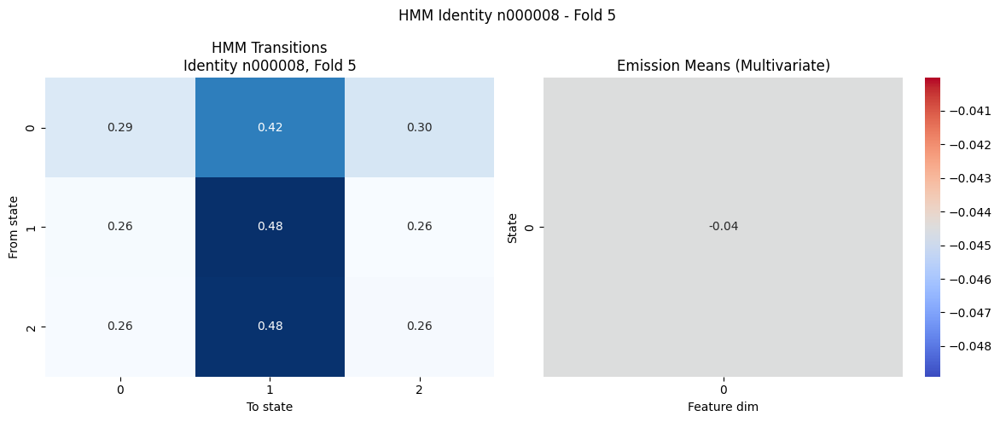

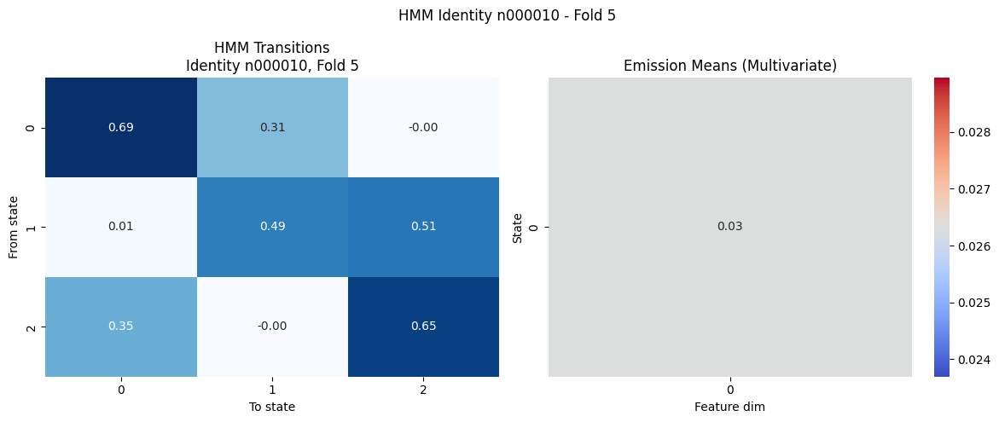

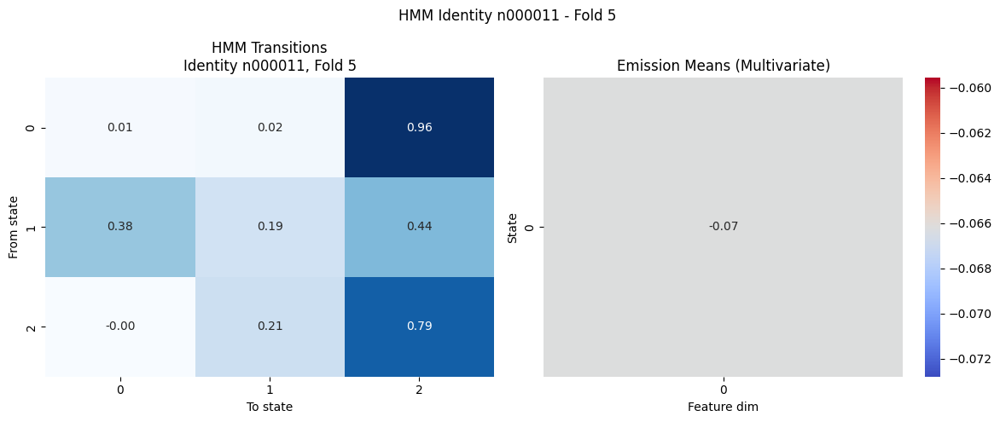

...

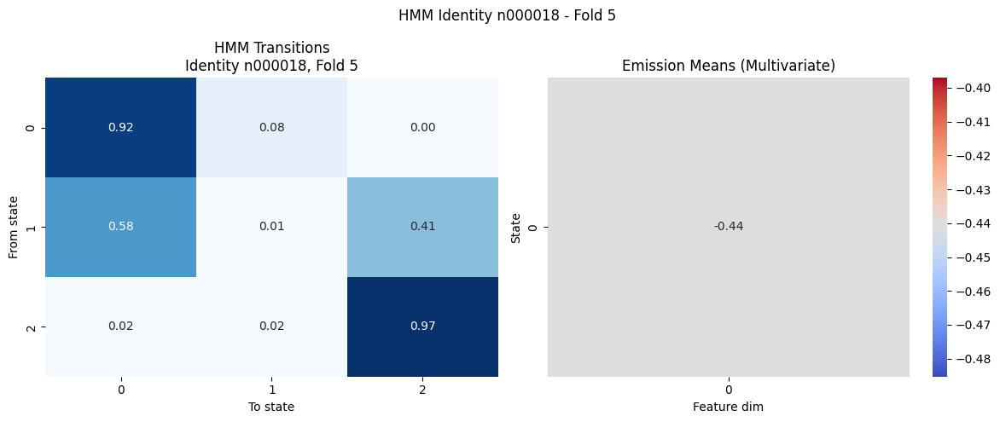

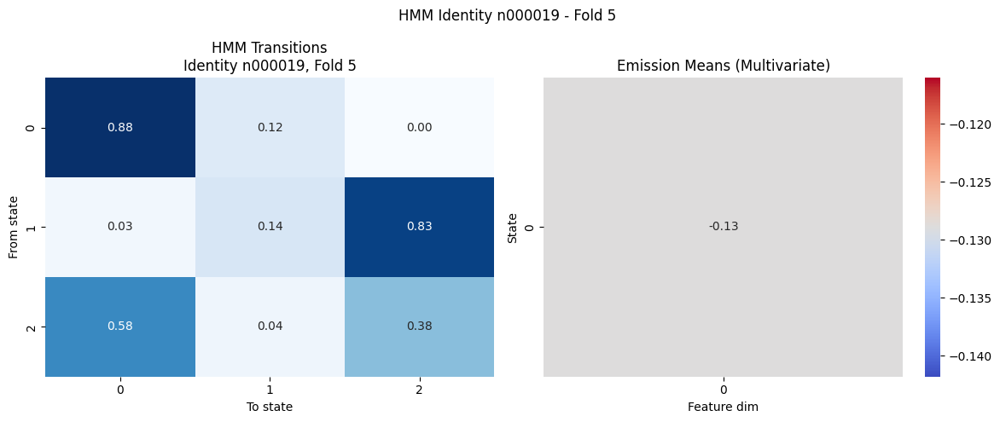

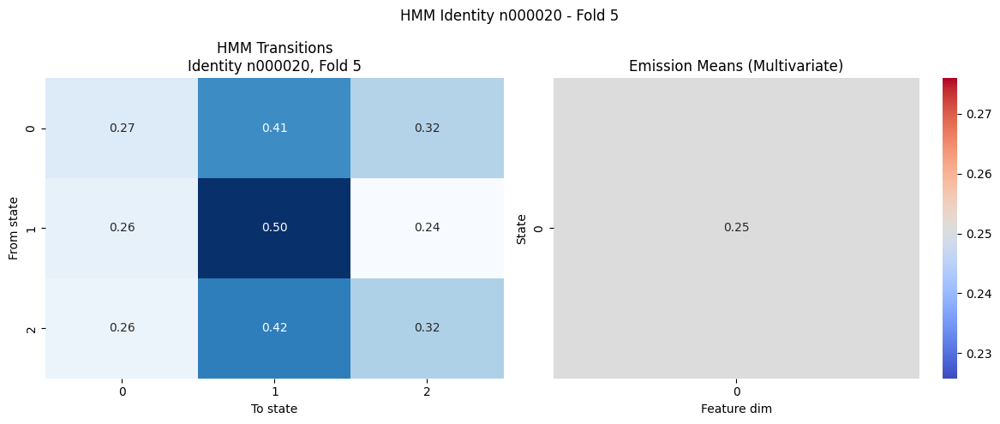

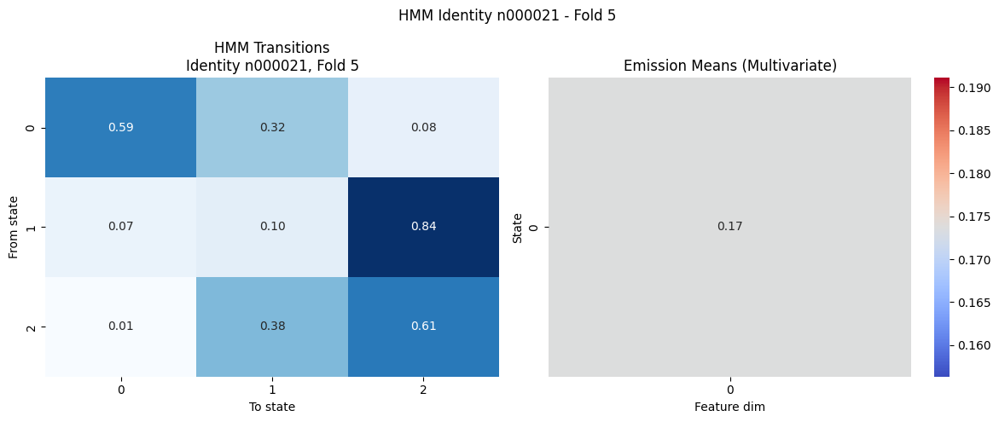

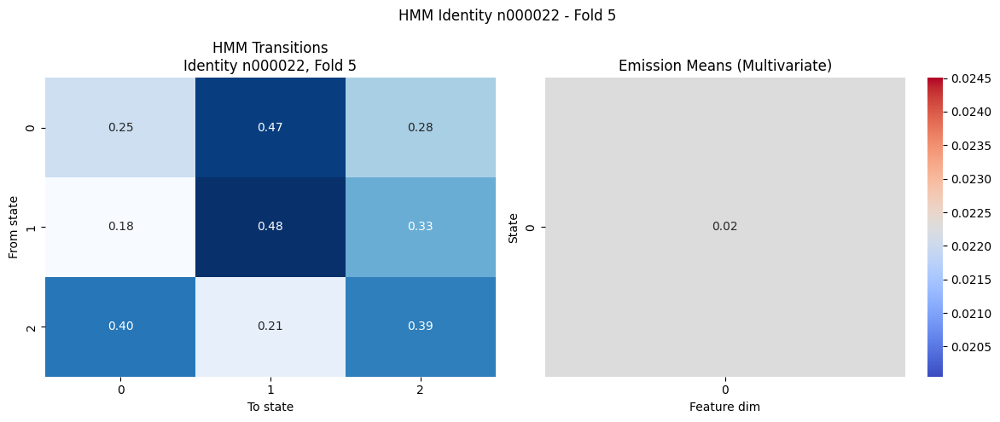

In [ ]:
metrics_hmm, models_hmm = cross_validate_hmm(embeddings, labels, pca_dim=10, folds=5, show_struct_params=True)

In [ ]:
summarize(metrics_hmm)


BN 5-fold CV results:
Acc: 0.827 ± 0.032
Prec: 0.825 ± 0.031
Rec: 0.826 ± 0.030
F1: 0.821 ± 0.033


### pomegranate - General Mixture Model


=== GMM: Fold 1 ===
Acc: 0.984629294755877 
Prec: 0.9844834552395272 
Rec: 0.9854281949934123 
F1: 0.9847962162665137


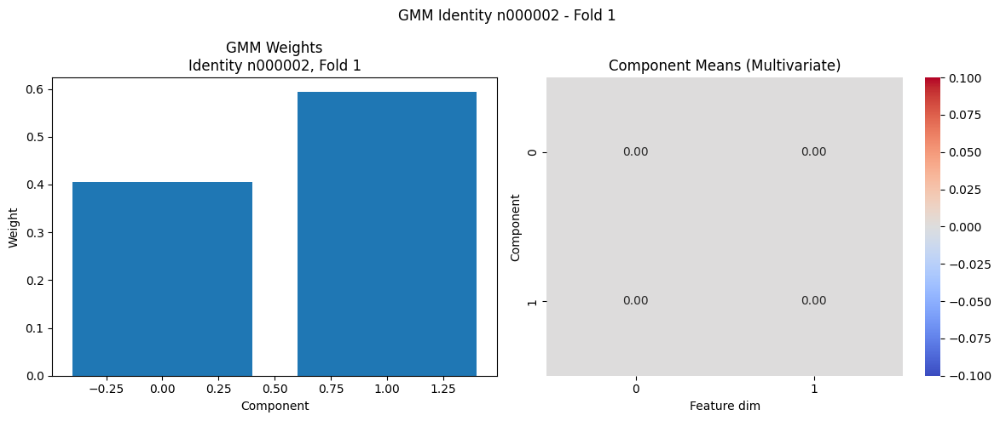

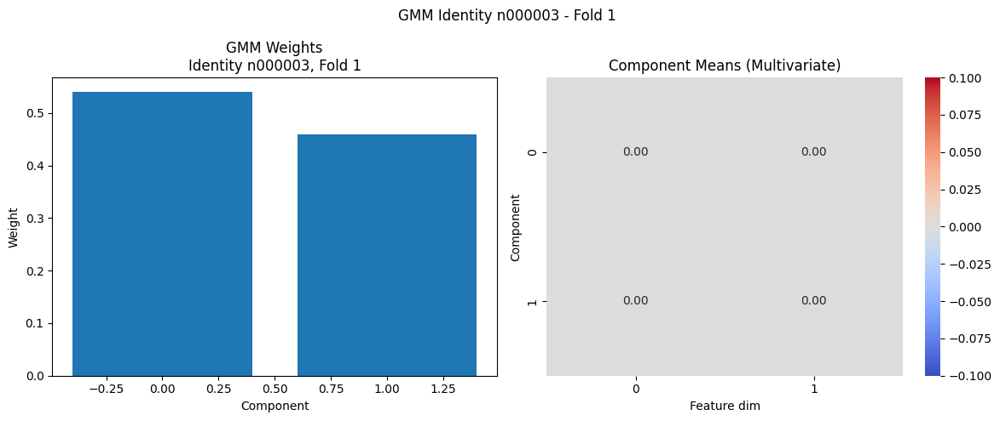

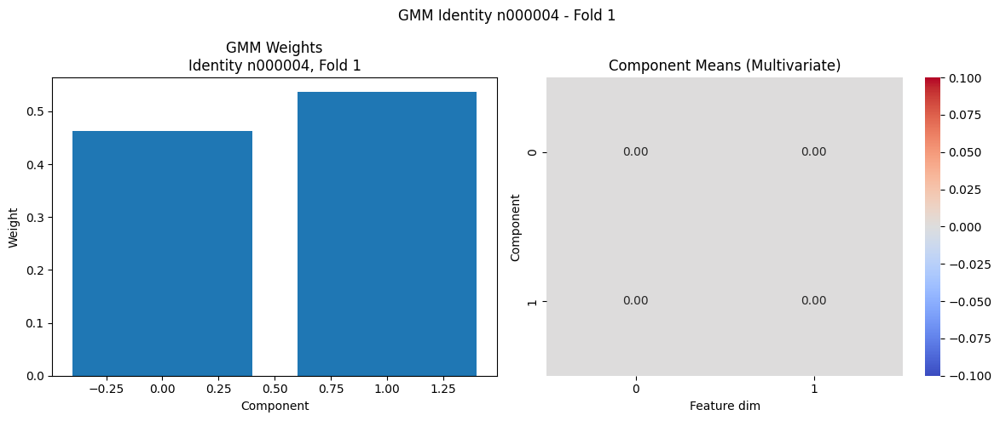

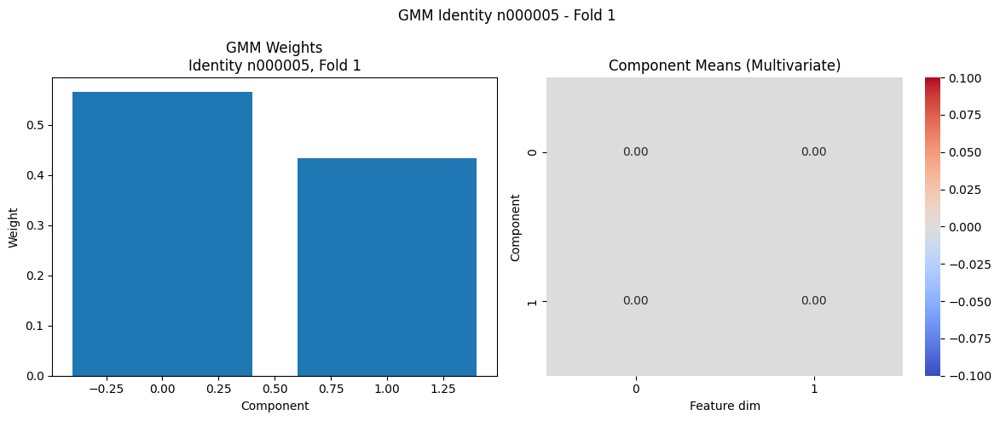

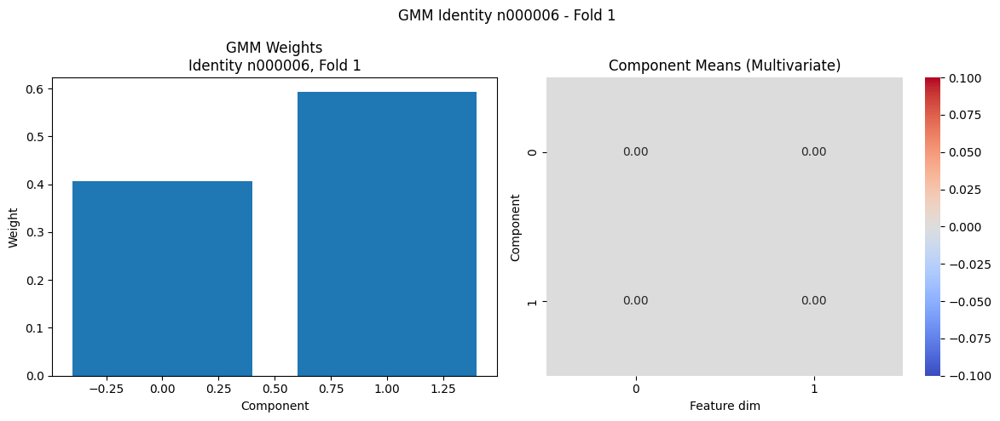

...

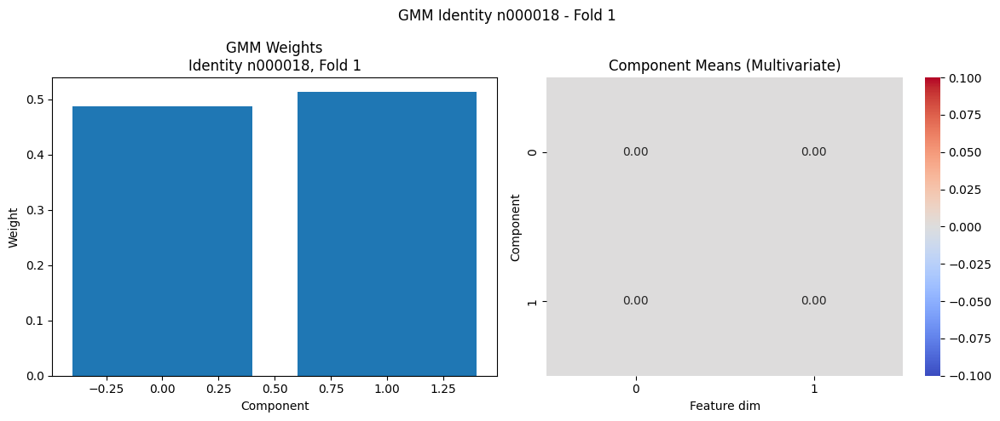

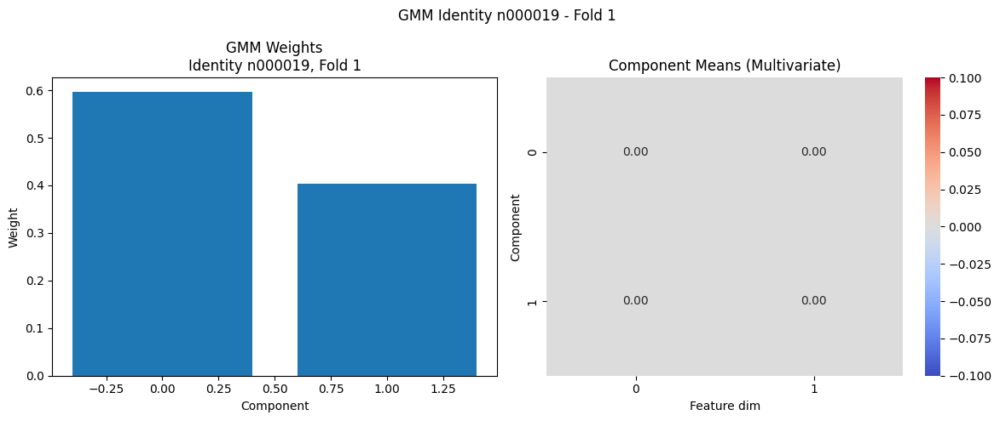

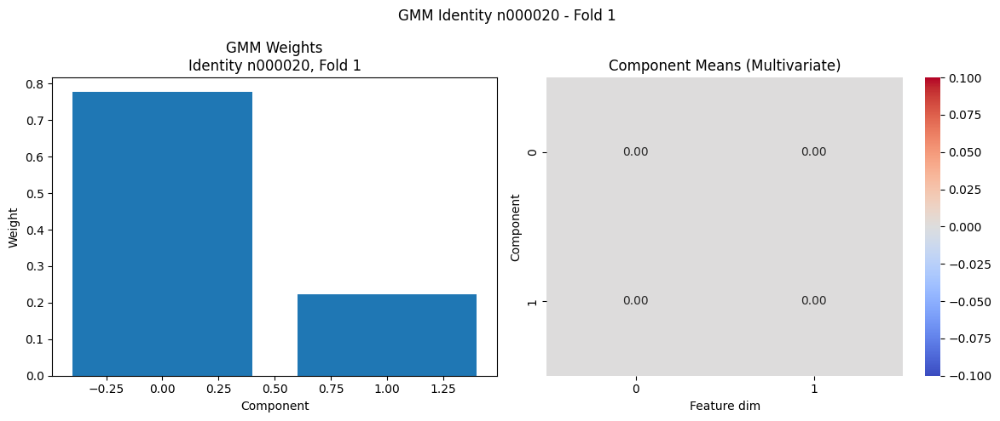

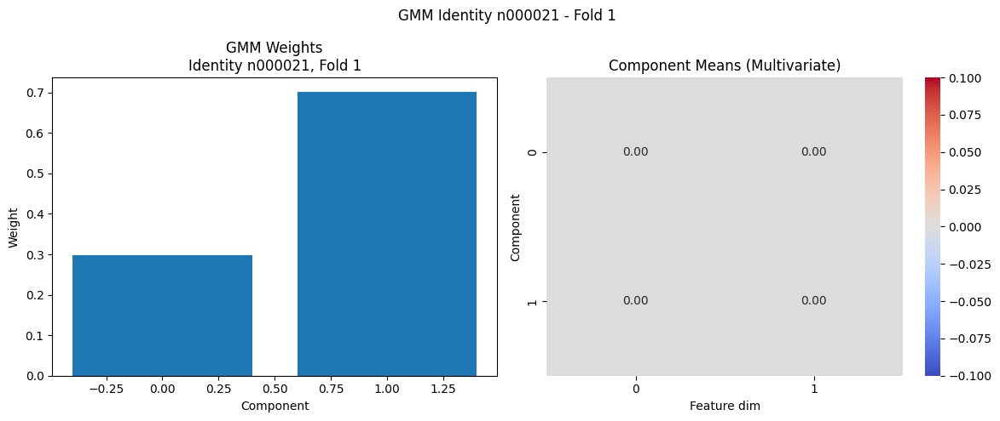

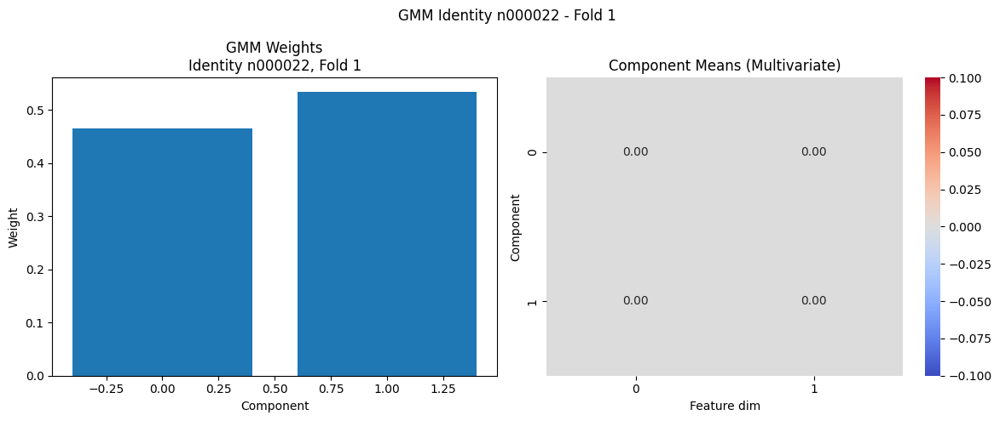


=== GMM: Fold 2 ===
Acc: 0.9746835443037974 
Prec: 0.9742496988491599 
Rec: 0.9737291515875823 
F1: 0.9736782149723477


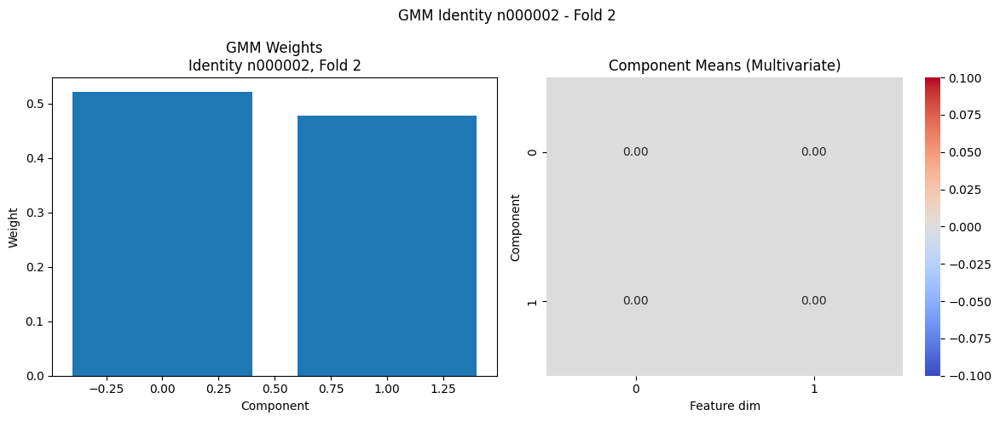

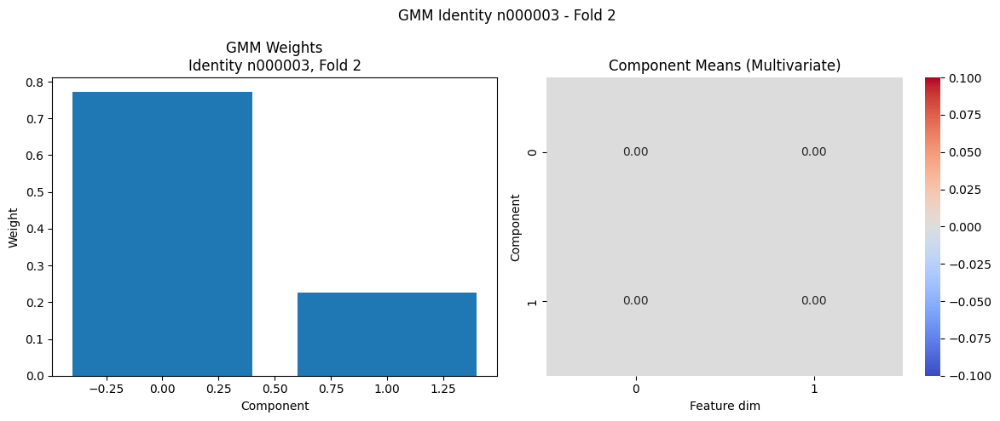

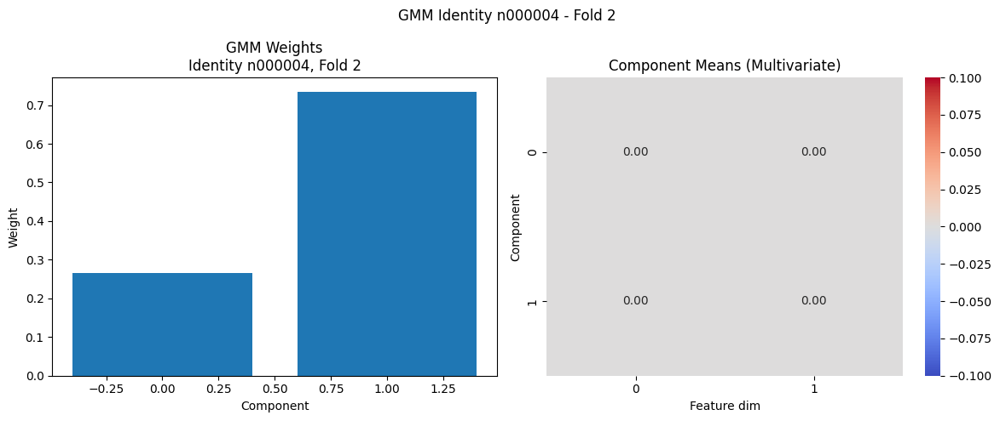

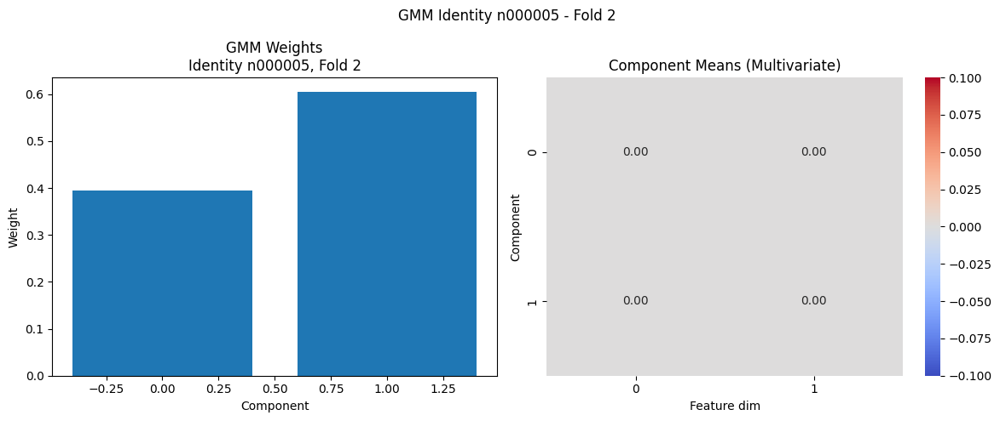

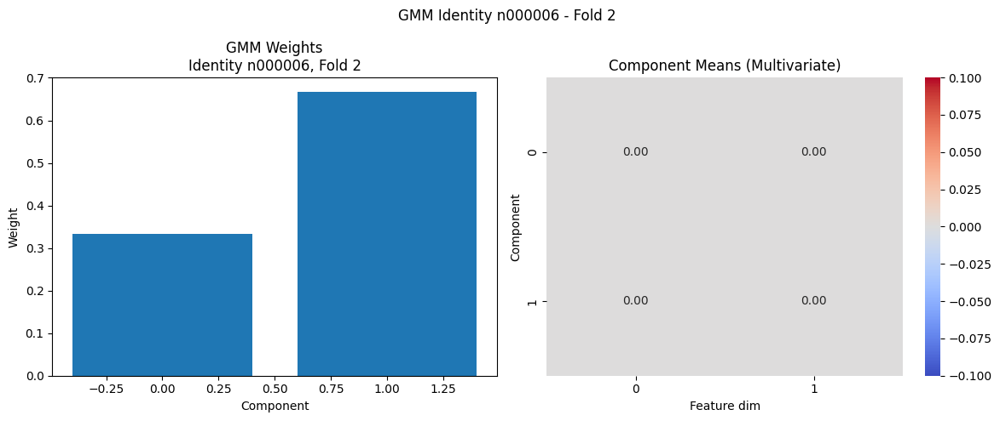

...

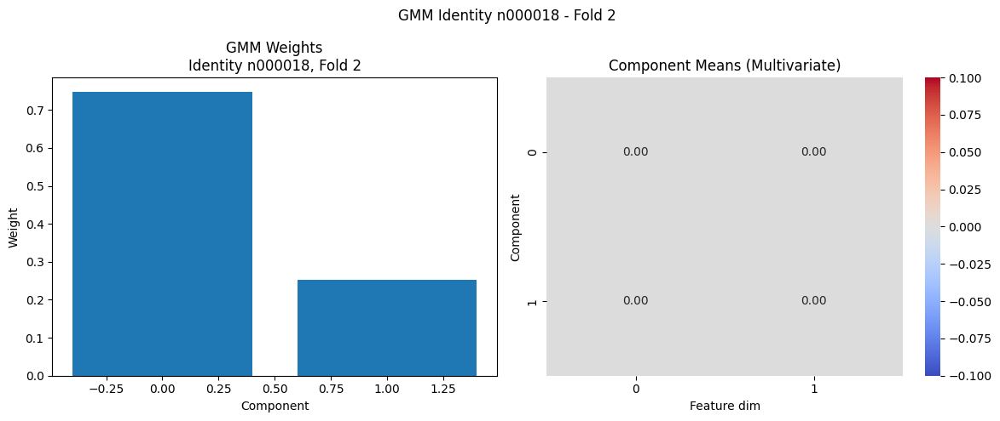

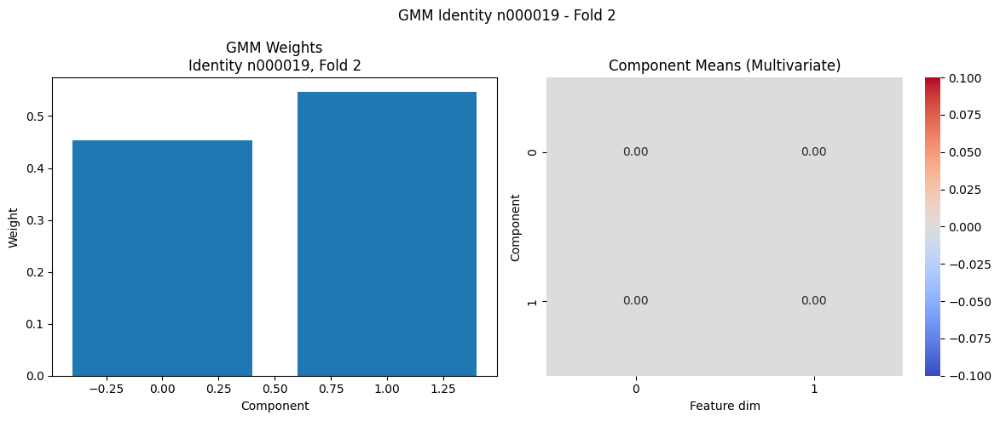

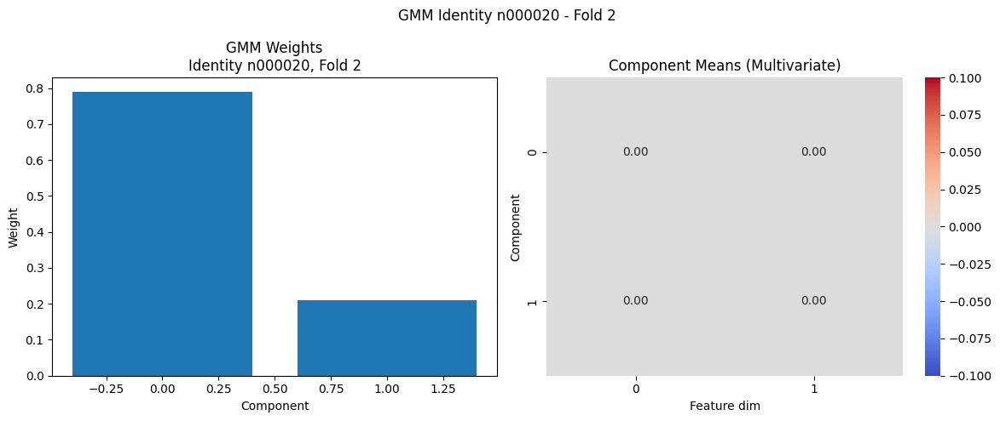

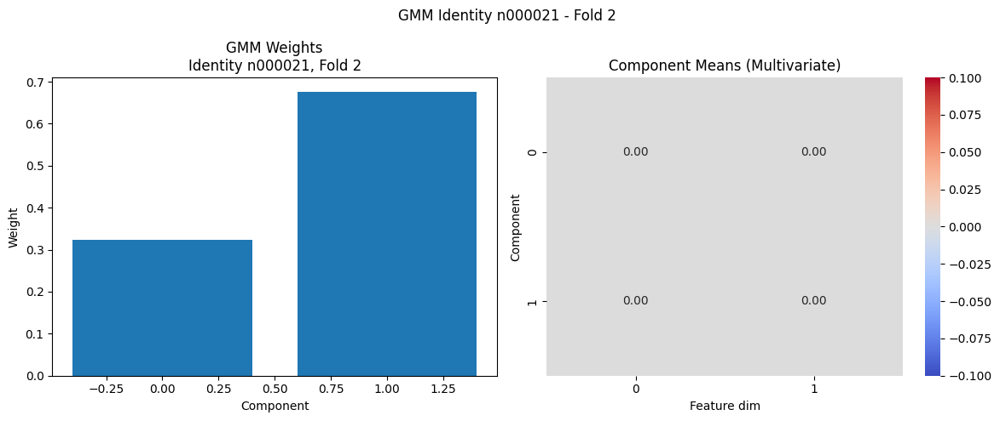

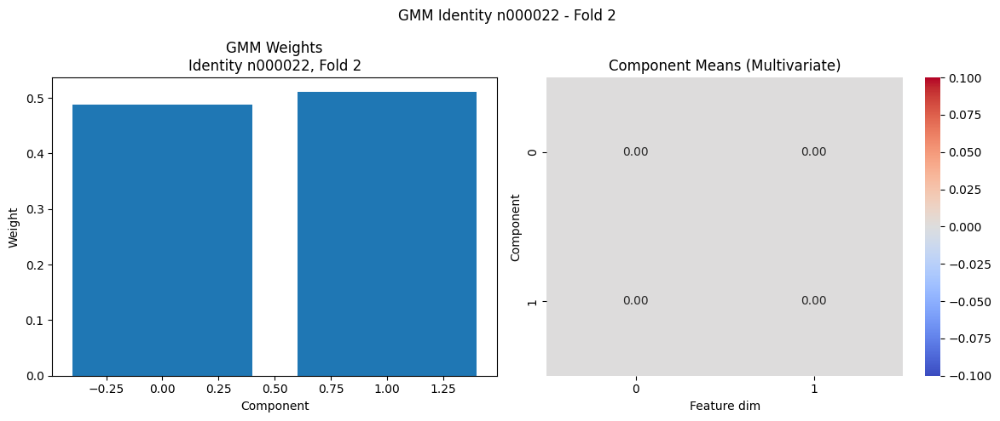


=== GMM: Fold 3 ===
Acc: 0.9764705882352941 
Prec: 0.9763971312723674 
Rec: 0.9760332814298941 
F1: 0.9760156167986356


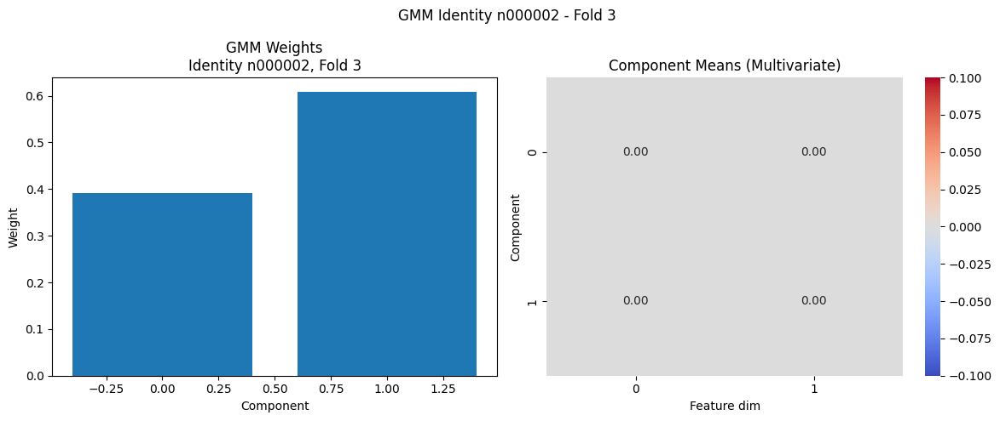

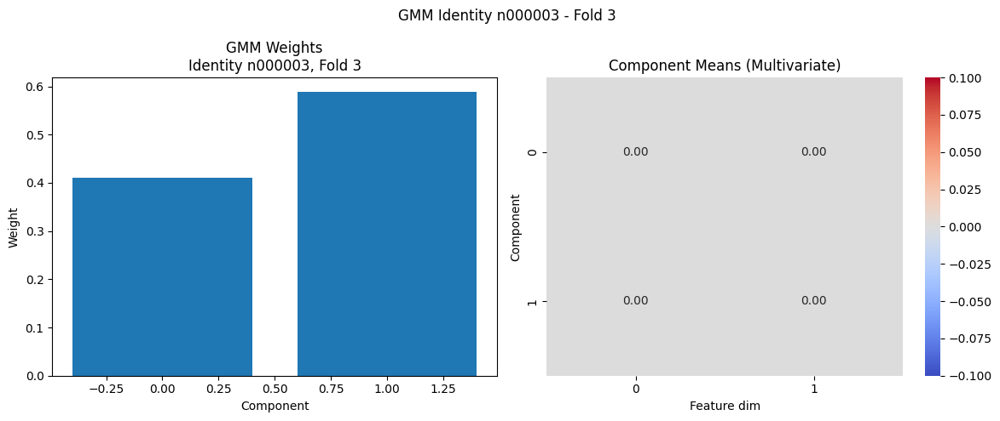

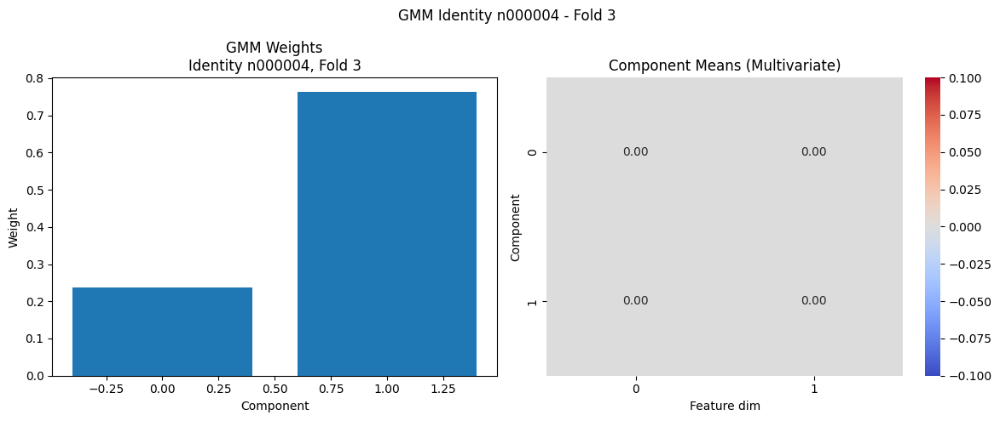

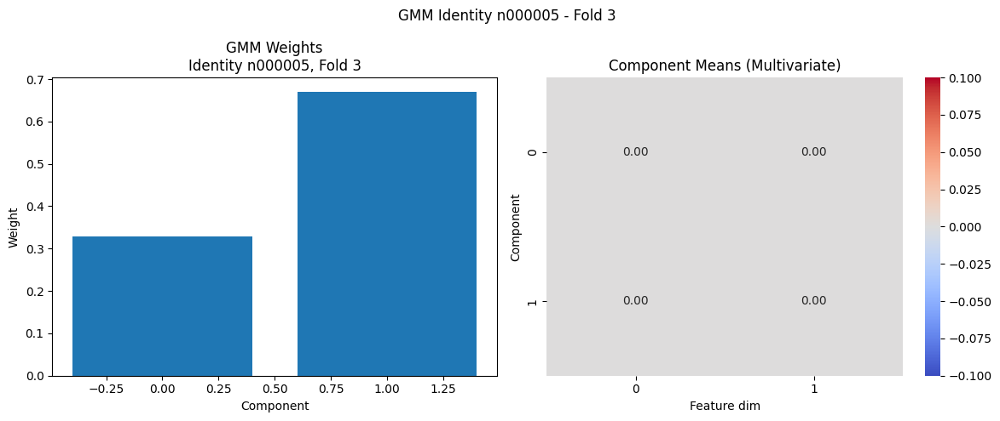

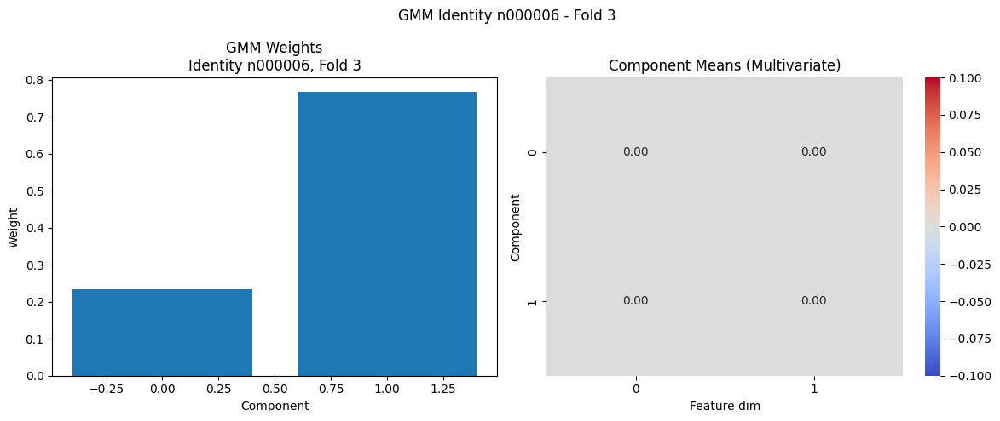

...

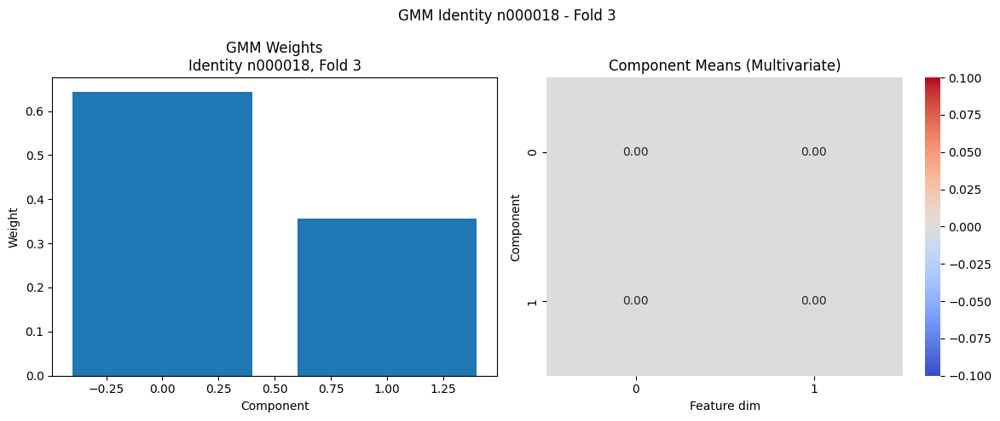

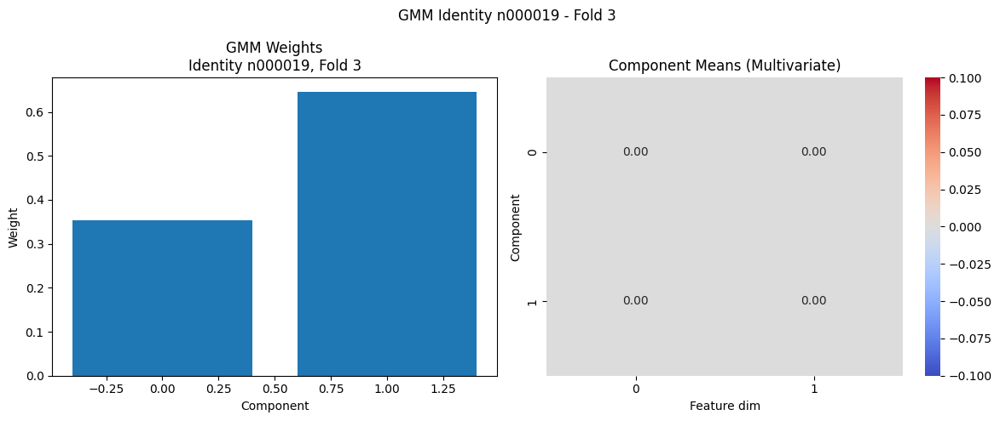

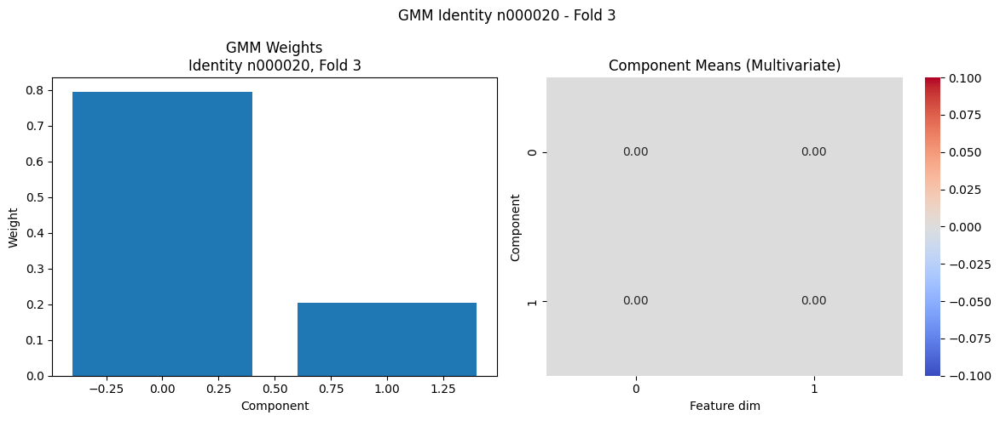

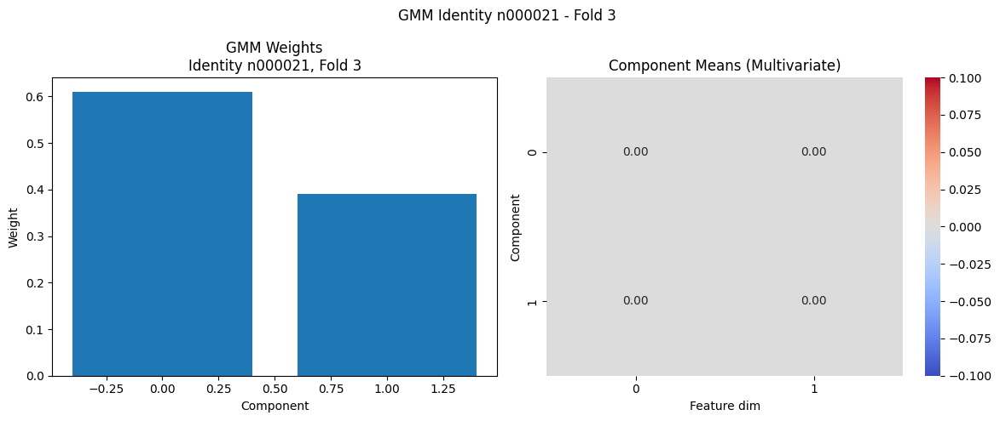

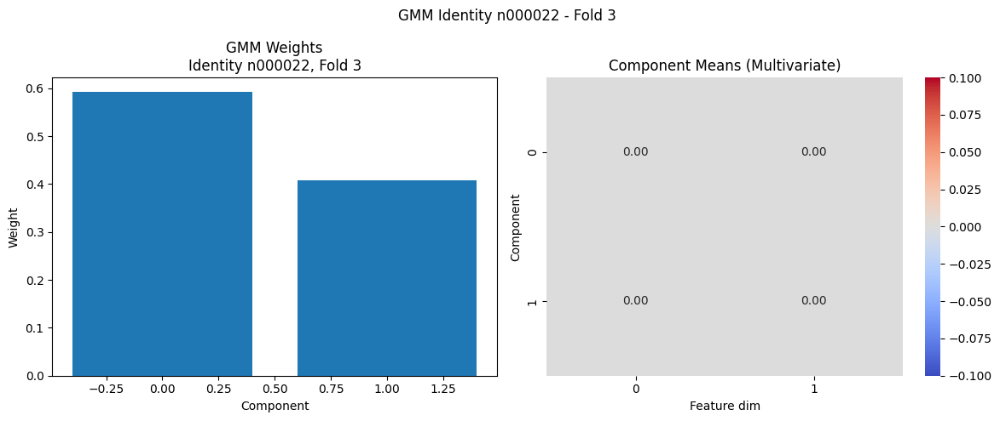


=== GMM: Fold 4 ===
Acc: 0.9746606334841629 
Prec: 0.9730989050760968 
Rec: 0.9741882691545106 
F1: 0.9733980456818401


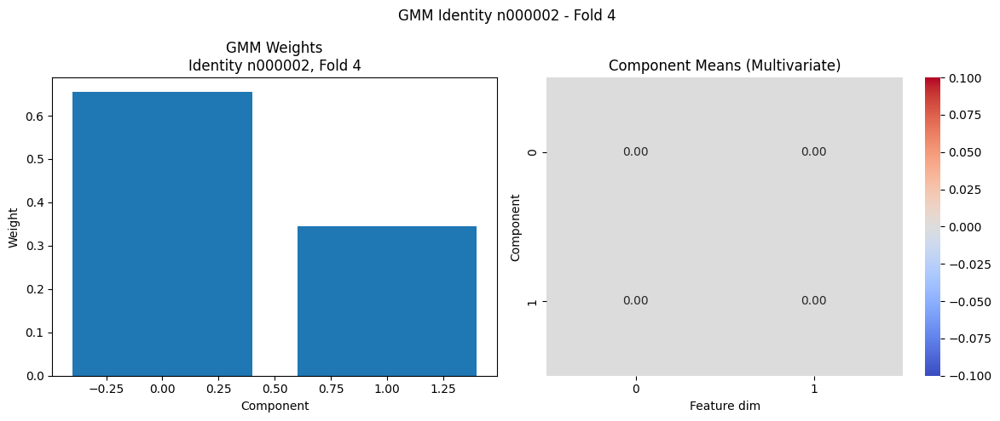

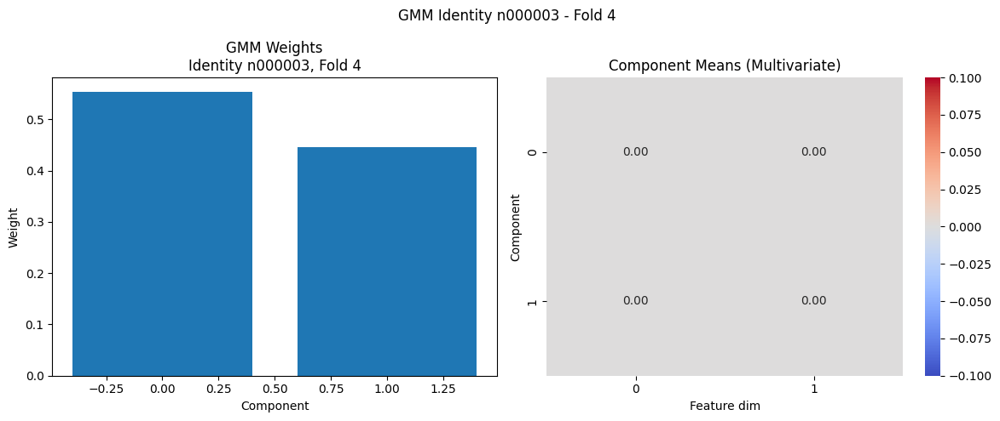

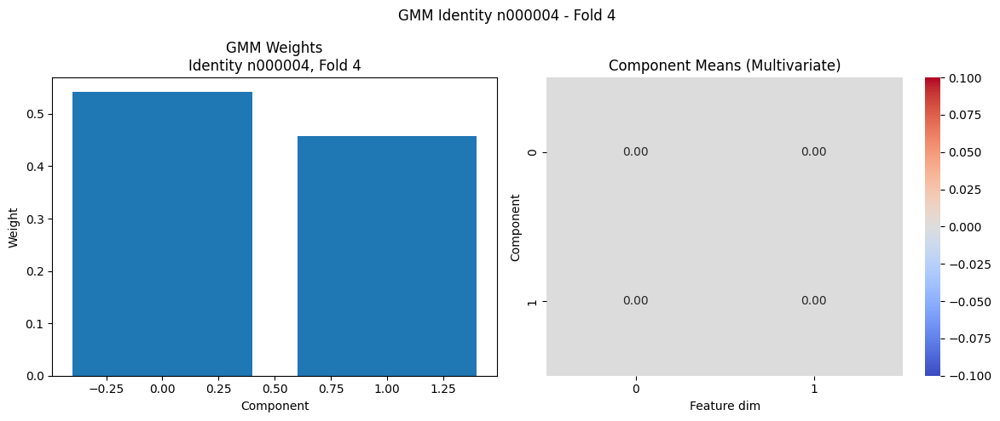

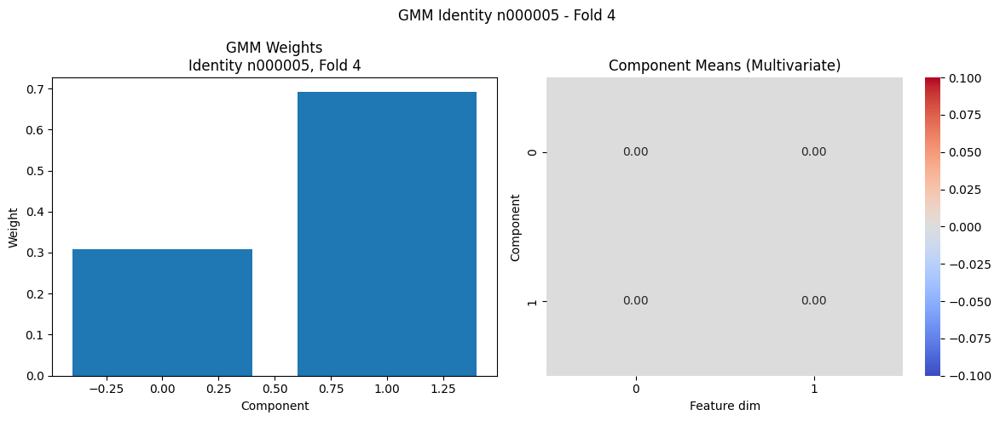

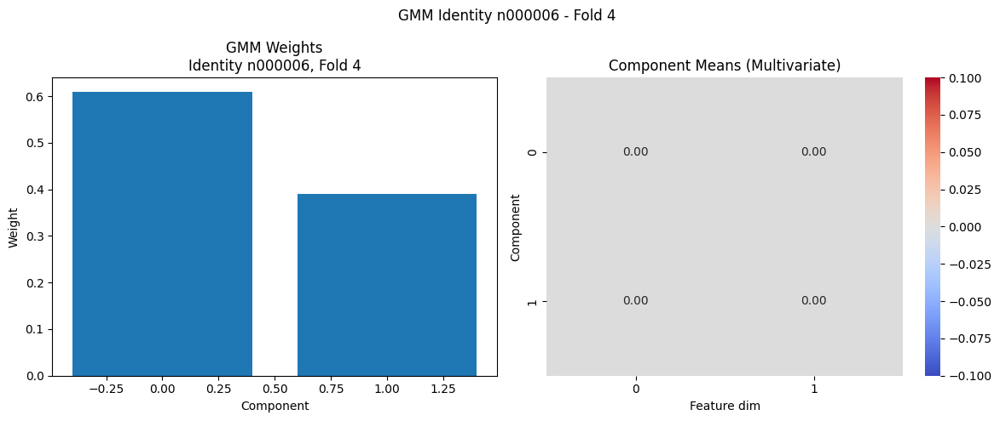

...

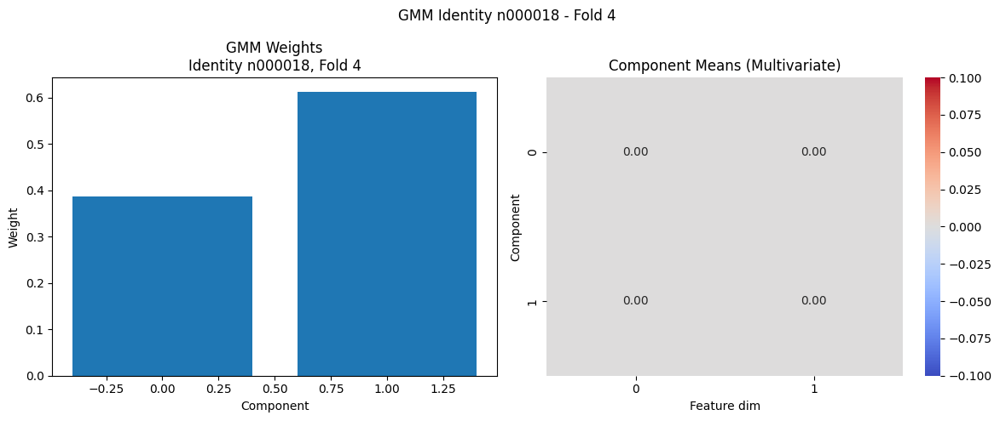

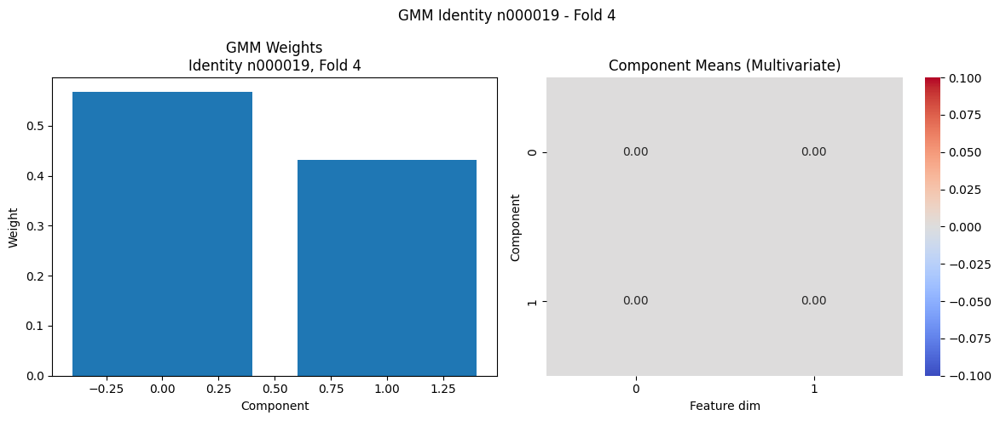

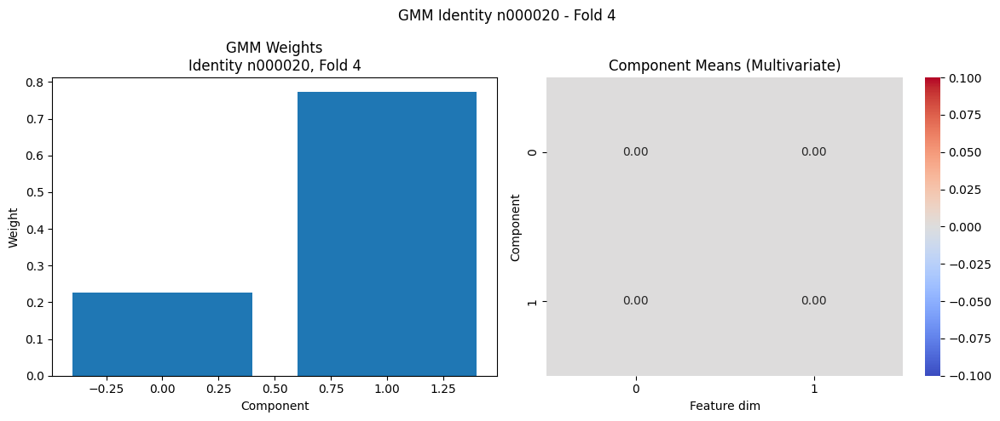

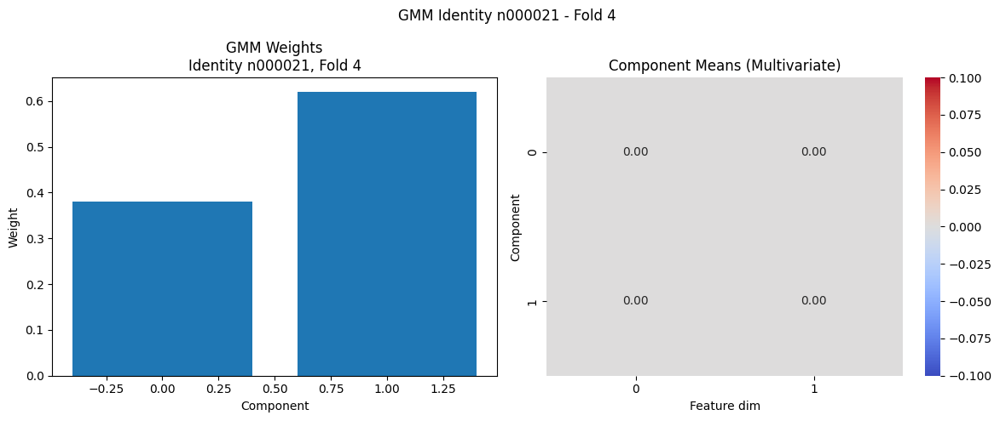

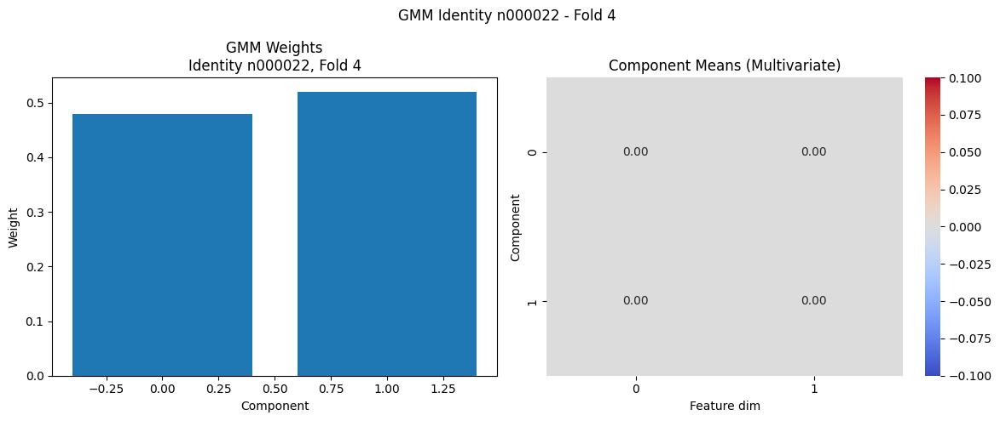


=== GMM: Fold 5 ===
Acc: 0.9764705882352941 
Prec: 0.9744123143360591 
Rec: 0.9760369649898054 
F1: 0.9745111965663235


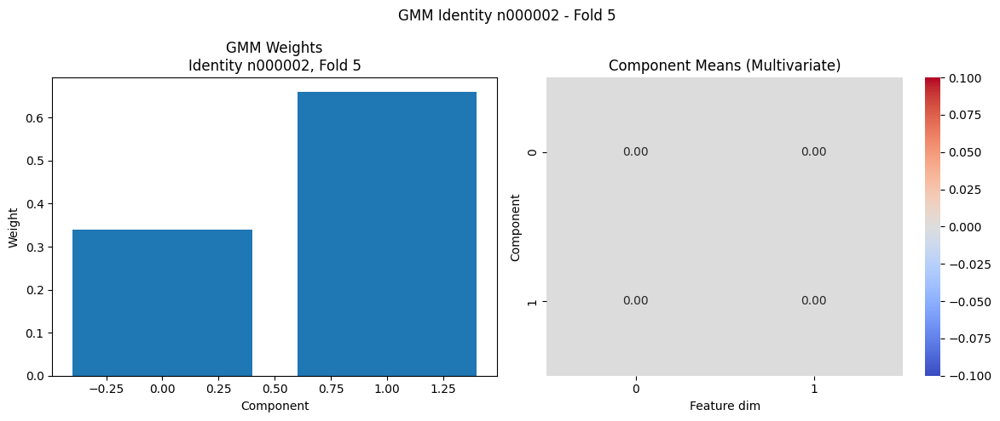

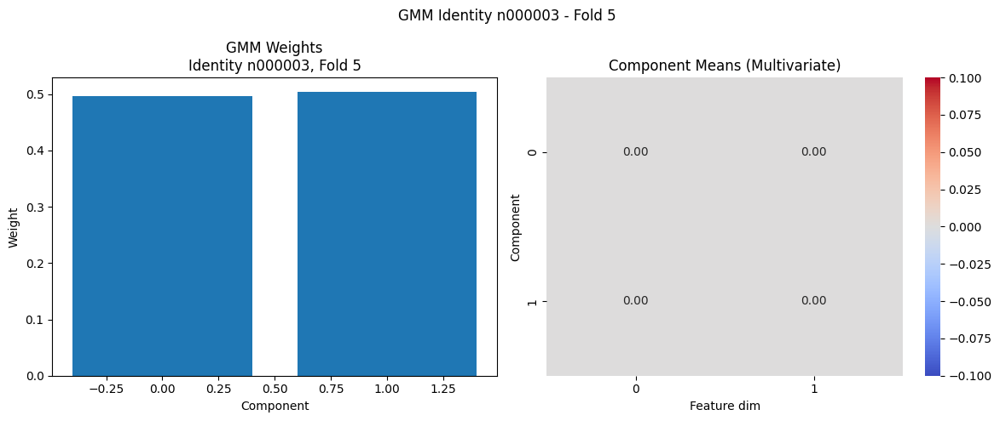

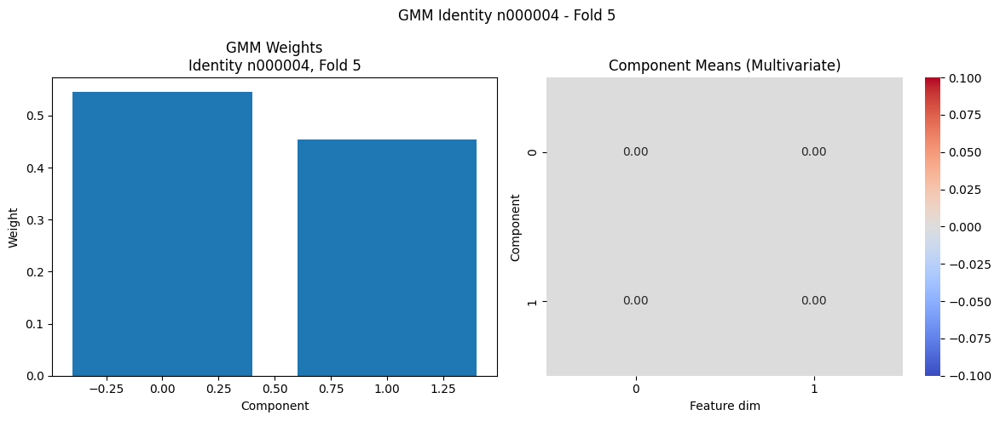

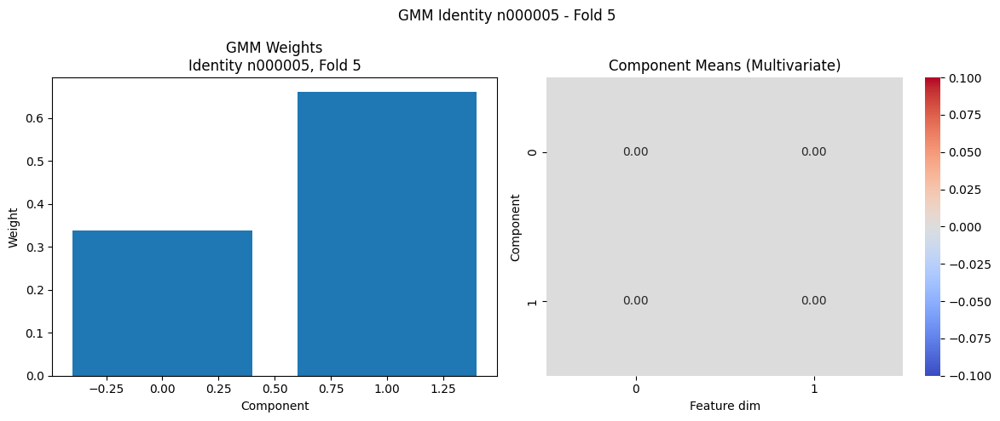

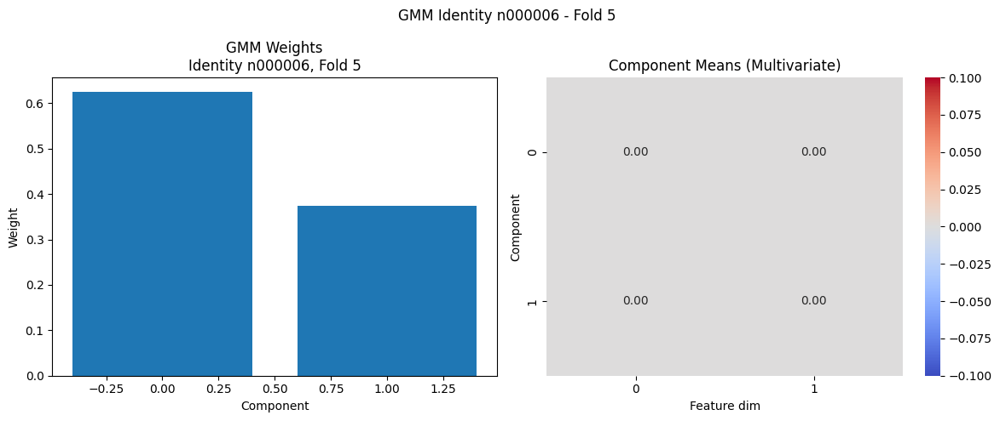

...

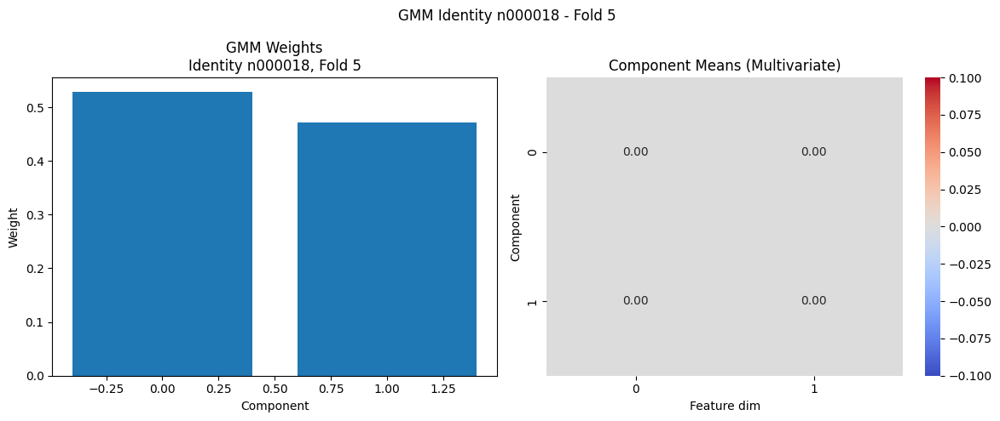

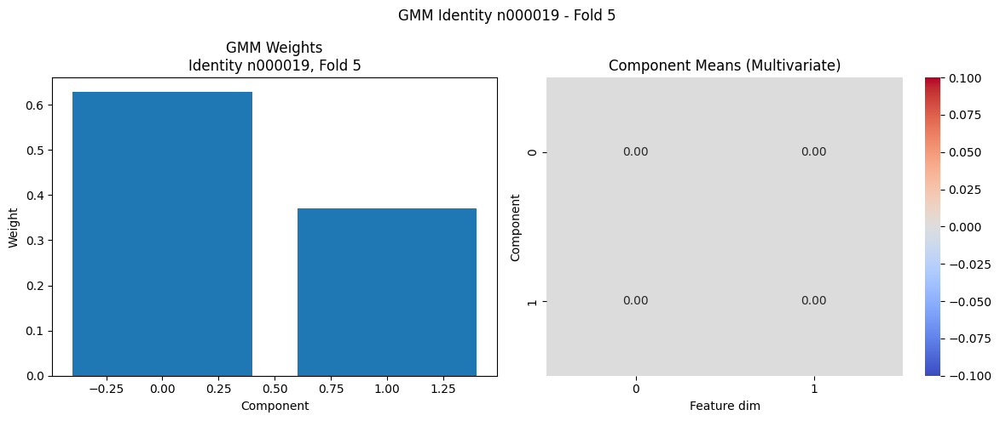

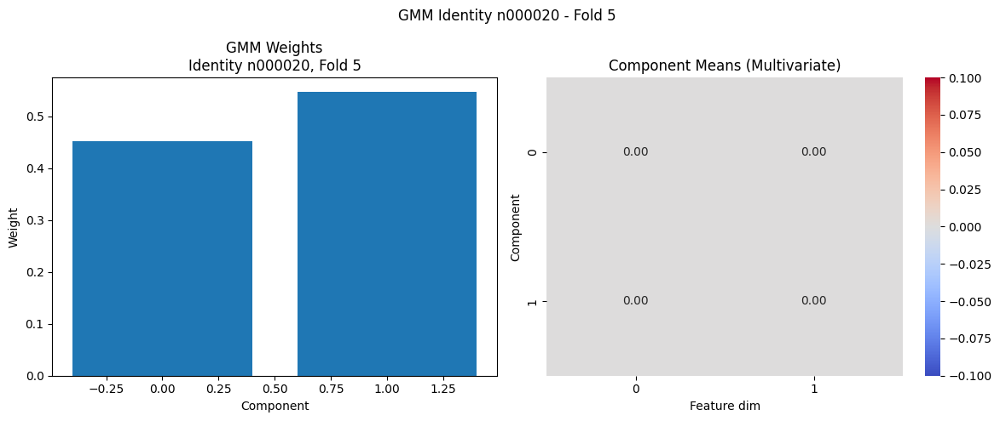

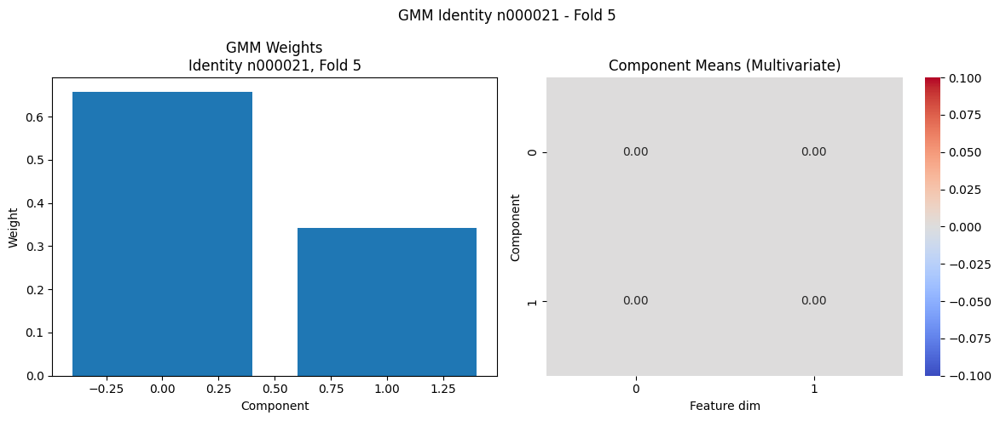

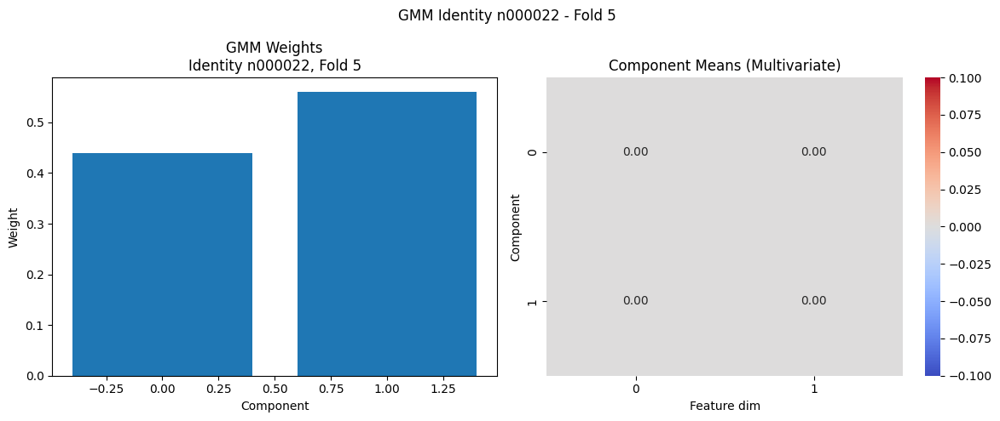

In [ ]:
metrics_gmm, models_gmm = cross_validate_gmm(embeddings, labels, pca_dim=10, folds=5, show_struct_params=True)

In [ ]:
summarize(metrics_gmm)


BN 5-fold CV results:
Acc: 0.977 ± 0.004
Prec: 0.977 ± 0.004
Rec: 0.977 ± 0.004
F1: 0.976 ± 0.004


## Face Identification

In [ ]:
import random
import numpy as np

def demo_face_identification(data_path, n_samples=5,
                             bn_model=None, lgbn_model=None,
                             gmm_model=None, hmm_model=None):
    image_paths = glob(os.path.join(data_path, "*/*.jpg"))
    chosen = random.sample(image_paths, min(n_samples, len(image_paths)))

    fig, axes = plt.subplots(1, len(chosen), figsize=(5 * len(chosen), 5))

    for ax, img_path in zip(axes, chosen):
        img = Image.open(img_path).convert("RGB")
        emb = get_embedding(img_path).reshape(1, -1)

        results = []

        # ----- Discrete BN -----
        if bn_model:
            pca_bn = bn_model["pca"]
            enc_bn = bn_model["disc_enc"]
            infer_bn = bn_model["infer"]
            features_bn = bn_model["features"]
            state_names = bn_model["state_names"]

            x_pca_bn = pca_bn.transform(emb)
            x_disc = enc_bn.transform(x_pca_bn).astype(int)[0]
            row_disc = pd.DataFrame([x_disc], columns=features_bn)

            obs = {f: int(row_disc.iloc[0][f]) for f in features_bn}
            q = infer_bn.query(variables=["Identity"], evidence=obs, show_progress=False)
            vals, order = q.values.flatten(), q.state_names["Identity"]
            probs = np.array([vals[order.index(s)] if s in order else 0 for s in state_names["Identity"]])
            pred_bn = state_names["Identity"][np.argmax(probs)]
            conf_bn = np.max(probs)
            results.append(f"BN: {pred_bn} ({conf_bn:.2f})")

        # ----- LGBN -----
        if lgbn_model:
            pca_lgbn = lgbn_model["pca"]
            lgbn = lgbn_model["lgbn"]
            features_lgbn = lgbn_model["features"]
            identities = lgbn_model["identities"]
            id_map = lgbn_model["id_map"]

            x_pca_lgbn = pca_lgbn.transform(emb)
            row_cont = pd.DataFrame(x_pca_lgbn, columns=features_lgbn)
            pred_lgbn = predict_lgbn(lgbn, features_lgbn, identities, id_map, row_cont.iloc[0])

            # Likelihoods = confidence
            likelihoods = []
            for identity in identities:
                identity_num = id_map[identity]
                log_prob = 0.0
                for cpd in lgbn.cpds:
                    if isinstance(cpd, LinearGaussianCPD) and cpd.variable in features_lgbn:
                        f = cpd.variable
                        x_val = row_cont.iloc[0][f]
                        beta = cpd.beta[0] if len(cpd.beta) > 0 else 0.0
                        std = cpd.std
                        mean = beta * identity_num
                        log_prob += -0.5 * np.log(2 * np.pi * std**2) - ((x_val - mean) ** 2) / (2 * std**2)
                likelihoods.append(log_prob)

            conf_lgbn = np.exp(likelihoods - np.max(likelihoods))
            conf_lgbn = conf_lgbn / conf_lgbn.sum()
            results.append(f"LGBN: {pred_lgbn} ({np.max(conf_lgbn):.2f})")

        # ----- GMM -----
        if gmm_model:
            pca_gmm = gmm_model["pca"]
            models = gmm_model["models"]
            x_pca_gmm = pca_gmm.transform(emb)

            scores = {identity: model.log_probability(x_pca_gmm)
                      for identity, model in models.items()}
            identities = list(scores.keys())
            log_probs = np.array(list(scores.values()))

            probs = np.exp(log_probs - np.max(log_probs))
            probs /= probs.sum()

            pred_gmm = identities[np.argmax(probs)]
            conf_gmm = np.max(probs)
            results.append(f"GMM: {pred_gmm} ({conf_gmm:.2f})")

        # ----- HMM -----
        if hmm_model:
            pca_hmm = hmm_model["pca"]
            models = hmm_model["models"]

            x_pca_hmm = pca_hmm.transform(emb)
            seq = x_pca_hmm[:, [0]].reshape(1, -1, 1)

            scores = {identity: model.log_probability(seq)
              for identity, model in models.items()}
            identities = list(scores.keys())
            log_probs = np.array(list(scores.values()))

            probs = np.exp(log_probs - np.max(log_probs))
            probs /= probs.sum()

            pred_hmm = identities[np.argmax(probs)]
            conf_hmm = np.max(probs)
            results.append(f"HMM: {pred_hmm} ({conf_hmm:.2f})")

        # ----- Plot -----
        ax.imshow(img)
        ax.set_title("\n".join(results))
        ax.axis("off")

    plt.show()

In [ ]:
best_bn = models_bn[np.argmax(metrics_bn[:, 0])]
best_lgbn = models_lgbn[np.argmax(metrics_lgbn[:, 0])]
best_hmm = models_hmm[np.argmax(metrics_hmm[:, 0])]
best_gmm = models_gmm[np.argmax(metrics_gmm[:, 0])]

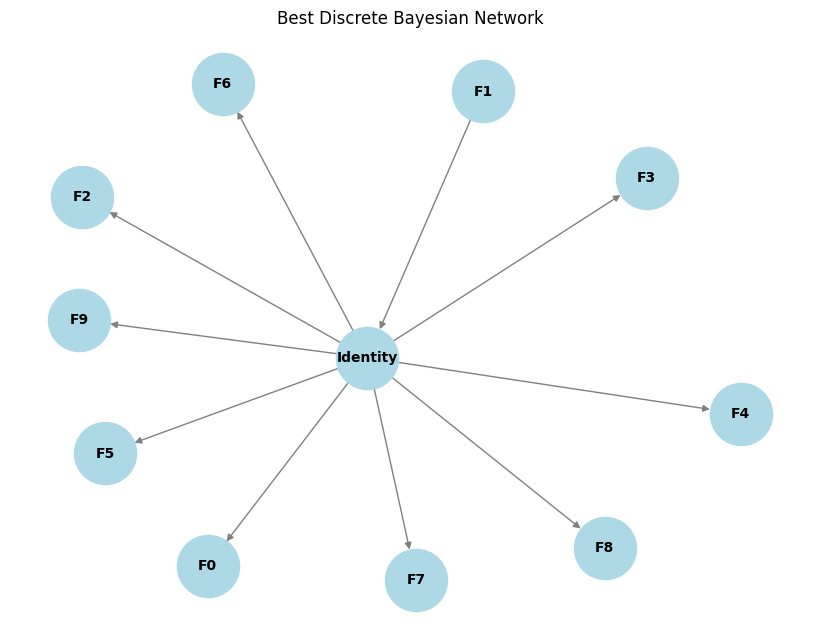

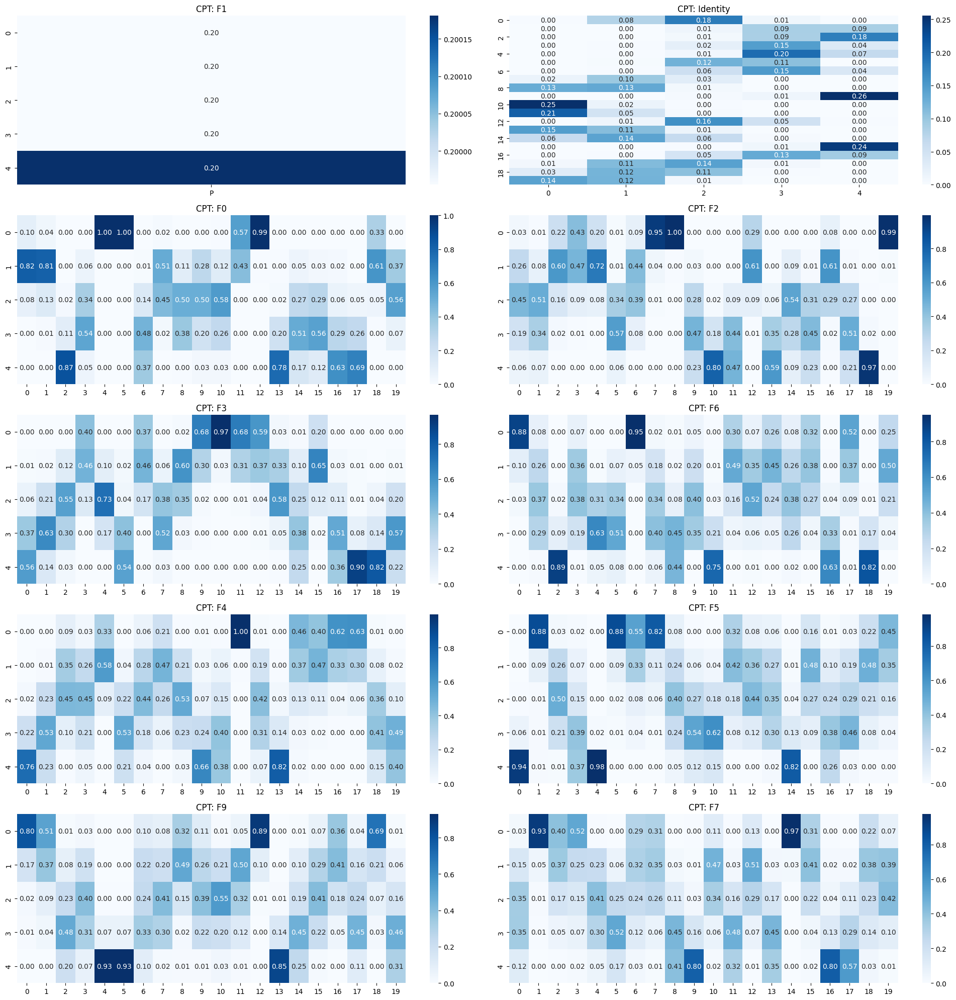

In [ ]:
plot_bn_structure(best_bn["bn"], title=f"Best Discrete Bayesian Network")
plot_bn_cpts(best_bn["bn"], max_vars=10)

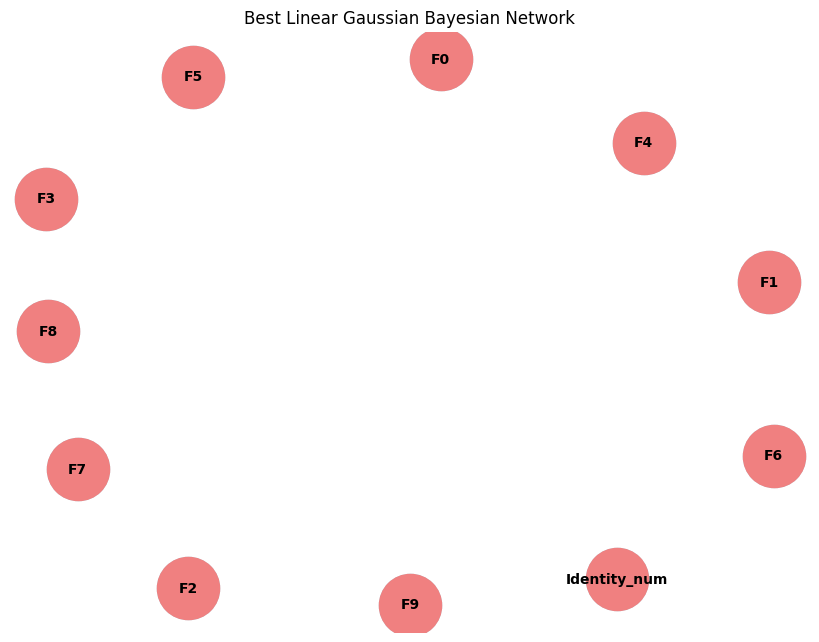

In [ ]:
plot_bn_structure(best_lgbn["lgbn"], title=f"Best Linear Gaussian Bayesian Network")

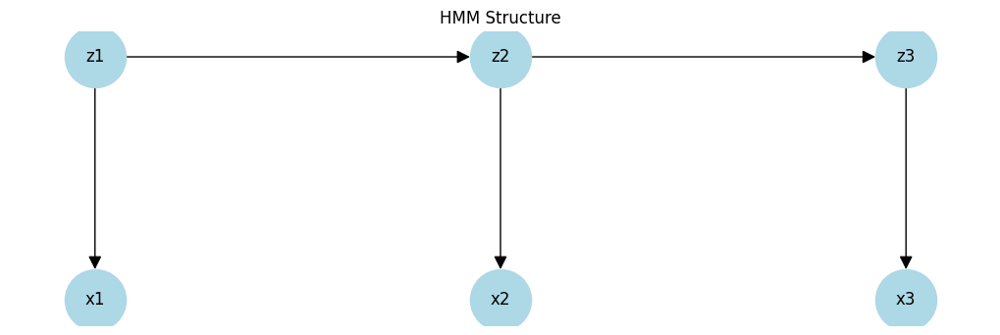

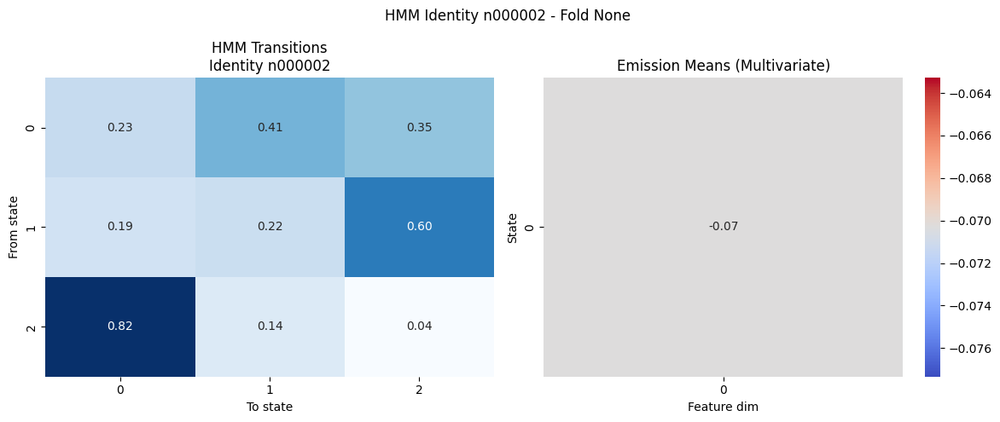

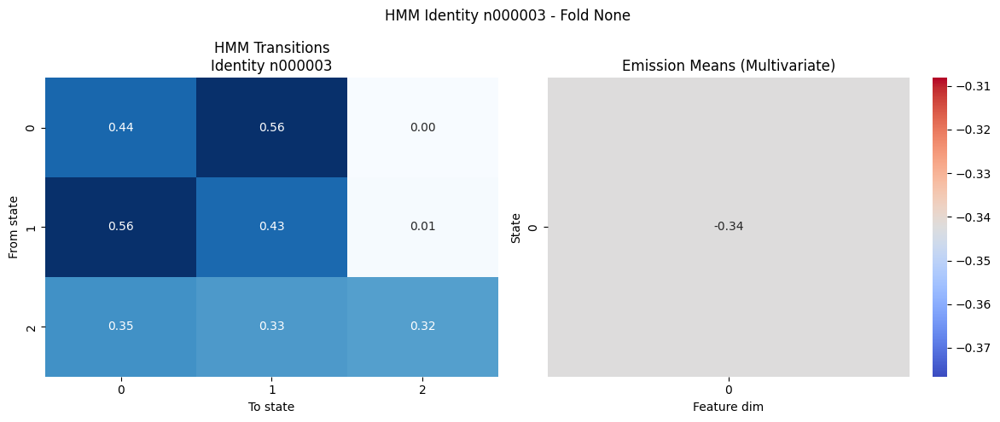

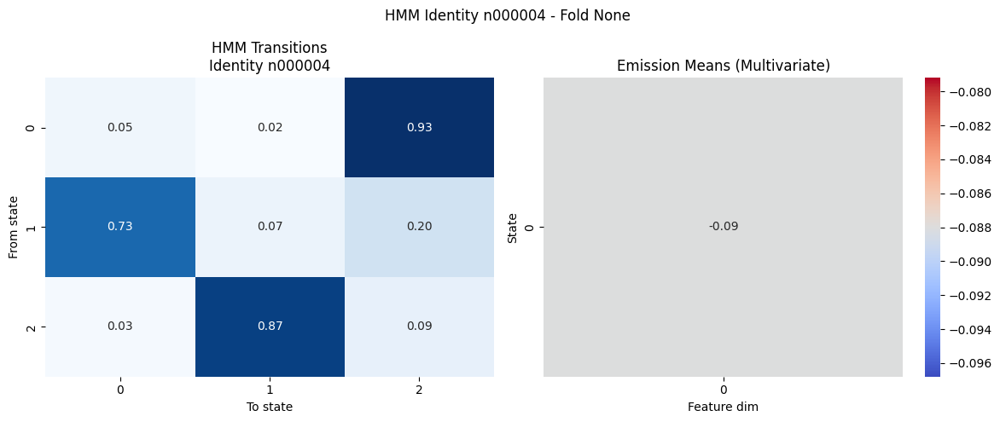

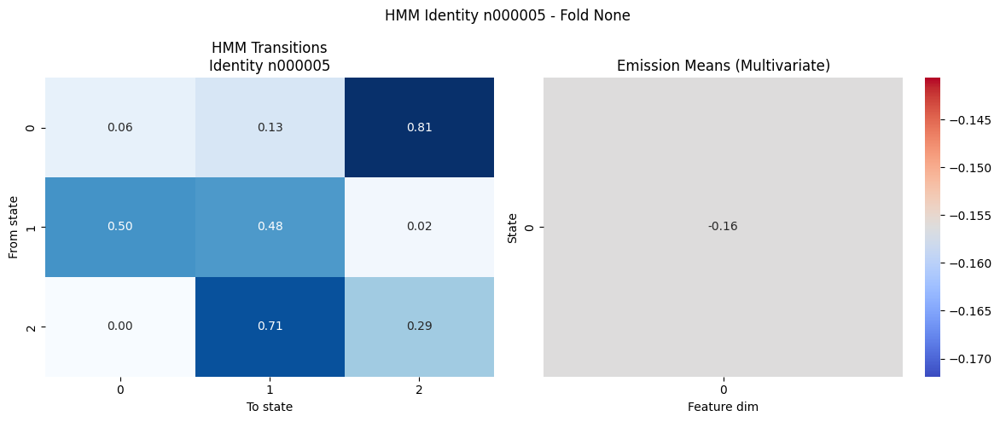

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


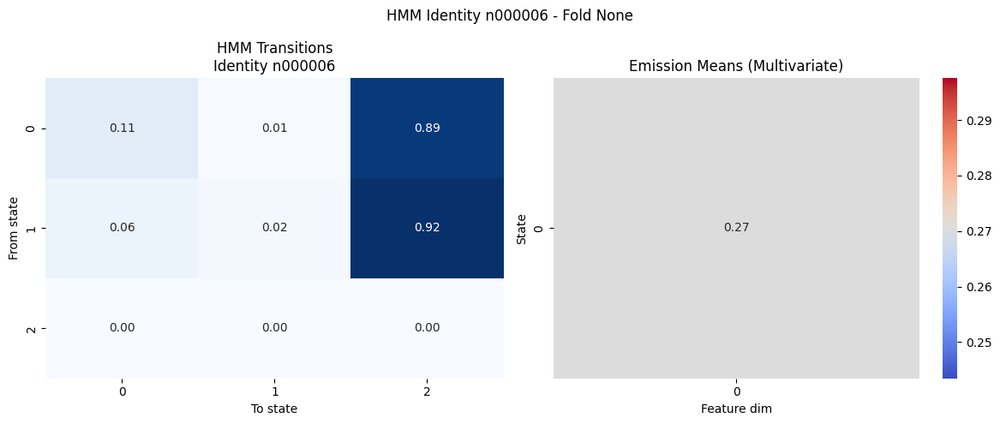

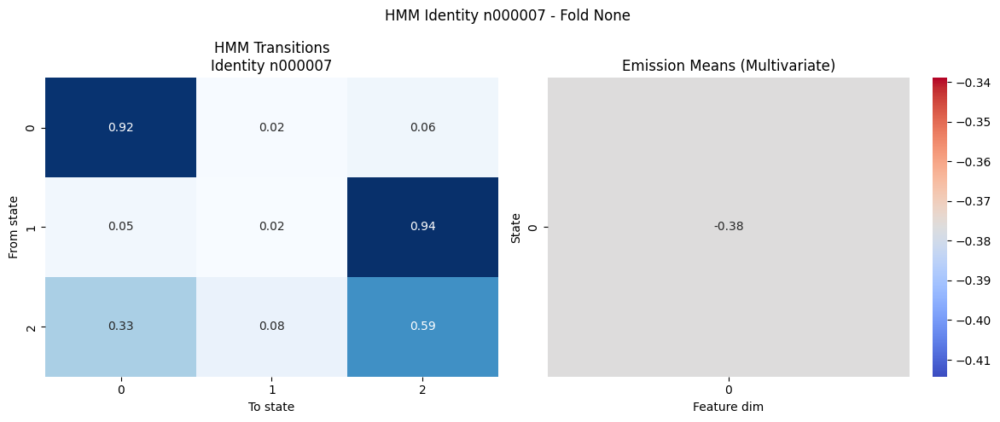

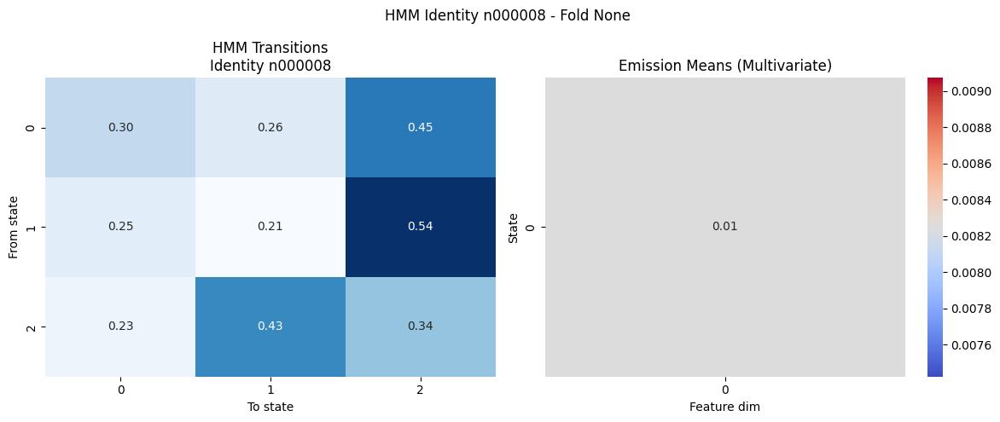

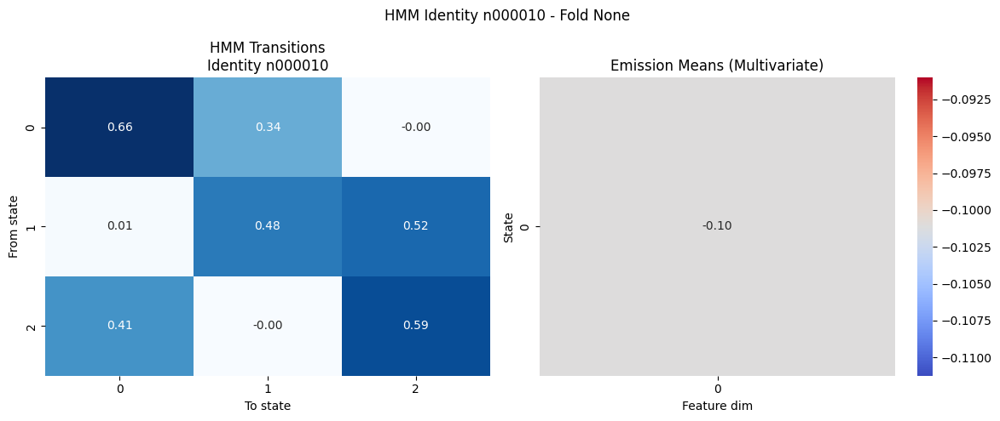

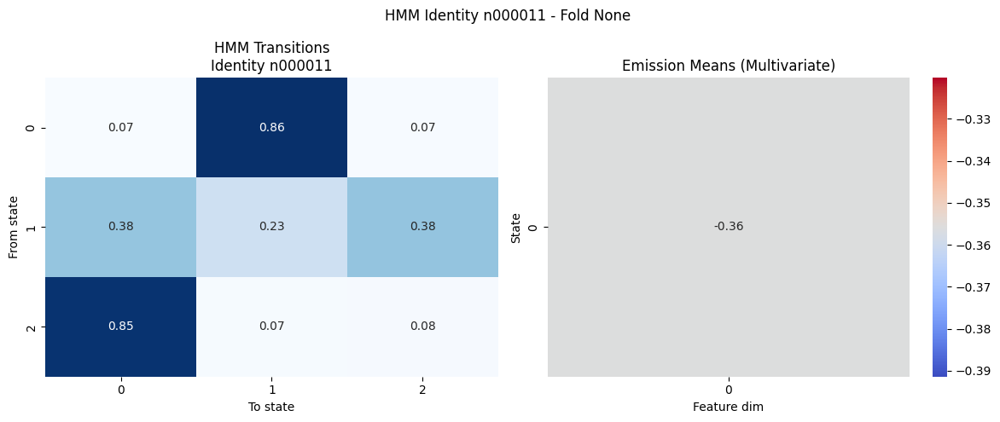

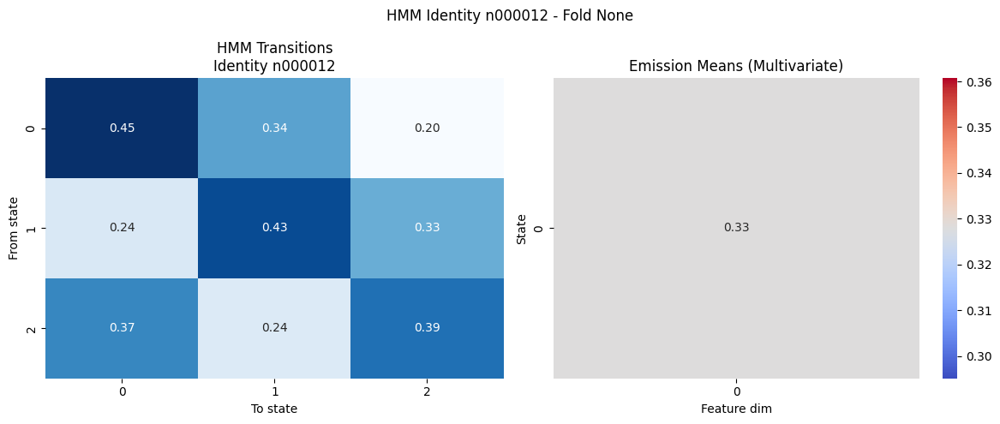

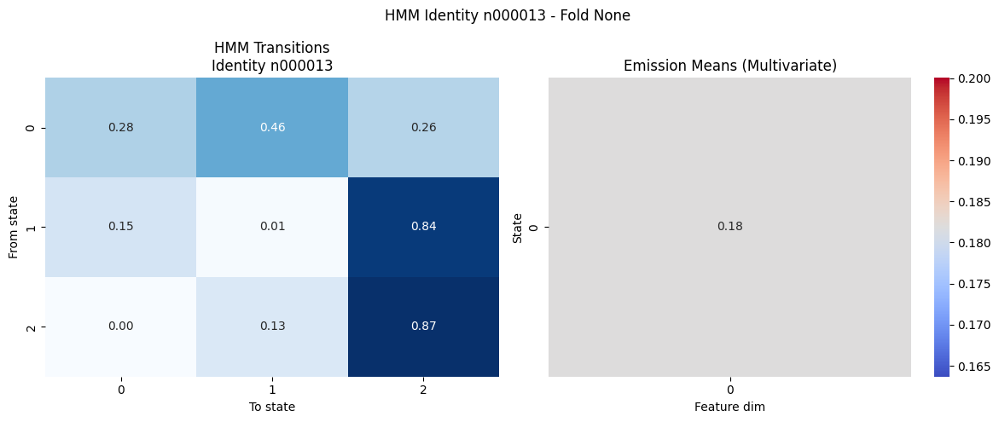

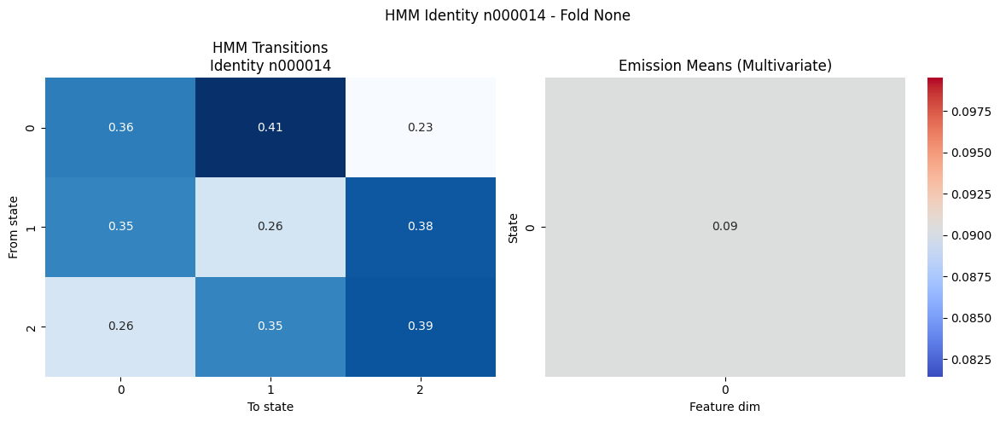

/tmp/ipython-input-3873288650.py:8: RuntimeWarning: invalid value encountered in divide
  trans_norm = trans / trans.sum(axis=1, keepdims=True)


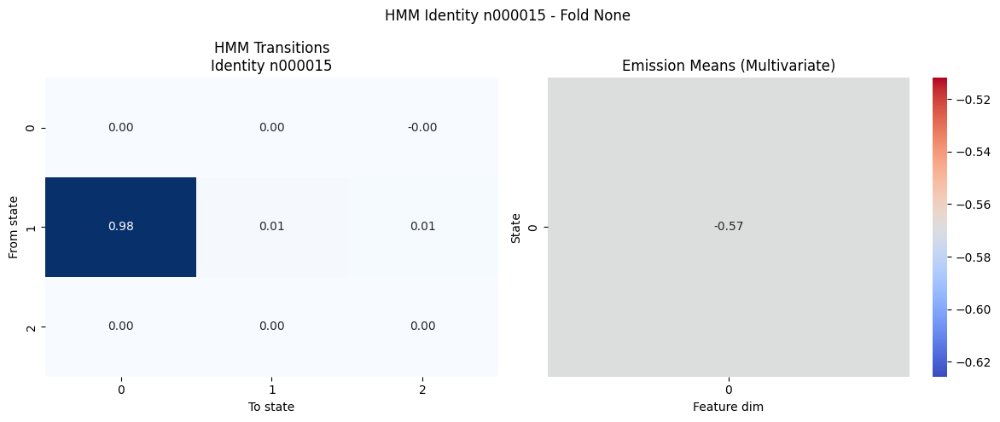

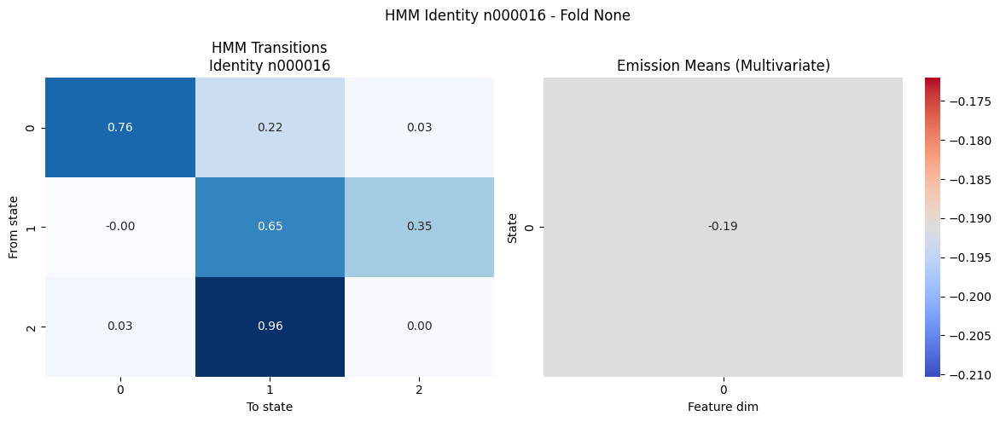

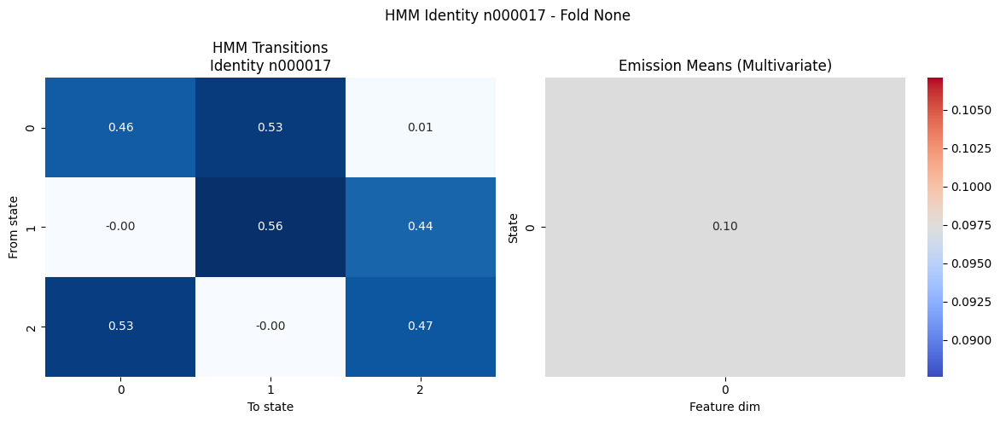

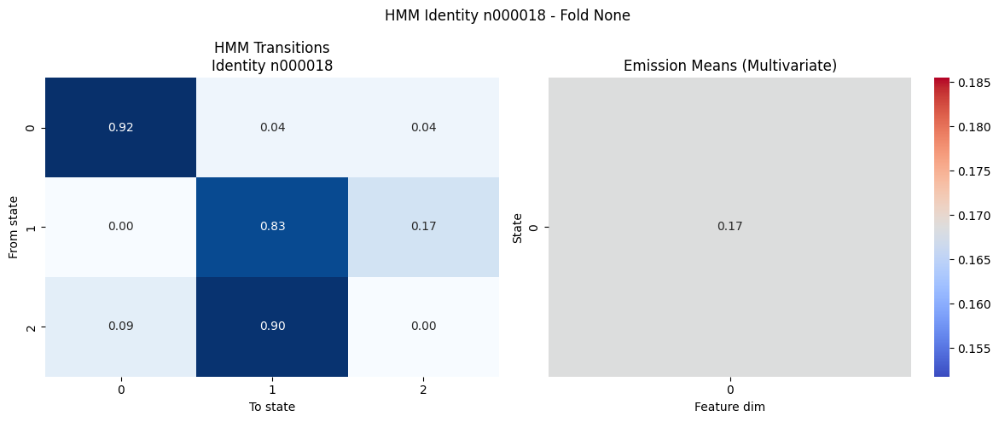

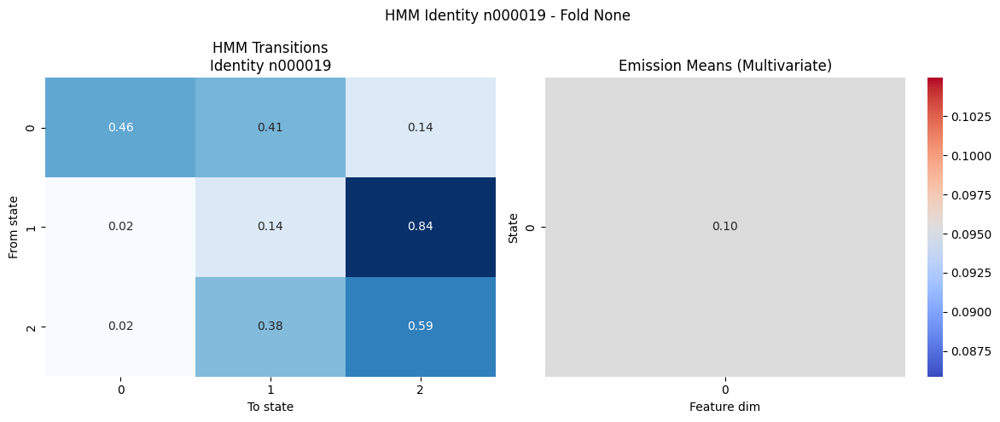

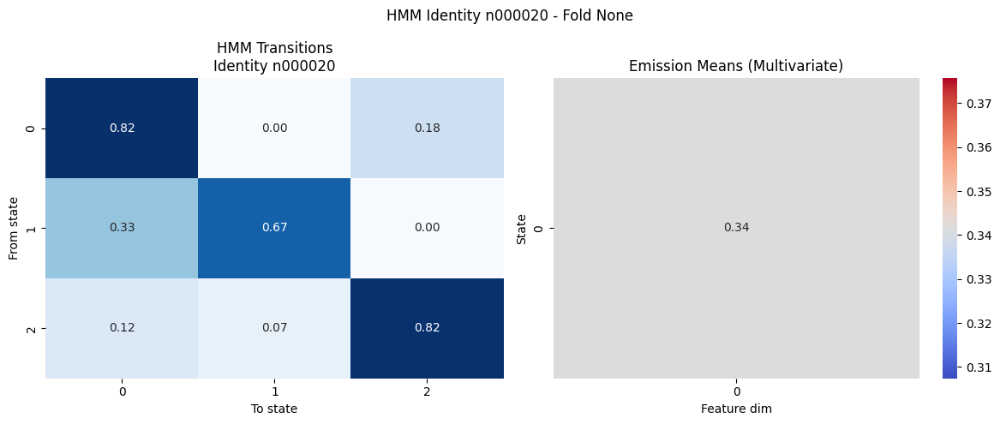

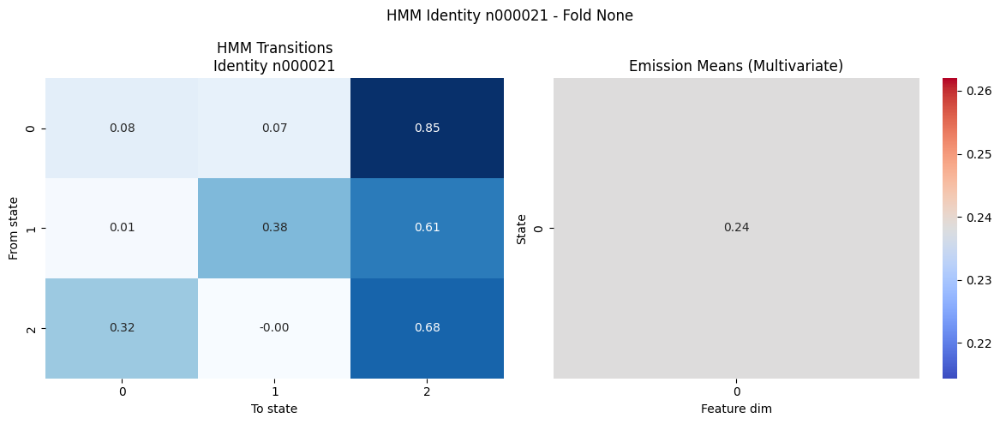

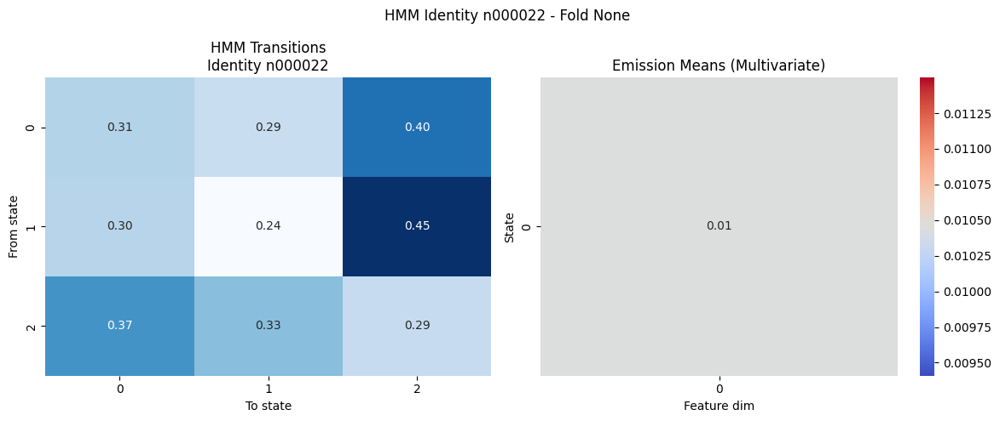

In [ ]:
plot_hmm_structure(best_hmm["models"], n_states=3)
plot_hmm_models(best_hmm["models"])

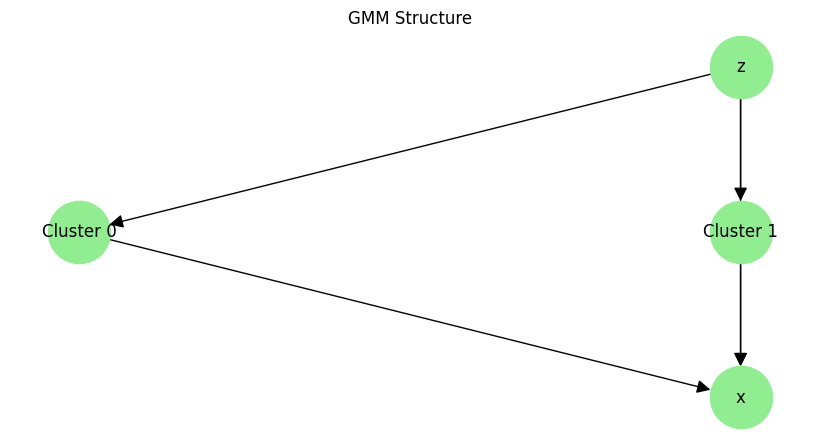

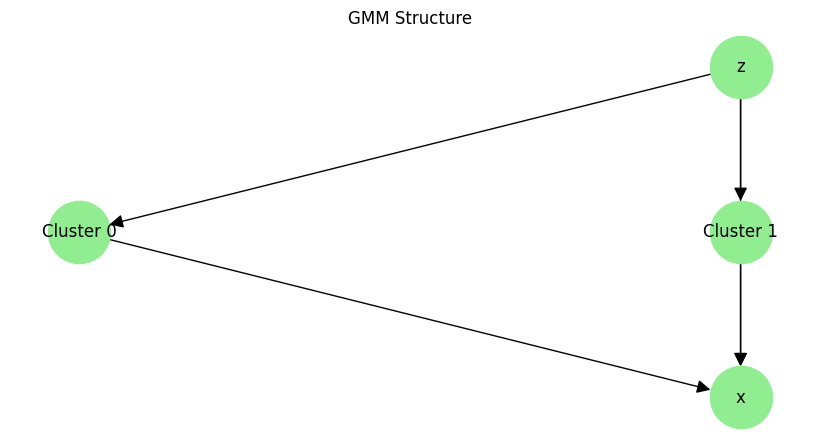

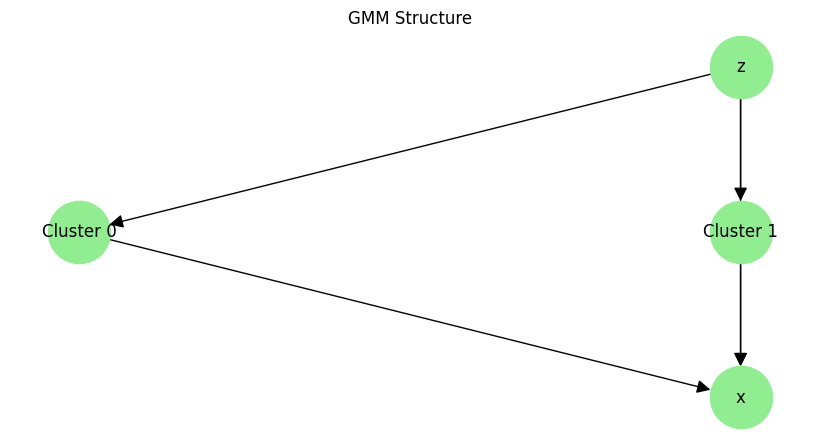

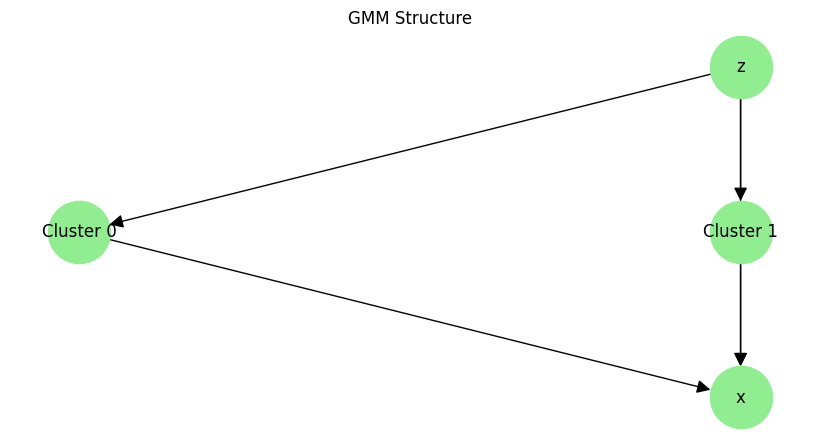

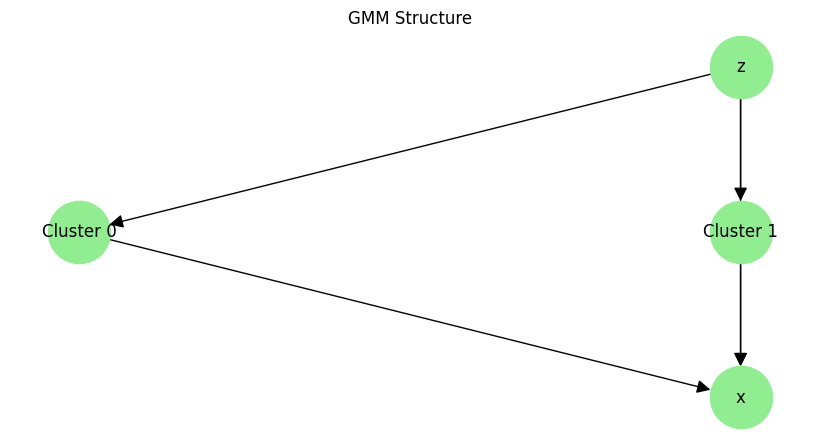

...

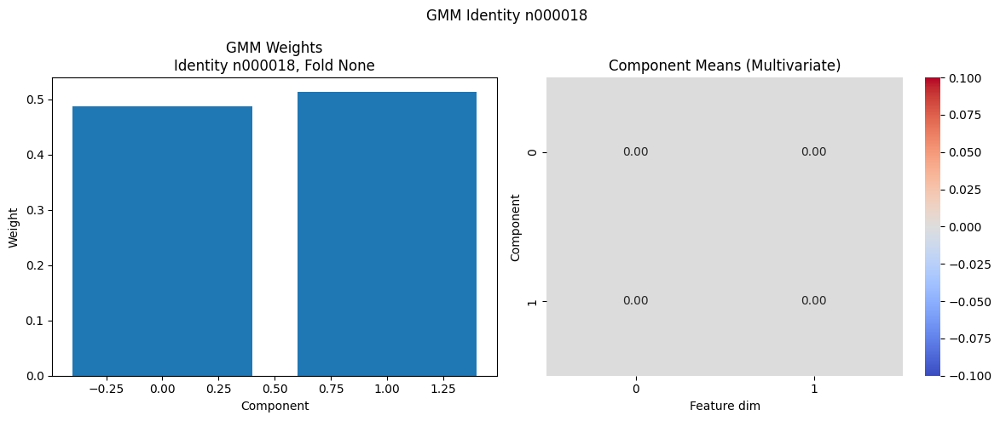

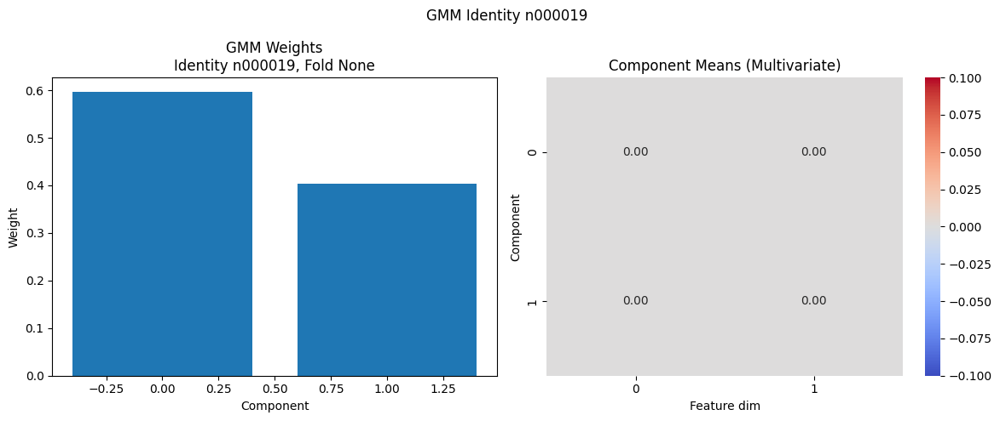

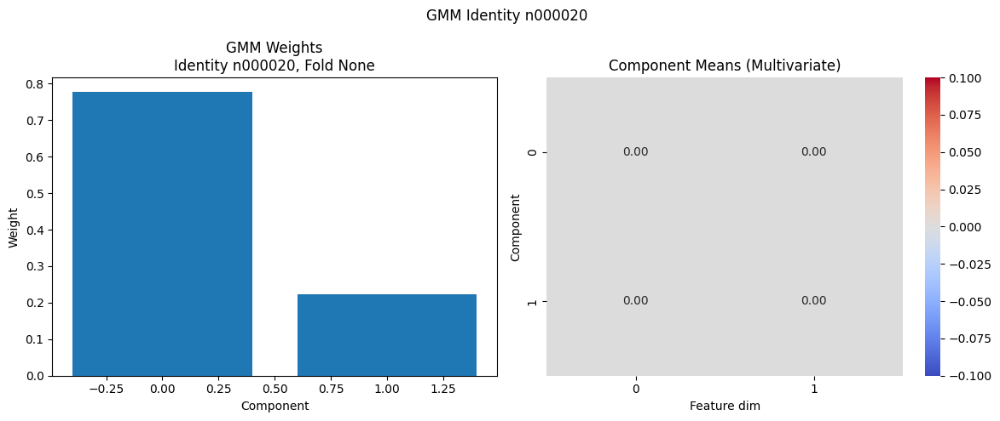

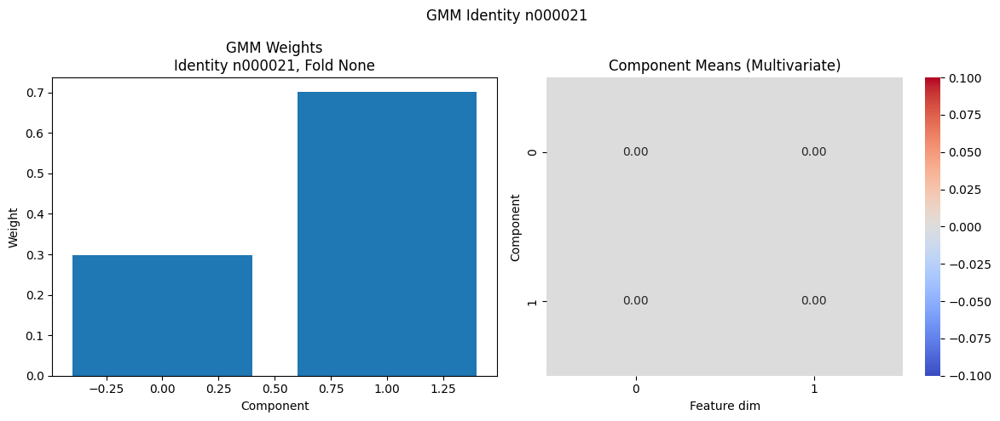

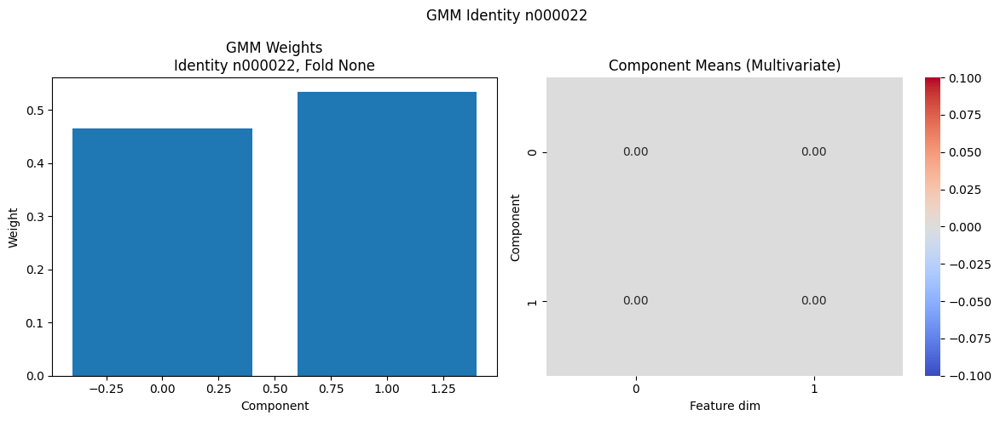

In [ ]:
plot_gmm_structure(best_gmm["models"])
plot_gmm_models(best_gmm["models"])

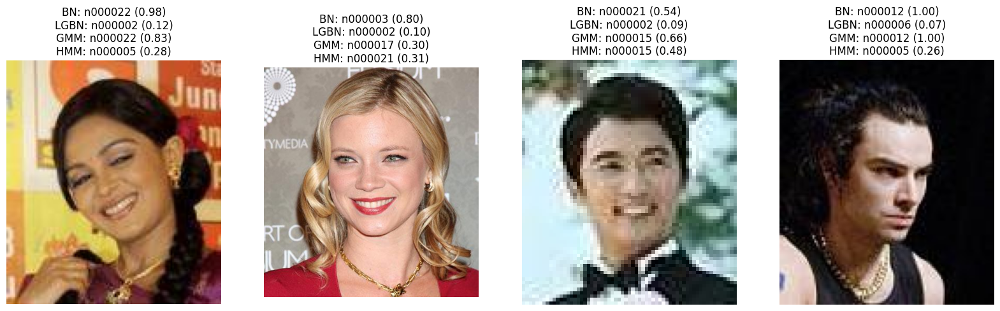

In [ ]:
demo_face_identification(path + "/train", n_samples=4,
                         bn_model=best_bn,
                         lgbn_model=best_lgbn,
                         hmm_model=best_hmm,
                         gmm_model=best_gmm)